# Afriat

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
torch.cuda.is_available()

False

In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "biolord_afriat.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata

AnnData object with n_obs × n_vars = 19053 × 5000
    obs: 'mouse', 'experiment', 'time_int', 'time_cat', 'zone', 'status_control'

In [6]:
asdp_1 = adata.X.sum()

In [7]:
ratio_true=0.995

from tardis._utils.functions import create_random_mask
mask = create_random_mask(adata.shape[1], ratio_true=ratio_true, seed=2024)
adata.X[:, mask] = 0.0

In [8]:
asdp_2 = adata.X.sum()

In [9]:
mask.sum()/adata.shape[1],  1-asdp_2/asdp_1

(0.9956, 0.9944494129158556)

In [10]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|status_control",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 256,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|zone",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|time_cat",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    ),
    dict(
        metric_identifier = "metric_mi|mouse",
        training_set = ["train"],
        every_n_epoch = 5,
        subsample = 1.0,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 128,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [11]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "status_control",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "time_cat",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    ),
    dict(
        obs_key = "zone",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [12]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(24 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.25,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=128,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=1e-4,
        weight_decay=1e-4,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['zone', 'status_control', 'time_cat', 'mouse']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    f"afriat_v2_4_ablation_{ratio_true}"
)

vae.save(
    dir_path,
    overwrite=True,
)

/home/icb/kemal.inecik/work/codes/tardis/tardis/_mymodel.py:81: UserWarning: This dataset has some empty cells, this might fail inference.Data should be filtered with `scanpy.pp.filter_cells()`
  library_log_means, library_log_vars = _init_library_size(self.adata_manager, n_batch)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_figures
ID: qbxpmaa5
Name: fresh-dust-132
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_figures/runs/qbxpmaa5
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240503_120422-qbxpmaa5/files



GPU available: False, used: False


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "
SLURM auto-requeueing enabled. Setting signal handlers.


Training:   0%|                                                                                                                                                                                                                                 | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|                                                                                                                                                                                                                              | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `training` set. Number of elements in each group: 2591,3302,9350
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `training` set. Number of elements in each group: 2591,2545,1696,3423,1635,3353
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `training` set. Number of elements in each group: 4480,10763
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `status_control` for `validation` set. Number of elements in each group: 614,807,2389
  possible_indices = CachedPossibleGroupDefinitionIndices.get(
/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `time_cat` for `validation` set. Number of elements in each group: 614,657,412,867,414,846
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `zone` for `validation` set. Number of elements in each group: 1104,2706
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|▎                                                                                                                                                                                                                   | 1/600 [00:12<2:08:35, 12.88s/it]

Epoch 1/600:   0%|▎                                                                                                                                                           | 1/600 [00:12<2:08:35, 12.88s/it, v_num=a5_1, total_loss_train=45.8, kl_local_train=29.5]

Epoch 2/600:   0%|▎                                                                                                                                                           | 1/600 [00:12<2:08:35, 12.88s/it, v_num=a5_1, total_loss_train=45.8, kl_local_train=29.5]

Epoch 2/600:   0%|▌                                                                                                                                                           | 2/600 [00:24<2:02:41, 12.31s/it, v_num=a5_1, total_loss_train=45.8, kl_local_train=29.5]

Epoch 2/600:   0%|▌                                                                                                                                                           | 2/600 [00:24<2:02:41, 12.31s/it, v_num=a5_1, total_loss_train=22.5, kl_local_train=40.4]

Epoch 3/600:   0%|▌                                                                                                                                                           | 2/600 [00:24<2:02:41, 12.31s/it, v_num=a5_1, total_loss_train=22.5, kl_local_train=40.4]

Epoch 3/600:   0%|▊                                                                                                                                                           | 3/600 [00:36<1:59:58, 12.06s/it, v_num=a5_1, total_loss_train=22.5, kl_local_train=40.4]

Epoch 3/600:   0%|▊                                                                                                                                                           | 3/600 [00:36<1:59:58, 12.06s/it, v_num=a5_1, total_loss_train=18.3, kl_local_train=34.3]

Epoch 4/600:   0%|▊                                                                                                                                                           | 3/600 [00:36<1:59:58, 12.06s/it, v_num=a5_1, total_loss_train=18.3, kl_local_train=34.3]

Epoch 4/600:   1%|█                                                                                                                                                           | 4/600 [00:48<1:59:00, 11.98s/it, v_num=a5_1, total_loss_train=18.3, kl_local_train=34.3]

Epoch 4/600:   1%|█                                                                                                                                                           | 4/600 [00:48<1:59:00, 11.98s/it, v_num=a5_1, total_loss_train=17.3, kl_local_train=22.7]

Epoch 5/600:   1%|█                                                                                                                                                           | 4/600 [00:48<1:59:00, 11.98s/it, v_num=a5_1, total_loss_train=17.3, kl_local_train=22.7]

Epoch 5/600:   1%|█▎                                                                                                                                                          | 5/600 [01:00<1:58:39, 11.96s/it, v_num=a5_1, total_loss_train=17.3, kl_local_train=22.7]

Epoch 5/600:   1%|█▎                                                                                                                                                          | 5/600 [01:00<1:58:39, 11.96s/it, v_num=a5_1, total_loss_train=16.8, kl_local_train=14.1]

Epoch 6/600:   1%|█▎                                                                                                                                                          | 5/600 [01:01<1:58:39, 11.96s/it, v_num=a5_1, total_loss_train=16.8, kl_local_train=14.1]

Epoch 6/600:   1%|█▌                                                                                                                                                          | 6/600 [01:12<2:00:11, 12.14s/it, v_num=a5_1, total_loss_train=16.8, kl_local_train=14.1]

Epoch 6/600:   1%|▏                       | 6/600 [01:12<2:00:11, 12.14s/it, v_num=a5_1, total_loss_train=16.5, kl_local_train=12.1, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.00774, metric_mi|time_cat_train=0.0161, metric_mi|mouse_train=0.0378]

Epoch 7/600:   1%|▏                       | 6/600 [01:12<2:00:11, 12.14s/it, v_num=a5_1, total_loss_train=16.5, kl_local_train=12.1, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.00774, metric_mi|time_cat_train=0.0161, metric_mi|mouse_train=0.0378]

Epoch 7/600:   1%|▎                       | 7/600 [01:24<1:57:03, 11.84s/it, v_num=a5_1, total_loss_train=16.5, kl_local_train=12.1, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.00774, metric_mi|time_cat_train=0.0161, metric_mi|mouse_train=0.0378]

Epoch 7/600:   1%|▎                       | 7/600 [01:24<1:57:03, 11.84s/it, v_num=a5_1, total_loss_train=16.2, kl_local_train=11.2, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.00774, metric_mi|time_cat_train=0.0161, metric_mi|mouse_train=0.0378]

Epoch 8/600:   1%|▎                       | 7/600 [01:24<1:57:03, 11.84s/it, v_num=a5_1, total_loss_train=16.2, kl_local_train=11.2, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.00774, metric_mi|time_cat_train=0.0161, metric_mi|mouse_train=0.0378]

Epoch 8/600:   1%|▎                       | 8/600 [01:35<1:54:49, 11.64s/it, v_num=a5_1, total_loss_train=16.2, kl_local_train=11.2, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.00774, metric_mi|time_cat_train=0.0161, metric_mi|mouse_train=0.0378]

Epoch 8/600:   1%|▎                         | 8/600 [01:35<1:54:49, 11.64s/it, v_num=a5_1, total_loss_train=23.8, kl_local_train=11, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.00774, metric_mi|time_cat_train=0.0161, metric_mi|mouse_train=0.0378]

Epoch 9/600:   1%|▎                         | 8/600 [01:35<1:54:49, 11.64s/it, v_num=a5_1, total_loss_train=23.8, kl_local_train=11, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.00774, metric_mi|time_cat_train=0.0161, metric_mi|mouse_train=0.0378]

Epoch 9/600:   2%|▍                         | 9/600 [01:46<1:53:21, 11.51s/it, v_num=a5_1, total_loss_train=23.8, kl_local_train=11, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.00774, metric_mi|time_cat_train=0.0161, metric_mi|mouse_train=0.0378]

Epoch 9/600:   2%|▍                         | 9/600 [01:46<1:53:21, 11.51s/it, v_num=a5_1, total_loss_train=31.1, kl_local_train=21, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.00774, metric_mi|time_cat_train=0.0161, metric_mi|mouse_train=0.0378]

Epoch 10/600:   2%|▍                        | 9/600 [01:46<1:53:21, 11.51s/it, v_num=a5_1, total_loss_train=31.1, kl_local_train=21, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.00774, metric_mi|time_cat_train=0.0161, metric_mi|mouse_train=0.0378]

Epoch 10/600:   2%|▍                       | 10/600 [01:57<1:52:50, 11.48s/it, v_num=a5_1, total_loss_train=31.1, kl_local_train=21, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.00774, metric_mi|time_cat_train=0.0161, metric_mi|mouse_train=0.0378]

Epoch 10/600:   2%|▎                     | 10/600 [01:57<1:52:50, 11.48s/it, v_num=a5_1, total_loss_train=34.5, kl_local_train=70.2, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.00774, metric_mi|time_cat_train=0.0161, metric_mi|mouse_train=0.0378]

Epoch 11/600:   2%|▎                     | 10/600 [01:59<1:52:50, 11.48s/it, v_num=a5_1, total_loss_train=34.5, kl_local_train=70.2, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.00774, metric_mi|time_cat_train=0.0161, metric_mi|mouse_train=0.0378]

Epoch 11/600:   2%|▍                     | 11/600 [02:10<1:55:34, 11.77s/it, v_num=a5_1, total_loss_train=34.5, kl_local_train=70.2, metric_mi|status_control_train=0.0225, metric_mi|zone_train=0.00774, metric_mi|time_cat_train=0.0161, metric_mi|mouse_train=0.0378]

Epoch 11/600:   2%|▍                       | 11/600 [02:10<1:55:34, 11.77s/it, v_num=a5_1, total_loss_train=38.3, kl_local_train=82.5, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.0869, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0632]

Epoch 12/600:   2%|▍                       | 11/600 [02:10<1:55:34, 11.77s/it, v_num=a5_1, total_loss_train=38.3, kl_local_train=82.5, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.0869, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0632]

Epoch 12/600:   2%|▍                       | 12/600 [02:21<1:53:43, 11.60s/it, v_num=a5_1, total_loss_train=38.3, kl_local_train=82.5, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.0869, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0632]

Epoch 12/600:   2%|▍                       | 12/600 [02:21<1:53:43, 11.60s/it, v_num=a5_1, total_loss_train=42.2, kl_local_train=90.2, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.0869, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0632]

Epoch 13/600:   2%|▍                       | 12/600 [02:21<1:53:43, 11.60s/it, v_num=a5_1, total_loss_train=42.2, kl_local_train=90.2, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.0869, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0632]

Epoch 13/600:   2%|▌                       | 13/600 [02:32<1:52:26, 11.49s/it, v_num=a5_1, total_loss_train=42.2, kl_local_train=90.2, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.0869, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0632]

Epoch 13/600:   2%|▌                          | 13/600 [02:32<1:52:26, 11.49s/it, v_num=a5_1, total_loss_train=46, kl_local_train=116, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.0869, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0632]

Epoch 14/600:   2%|▌                          | 13/600 [02:32<1:52:26, 11.49s/it, v_num=a5_1, total_loss_train=46, kl_local_train=116, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.0869, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0632]

Epoch 14/600:   2%|▋                          | 14/600 [02:44<1:51:26, 11.41s/it, v_num=a5_1, total_loss_train=46, kl_local_train=116, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.0869, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0632]

Epoch 14/600:   2%|▋                          | 14/600 [02:44<1:51:26, 11.41s/it, v_num=a5_1, total_loss_train=50, kl_local_train=132, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.0869, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0632]

Epoch 15/600:   2%|▋                          | 14/600 [02:44<1:51:26, 11.41s/it, v_num=a5_1, total_loss_train=50, kl_local_train=132, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.0869, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0632]

Epoch 15/600:   2%|▋                          | 15/600 [02:55<1:50:56, 11.38s/it, v_num=a5_1, total_loss_train=50, kl_local_train=132, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.0869, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0632]

Epoch 15/600:   2%|▋                        | 15/600 [02:55<1:50:56, 11.38s/it, v_num=a5_1, total_loss_train=54.1, kl_local_train=143, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.0869, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0632]

Epoch 16/600:   2%|▋                        | 15/600 [02:56<1:50:56, 11.38s/it, v_num=a5_1, total_loss_train=54.1, kl_local_train=143, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.0869, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0632]

Epoch 16/600:   3%|▋                        | 16/600 [03:07<1:53:56, 11.71s/it, v_num=a5_1, total_loss_train=54.1, kl_local_train=143, metric_mi|status_control_train=0.156, metric_mi|zone_train=0.0869, metric_mi|time_cat_train=0.0569, metric_mi|mouse_train=0.0632]

Epoch 16/600:   3%|▊                            | 16/600 [03:07<1:53:56, 11.71s/it, v_num=a5_1, total_loss_train=58.2, kl_local_train=144, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 17/600:   3%|▊                            | 16/600 [03:07<1:53:56, 11.71s/it, v_num=a5_1, total_loss_train=58.2, kl_local_train=144, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 17/600:   3%|▊                            | 17/600 [03:19<1:52:25, 11.57s/it, v_num=a5_1, total_loss_train=58.2, kl_local_train=144, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 17/600:   3%|▊                            | 17/600 [03:19<1:52:25, 11.57s/it, v_num=a5_1, total_loss_train=62.3, kl_local_train=137, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 18/600:   3%|▊                            | 17/600 [03:19<1:52:25, 11.57s/it, v_num=a5_1, total_loss_train=62.3, kl_local_train=137, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 18/600:   3%|▊                            | 18/600 [03:30<1:51:16, 11.47s/it, v_num=a5_1, total_loss_train=62.3, kl_local_train=137, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 18/600:   3%|▊                            | 18/600 [03:30<1:51:16, 11.47s/it, v_num=a5_1, total_loss_train=66.3, kl_local_train=136, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 19/600:   3%|▊                            | 18/600 [03:30<1:51:16, 11.47s/it, v_num=a5_1, total_loss_train=66.3, kl_local_train=136, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 19/600:   3%|▉                            | 19/600 [03:41<1:50:20, 11.40s/it, v_num=a5_1, total_loss_train=66.3, kl_local_train=136, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 19/600:   3%|▉                            | 19/600 [03:41<1:50:20, 11.40s/it, v_num=a5_1, total_loss_train=70.6, kl_local_train=138, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 20/600:   3%|▉                            | 19/600 [03:41<1:50:20, 11.40s/it, v_num=a5_1, total_loss_train=70.6, kl_local_train=138, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 20/600:   3%|▉                            | 20/600 [03:52<1:50:00, 11.38s/it, v_num=a5_1, total_loss_train=70.6, kl_local_train=138, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 20/600:   3%|▉                            | 20/600 [03:52<1:50:00, 11.38s/it, v_num=a5_1, total_loss_train=74.9, kl_local_train=140, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 21/600:   3%|▉                            | 20/600 [03:54<1:50:00, 11.38s/it, v_num=a5_1, total_loss_train=74.9, kl_local_train=140, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 21/600:   4%|█                            | 21/600 [04:05<1:53:22, 11.75s/it, v_num=a5_1, total_loss_train=74.9, kl_local_train=140, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.132]

Epoch 21/600:   4%|█                             | 21/600 [04:05<1:53:22, 11.75s/it, v_num=a5_1, total_loss_train=79, kl_local_train=140, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 22/600:   4%|█                             | 21/600 [04:05<1:53:22, 11.75s/it, v_num=a5_1, total_loss_train=79, kl_local_train=140, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 22/600:   4%|█                             | 22/600 [04:16<1:52:09, 11.64s/it, v_num=a5_1, total_loss_train=79, kl_local_train=140, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 22/600:   4%|█                           | 22/600 [04:16<1:52:09, 11.64s/it, v_num=a5_1, total_loss_train=83.4, kl_local_train=141, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 23/600:   4%|█                           | 22/600 [04:16<1:52:09, 11.64s/it, v_num=a5_1, total_loss_train=83.4, kl_local_train=141, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 23/600:   4%|█                           | 23/600 [04:28<1:51:13, 11.57s/it, v_num=a5_1, total_loss_train=83.4, kl_local_train=141, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 23/600:   4%|█                           | 23/600 [04:28<1:51:13, 11.57s/it, v_num=a5_1, total_loss_train=87.6, kl_local_train=143, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 24/600:   4%|█                           | 23/600 [04:28<1:51:13, 11.57s/it, v_num=a5_1, total_loss_train=87.6, kl_local_train=143, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 24/600:   4%|█                           | 24/600 [04:39<1:50:32, 11.51s/it, v_num=a5_1, total_loss_train=87.6, kl_local_train=143, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 24/600:   4%|█                           | 24/600 [04:39<1:50:32, 11.51s/it, v_num=a5_1, total_loss_train=91.9, kl_local_train=143, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 25/600:   4%|█                           | 24/600 [04:39<1:50:32, 11.51s/it, v_num=a5_1, total_loss_train=91.9, kl_local_train=143, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 25/600:   4%|█▏                          | 25/600 [04:51<1:50:06, 11.49s/it, v_num=a5_1, total_loss_train=91.9, kl_local_train=143, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 25/600:   4%|█▎                            | 25/600 [04:51<1:50:06, 11.49s/it, v_num=a5_1, total_loss_train=96, kl_local_train=145, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 26/600:   4%|█▎                            | 25/600 [04:52<1:50:06, 11.49s/it, v_num=a5_1, total_loss_train=96, kl_local_train=145, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 26/600:   4%|█▎                            | 26/600 [05:03<1:53:08, 11.83s/it, v_num=a5_1, total_loss_train=96, kl_local_train=145, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 26/600:   4%|█▎                            | 26/600 [05:03<1:53:08, 11.83s/it, v_num=a5_1, total_loss_train=100, kl_local_train=144, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 27/600:   4%|█▎                            | 26/600 [05:03<1:53:08, 11.83s/it, v_num=a5_1, total_loss_train=100, kl_local_train=144, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 27/600:   4%|█▎                            | 27/600 [05:14<1:51:31, 11.68s/it, v_num=a5_1, total_loss_train=100, kl_local_train=144, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 27/600:   4%|█▎                            | 27/600 [05:15<1:51:31, 11.68s/it, v_num=a5_1, total_loss_train=105, kl_local_train=145, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 28/600:   4%|█▎                            | 27/600 [05:15<1:51:31, 11.68s/it, v_num=a5_1, total_loss_train=105, kl_local_train=145, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 28/600:   5%|█▍                            | 28/600 [05:26<1:50:18, 11.57s/it, v_num=a5_1, total_loss_train=105, kl_local_train=145, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 28/600:   5%|█▍                            | 28/600 [05:26<1:50:18, 11.57s/it, v_num=a5_1, total_loss_train=109, kl_local_train=144, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 29/600:   5%|█▍                            | 28/600 [05:26<1:50:18, 11.57s/it, v_num=a5_1, total_loss_train=109, kl_local_train=144, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 29/600:   5%|█▍                            | 29/600 [05:37<1:49:27, 11.50s/it, v_num=a5_1, total_loss_train=109, kl_local_train=144, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 29/600:   5%|█▍                            | 29/600 [05:37<1:49:27, 11.50s/it, v_num=a5_1, total_loss_train=113, kl_local_train=144, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 30/600:   5%|█▍                            | 29/600 [05:37<1:49:27, 11.50s/it, v_num=a5_1, total_loss_train=113, kl_local_train=144, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 30/600:   5%|█▌                            | 30/600 [05:49<1:48:52, 11.46s/it, v_num=a5_1, total_loss_train=113, kl_local_train=144, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 30/600:   5%|█▌                            | 30/600 [05:49<1:48:52, 11.46s/it, v_num=a5_1, total_loss_train=117, kl_local_train=146, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 31/600:   5%|█▌                            | 30/600 [05:50<1:48:52, 11.46s/it, v_num=a5_1, total_loss_train=117, kl_local_train=146, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 31/600:   5%|█▌                            | 31/600 [06:01<1:51:48, 11.79s/it, v_num=a5_1, total_loss_train=117, kl_local_train=146, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 31/600:   5%|█▍                           | 31/600 [06:01<1:51:48, 11.79s/it, v_num=a5_1, total_loss_train=122, kl_local_train=148, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 32/600:   5%|█▍                           | 31/600 [06:01<1:51:48, 11.79s/it, v_num=a5_1, total_loss_train=122, kl_local_train=148, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 32/600:   5%|█▌                           | 32/600 [06:12<1:50:15, 11.65s/it, v_num=a5_1, total_loss_train=122, kl_local_train=148, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 32/600:   5%|█▌                           | 32/600 [06:12<1:50:15, 11.65s/it, v_num=a5_1, total_loss_train=126, kl_local_train=148, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 33/600:   5%|█▌                           | 32/600 [06:12<1:50:15, 11.65s/it, v_num=a5_1, total_loss_train=126, kl_local_train=148, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 33/600:   6%|█▌                           | 33/600 [06:24<1:49:11, 11.55s/it, v_num=a5_1, total_loss_train=126, kl_local_train=148, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 33/600:   6%|█▌                           | 33/600 [06:24<1:49:11, 11.55s/it, v_num=a5_1, total_loss_train=130, kl_local_train=148, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 34/600:   6%|█▌                           | 33/600 [06:24<1:49:11, 11.55s/it, v_num=a5_1, total_loss_train=130, kl_local_train=148, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 34/600:   6%|█▋                           | 34/600 [06:35<1:48:22, 11.49s/it, v_num=a5_1, total_loss_train=130, kl_local_train=148, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 34/600:   6%|█▋                           | 34/600 [06:35<1:48:22, 11.49s/it, v_num=a5_1, total_loss_train=134, kl_local_train=145, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 35/600:   6%|█▋                           | 34/600 [06:35<1:48:22, 11.49s/it, v_num=a5_1, total_loss_train=134, kl_local_train=145, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 35/600:   6%|█▋                           | 35/600 [06:46<1:47:51, 11.45s/it, v_num=a5_1, total_loss_train=134, kl_local_train=145, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 35/600:   6%|█▋                           | 35/600 [06:46<1:47:51, 11.45s/it, v_num=a5_1, total_loss_train=138, kl_local_train=145, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 36/600:   6%|█▋                           | 35/600 [06:48<1:47:51, 11.45s/it, v_num=a5_1, total_loss_train=138, kl_local_train=145, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 36/600:   6%|█▋                           | 36/600 [06:59<1:50:51, 11.79s/it, v_num=a5_1, total_loss_train=138, kl_local_train=145, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 36/600:   6%|█▋                           | 36/600 [06:59<1:50:51, 11.79s/it, v_num=a5_1, total_loss_train=143, kl_local_train=144, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 37/600:   6%|█▋                           | 36/600 [06:59<1:50:51, 11.79s/it, v_num=a5_1, total_loss_train=143, kl_local_train=144, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 37/600:   6%|█▊                           | 37/600 [07:10<1:49:32, 11.67s/it, v_num=a5_1, total_loss_train=143, kl_local_train=144, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 37/600:   6%|█▊                           | 37/600 [07:10<1:49:32, 11.67s/it, v_num=a5_1, total_loss_train=147, kl_local_train=142, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 38/600:   6%|█▊                           | 37/600 [07:10<1:49:32, 11.67s/it, v_num=a5_1, total_loss_train=147, kl_local_train=142, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 38/600:   6%|█▊                           | 38/600 [07:22<1:48:31, 11.59s/it, v_num=a5_1, total_loss_train=147, kl_local_train=142, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 38/600:   6%|█▊                           | 38/600 [07:22<1:48:31, 11.59s/it, v_num=a5_1, total_loss_train=151, kl_local_train=142, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 39/600:   6%|█▊                           | 38/600 [07:22<1:48:31, 11.59s/it, v_num=a5_1, total_loss_train=151, kl_local_train=142, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 39/600:   6%|█▉                           | 39/600 [07:33<1:47:45, 11.52s/it, v_num=a5_1, total_loss_train=151, kl_local_train=142, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 39/600:   6%|█▉                           | 39/600 [07:33<1:47:45, 11.52s/it, v_num=a5_1, total_loss_train=155, kl_local_train=141, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 40/600:   6%|█▉                           | 39/600 [07:33<1:47:45, 11.52s/it, v_num=a5_1, total_loss_train=155, kl_local_train=141, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 40/600:   7%|█▉                           | 40/600 [07:45<1:47:23, 11.51s/it, v_num=a5_1, total_loss_train=155, kl_local_train=141, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 40/600:   7%|█▉                           | 40/600 [07:45<1:47:23, 11.51s/it, v_num=a5_1, total_loss_train=160, kl_local_train=144, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 41/600:   7%|█▉                           | 40/600 [07:46<1:47:23, 11.51s/it, v_num=a5_1, total_loss_train=160, kl_local_train=144, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 41/600:   7%|█▉                           | 41/600 [07:57<1:50:18, 11.84s/it, v_num=a5_1, total_loss_train=160, kl_local_train=144, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 41/600:   7%|█▉                           | 41/600 [07:57<1:50:18, 11.84s/it, v_num=a5_1, total_loss_train=164, kl_local_train=144, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 42/600:   7%|█▉                           | 41/600 [07:57<1:50:18, 11.84s/it, v_num=a5_1, total_loss_train=164, kl_local_train=144, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 42/600:   7%|██                           | 42/600 [08:09<1:48:54, 11.71s/it, v_num=a5_1, total_loss_train=164, kl_local_train=144, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 42/600:   7%|██                           | 42/600 [08:09<1:48:54, 11.71s/it, v_num=a5_1, total_loss_train=168, kl_local_train=145, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 43/600:   7%|██                           | 42/600 [08:09<1:48:54, 11.71s/it, v_num=a5_1, total_loss_train=168, kl_local_train=145, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 43/600:   7%|██                           | 43/600 [08:20<1:47:54, 11.62s/it, v_num=a5_1, total_loss_train=168, kl_local_train=145, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 43/600:   7%|██                           | 43/600 [08:20<1:47:54, 11.62s/it, v_num=a5_1, total_loss_train=173, kl_local_train=147, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 44/600:   7%|██                           | 43/600 [08:20<1:47:54, 11.62s/it, v_num=a5_1, total_loss_train=173, kl_local_train=147, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 44/600:   7%|██▏                          | 44/600 [08:31<1:47:05, 11.56s/it, v_num=a5_1, total_loss_train=173, kl_local_train=147, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 44/600:   7%|██▏                          | 44/600 [08:31<1:47:05, 11.56s/it, v_num=a5_1, total_loss_train=177, kl_local_train=149, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 45/600:   7%|██▏                          | 44/600 [08:32<1:47:05, 11.56s/it, v_num=a5_1, total_loss_train=177, kl_local_train=149, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 45/600:   8%|██▏                          | 45/600 [08:43<1:46:31, 11.52s/it, v_num=a5_1, total_loss_train=177, kl_local_train=149, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 45/600:   8%|██▏                          | 45/600 [08:43<1:46:31, 11.52s/it, v_num=a5_1, total_loss_train=181, kl_local_train=150, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 46/600:   8%|██▏                          | 45/600 [08:44<1:46:31, 11.52s/it, v_num=a5_1, total_loss_train=181, kl_local_train=150, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 46/600:   8%|██▏                          | 46/600 [08:56<1:49:45, 11.89s/it, v_num=a5_1, total_loss_train=181, kl_local_train=150, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 46/600:   8%|██▏                          | 46/600 [08:56<1:49:45, 11.89s/it, v_num=a5_1, total_loss_train=185, kl_local_train=148, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 47/600:   8%|██▏                          | 46/600 [08:56<1:49:45, 11.89s/it, v_num=a5_1, total_loss_train=185, kl_local_train=148, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 47/600:   8%|██▎                          | 47/600 [09:07<1:48:31, 11.78s/it, v_num=a5_1, total_loss_train=185, kl_local_train=148, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 47/600:   8%|██▎                          | 47/600 [09:07<1:48:31, 11.78s/it, v_num=a5_1, total_loss_train=190, kl_local_train=148, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 48/600:   8%|██▎                          | 47/600 [09:07<1:48:31, 11.78s/it, v_num=a5_1, total_loss_train=190, kl_local_train=148, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 48/600:   8%|██▎                          | 48/600 [09:19<1:47:32, 11.69s/it, v_num=a5_1, total_loss_train=190, kl_local_train=148, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 48/600:   8%|██▎                          | 48/600 [09:19<1:47:32, 11.69s/it, v_num=a5_1, total_loss_train=194, kl_local_train=148, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 49/600:   8%|██▎                          | 48/600 [09:19<1:47:32, 11.69s/it, v_num=a5_1, total_loss_train=194, kl_local_train=148, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 49/600:   8%|██▎                          | 49/600 [09:30<1:46:43, 11.62s/it, v_num=a5_1, total_loss_train=194, kl_local_train=148, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 49/600:   8%|██▎                          | 49/600 [09:30<1:46:43, 11.62s/it, v_num=a5_1, total_loss_train=198, kl_local_train=150, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 50/600:   8%|██▎                          | 49/600 [09:30<1:46:43, 11.62s/it, v_num=a5_1, total_loss_train=198, kl_local_train=150, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 50/600:   8%|██▍                          | 50/600 [09:42<1:46:12, 11.59s/it, v_num=a5_1, total_loss_train=198, kl_local_train=150, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 50/600:   8%|██▍                          | 50/600 [09:42<1:46:12, 11.59s/it, v_num=a5_1, total_loss_train=202, kl_local_train=148, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 51/600:   8%|██▍                          | 50/600 [09:43<1:46:12, 11.59s/it, v_num=a5_1, total_loss_train=202, kl_local_train=148, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 51/600:   8%|██▍                          | 51/600 [09:54<1:49:00, 11.91s/it, v_num=a5_1, total_loss_train=202, kl_local_train=148, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 51/600:   8%|██▍                          | 51/600 [09:54<1:49:00, 11.91s/it, v_num=a5_1, total_loss_train=203, kl_local_train=149, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 52/600:   8%|██▍                          | 51/600 [09:54<1:49:00, 11.91s/it, v_num=a5_1, total_loss_train=203, kl_local_train=149, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 52/600:   9%|██▌                          | 52/600 [10:06<1:47:29, 11.77s/it, v_num=a5_1, total_loss_train=203, kl_local_train=149, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 52/600:   9%|██▌                          | 52/600 [10:06<1:47:29, 11.77s/it, v_num=a5_1, total_loss_train=202, kl_local_train=148, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 53/600:   9%|██▌                          | 52/600 [10:06<1:47:29, 11.77s/it, v_num=a5_1, total_loss_train=202, kl_local_train=148, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 53/600:   9%|██▌                          | 53/600 [10:17<1:46:20, 11.66s/it, v_num=a5_1, total_loss_train=202, kl_local_train=148, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 53/600:   9%|██▌                          | 53/600 [10:17<1:46:20, 11.66s/it, v_num=a5_1, total_loss_train=202, kl_local_train=144, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 54/600:   9%|██▌                          | 53/600 [10:17<1:46:20, 11.66s/it, v_num=a5_1, total_loss_train=202, kl_local_train=144, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 54/600:   9%|██▌                          | 54/600 [10:29<1:45:28, 11.59s/it, v_num=a5_1, total_loss_train=202, kl_local_train=144, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 54/600:   9%|██▌                          | 54/600 [10:29<1:45:28, 11.59s/it, v_num=a5_1, total_loss_train=203, kl_local_train=147, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 55/600:   9%|██▌                          | 54/600 [10:29<1:45:28, 11.59s/it, v_num=a5_1, total_loss_train=203, kl_local_train=147, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 55/600:   9%|██▋                          | 55/600 [10:40<1:44:43, 11.53s/it, v_num=a5_1, total_loss_train=203, kl_local_train=147, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 55/600:   9%|██▋                          | 55/600 [10:40<1:44:43, 11.53s/it, v_num=a5_1, total_loss_train=203, kl_local_train=146, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 56/600:   9%|██▋                          | 55/600 [10:41<1:44:43, 11.53s/it, v_num=a5_1, total_loss_train=203, kl_local_train=146, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 56/600:   9%|██▋                          | 56/600 [10:53<1:47:37, 11.87s/it, v_num=a5_1, total_loss_train=203, kl_local_train=146, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 56/600:   9%|██▋                          | 56/600 [10:53<1:47:37, 11.87s/it, v_num=a5_1, total_loss_train=203, kl_local_train=144, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 57/600:   9%|██▋                          | 56/600 [10:53<1:47:37, 11.87s/it, v_num=a5_1, total_loss_train=203, kl_local_train=144, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 57/600:  10%|██▊                          | 57/600 [11:04<1:46:11, 11.73s/it, v_num=a5_1, total_loss_train=203, kl_local_train=144, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 57/600:  10%|██▊                          | 57/600 [11:04<1:46:11, 11.73s/it, v_num=a5_1, total_loss_train=203, kl_local_train=142, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 58/600:  10%|██▊                          | 57/600 [11:04<1:46:11, 11.73s/it, v_num=a5_1, total_loss_train=203, kl_local_train=142, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 58/600:  10%|██▊                          | 58/600 [11:15<1:45:09, 11.64s/it, v_num=a5_1, total_loss_train=203, kl_local_train=142, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 58/600:  10%|██▊                          | 58/600 [11:15<1:45:09, 11.64s/it, v_num=a5_1, total_loss_train=203, kl_local_train=140, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 59/600:  10%|██▊                          | 58/600 [11:15<1:45:09, 11.64s/it, v_num=a5_1, total_loss_train=203, kl_local_train=140, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 59/600:  10%|██▊                          | 59/600 [11:27<1:44:15, 11.56s/it, v_num=a5_1, total_loss_train=203, kl_local_train=140, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 59/600:  10%|██▊                          | 59/600 [11:27<1:44:15, 11.56s/it, v_num=a5_1, total_loss_train=203, kl_local_train=140, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 60/600:  10%|██▊                          | 59/600 [11:27<1:44:15, 11.56s/it, v_num=a5_1, total_loss_train=203, kl_local_train=140, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 60/600:  10%|██▉                          | 60/600 [11:38<1:43:34, 11.51s/it, v_num=a5_1, total_loss_train=203, kl_local_train=140, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 60/600:  10%|██▉                          | 60/600 [11:38<1:43:34, 11.51s/it, v_num=a5_1, total_loss_train=204, kl_local_train=138, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 61/600:  10%|██▉                          | 60/600 [11:39<1:43:34, 11.51s/it, v_num=a5_1, total_loss_train=204, kl_local_train=138, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 61/600:  10%|██▉                          | 61/600 [11:51<1:46:23, 11.84s/it, v_num=a5_1, total_loss_train=204, kl_local_train=138, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 61/600:  10%|██▉                          | 61/600 [11:51<1:46:23, 11.84s/it, v_num=a5_1, total_loss_train=204, kl_local_train=139, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 62/600:  10%|██▉                          | 61/600 [11:51<1:46:23, 11.84s/it, v_num=a5_1, total_loss_train=204, kl_local_train=139, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 62/600:  10%|██▉                          | 62/600 [12:02<1:44:59, 11.71s/it, v_num=a5_1, total_loss_train=204, kl_local_train=139, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 62/600:  10%|██▉                          | 62/600 [12:02<1:44:59, 11.71s/it, v_num=a5_1, total_loss_train=204, kl_local_train=138, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 63/600:  10%|██▉                          | 62/600 [12:02<1:44:59, 11.71s/it, v_num=a5_1, total_loss_train=204, kl_local_train=138, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 63/600:  10%|███                          | 63/600 [12:14<1:43:54, 11.61s/it, v_num=a5_1, total_loss_train=204, kl_local_train=138, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 63/600:  10%|███                          | 63/600 [12:14<1:43:54, 11.61s/it, v_num=a5_1, total_loss_train=204, kl_local_train=134, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 64/600:  10%|███                          | 63/600 [12:14<1:43:54, 11.61s/it, v_num=a5_1, total_loss_train=204, kl_local_train=134, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 64/600:  11%|███                          | 64/600 [12:25<1:43:05, 11.54s/it, v_num=a5_1, total_loss_train=204, kl_local_train=134, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 64/600:  11%|███                          | 64/600 [12:25<1:43:05, 11.54s/it, v_num=a5_1, total_loss_train=204, kl_local_train=133, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 65/600:  11%|███                          | 64/600 [12:25<1:43:05, 11.54s/it, v_num=a5_1, total_loss_train=204, kl_local_train=133, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 65/600:  11%|███▏                         | 65/600 [12:36<1:42:36, 11.51s/it, v_num=a5_1, total_loss_train=204, kl_local_train=133, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 65/600:  11%|███▏                         | 65/600 [12:36<1:42:36, 11.51s/it, v_num=a5_1, total_loss_train=204, kl_local_train=134, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 66/600:  11%|███▏                         | 65/600 [12:38<1:42:36, 11.51s/it, v_num=a5_1, total_loss_train=204, kl_local_train=134, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 66/600:  11%|███▏                         | 66/600 [12:49<1:45:25, 11.84s/it, v_num=a5_1, total_loss_train=204, kl_local_train=134, metric_mi|status_control_train=0.245, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.141]

Epoch 66/600:  11%|███▎                          | 66/600 [12:49<1:45:25, 11.84s/it, v_num=a5_1, total_loss_train=204, kl_local_train=135, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 67/600:  11%|███▎                          | 66/600 [12:49<1:45:25, 11.84s/it, v_num=a5_1, total_loss_train=204, kl_local_train=135, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 67/600:  11%|███▎                          | 67/600 [13:01<1:44:06, 11.72s/it, v_num=a5_1, total_loss_train=204, kl_local_train=135, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 67/600:  11%|███▎                          | 67/600 [13:01<1:44:06, 11.72s/it, v_num=a5_1, total_loss_train=204, kl_local_train=132, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 68/600:  11%|███▎                          | 67/600 [13:01<1:44:06, 11.72s/it, v_num=a5_1, total_loss_train=204, kl_local_train=132, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 68/600:  11%|███▍                          | 68/600 [13:12<1:43:03, 11.62s/it, v_num=a5_1, total_loss_train=204, kl_local_train=132, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 68/600:  11%|███▍                          | 68/600 [13:12<1:43:03, 11.62s/it, v_num=a5_1, total_loss_train=204, kl_local_train=130, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 69/600:  11%|███▍                          | 68/600 [13:12<1:43:03, 11.62s/it, v_num=a5_1, total_loss_train=204, kl_local_train=130, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 69/600:  12%|███▍                          | 69/600 [13:23<1:42:18, 11.56s/it, v_num=a5_1, total_loss_train=204, kl_local_train=130, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 69/600:  12%|███▍                          | 69/600 [13:23<1:42:18, 11.56s/it, v_num=a5_1, total_loss_train=204, kl_local_train=132, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 70/600:  12%|███▍                          | 69/600 [13:23<1:42:18, 11.56s/it, v_num=a5_1, total_loss_train=204, kl_local_train=132, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 70/600:  12%|███▌                          | 70/600 [13:35<1:41:43, 11.52s/it, v_num=a5_1, total_loss_train=204, kl_local_train=132, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 70/600:  12%|███▌                          | 70/600 [13:35<1:41:43, 11.52s/it, v_num=a5_1, total_loss_train=205, kl_local_train=131, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 71/600:  12%|███▌                          | 70/600 [13:36<1:41:43, 11.52s/it, v_num=a5_1, total_loss_train=205, kl_local_train=131, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 71/600:  12%|███▌                          | 71/600 [13:47<1:44:28, 11.85s/it, v_num=a5_1, total_loss_train=205, kl_local_train=131, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.191, metric_mi|mouse_train=0.142]

Epoch 71/600:  12%|███▍                         | 71/600 [13:47<1:44:28, 11.85s/it, v_num=a5_1, total_loss_train=205, kl_local_train=130, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 72/600:  12%|███▍                         | 71/600 [13:47<1:44:28, 11.85s/it, v_num=a5_1, total_loss_train=205, kl_local_train=130, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 72/600:  12%|███▍                         | 72/600 [13:59<1:43:12, 11.73s/it, v_num=a5_1, total_loss_train=205, kl_local_train=130, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 72/600:  12%|███▍                         | 72/600 [13:59<1:43:12, 11.73s/it, v_num=a5_1, total_loss_train=205, kl_local_train=129, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 73/600:  12%|███▍                         | 72/600 [13:59<1:43:12, 11.73s/it, v_num=a5_1, total_loss_train=205, kl_local_train=129, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 73/600:  12%|███▌                         | 73/600 [14:10<1:42:14, 11.64s/it, v_num=a5_1, total_loss_train=205, kl_local_train=129, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 73/600:  12%|███▌                         | 73/600 [14:10<1:42:14, 11.64s/it, v_num=a5_1, total_loss_train=205, kl_local_train=128, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 74/600:  12%|███▌                         | 73/600 [14:10<1:42:14, 11.64s/it, v_num=a5_1, total_loss_train=205, kl_local_train=128, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 74/600:  12%|███▌                         | 74/600 [14:22<1:41:59, 11.63s/it, v_num=a5_1, total_loss_train=205, kl_local_train=128, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 74/600:  12%|███▌                         | 74/600 [14:22<1:41:59, 11.63s/it, v_num=a5_1, total_loss_train=205, kl_local_train=127, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 75/600:  12%|███▌                         | 74/600 [14:22<1:41:59, 11.63s/it, v_num=a5_1, total_loss_train=205, kl_local_train=127, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 75/600:  12%|███▋                         | 75/600 [14:33<1:41:16, 11.57s/it, v_num=a5_1, total_loss_train=205, kl_local_train=127, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 75/600:  12%|███▋                         | 75/600 [14:33<1:41:16, 11.57s/it, v_num=a5_1, total_loss_train=205, kl_local_train=126, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 76/600:  12%|███▋                         | 75/600 [14:35<1:41:16, 11.57s/it, v_num=a5_1, total_loss_train=205, kl_local_train=126, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 76/600:  13%|███▋                         | 76/600 [14:46<1:44:01, 11.91s/it, v_num=a5_1, total_loss_train=205, kl_local_train=126, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 76/600:  13%|███▊                          | 76/600 [14:46<1:44:01, 11.91s/it, v_num=a5_1, total_loss_train=205, kl_local_train=125, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 77/600:  13%|███▊                          | 76/600 [14:46<1:44:01, 11.91s/it, v_num=a5_1, total_loss_train=205, kl_local_train=125, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 77/600:  13%|███▊                          | 77/600 [14:57<1:42:37, 11.77s/it, v_num=a5_1, total_loss_train=205, kl_local_train=125, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 77/600:  13%|███▊                          | 77/600 [14:57<1:42:37, 11.77s/it, v_num=a5_1, total_loss_train=205, kl_local_train=124, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 78/600:  13%|███▊                          | 77/600 [14:57<1:42:37, 11.77s/it, v_num=a5_1, total_loss_train=205, kl_local_train=124, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 78/600:  13%|███▉                          | 78/600 [15:09<1:41:32, 11.67s/it, v_num=a5_1, total_loss_train=205, kl_local_train=124, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 78/600:  13%|███▉                          | 78/600 [15:09<1:41:32, 11.67s/it, v_num=a5_1, total_loss_train=205, kl_local_train=123, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 79/600:  13%|███▉                          | 78/600 [15:09<1:41:32, 11.67s/it, v_num=a5_1, total_loss_train=205, kl_local_train=123, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 79/600:  13%|███▉                          | 79/600 [15:20<1:40:44, 11.60s/it, v_num=a5_1, total_loss_train=205, kl_local_train=123, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 79/600:  13%|███▉                          | 79/600 [15:20<1:40:44, 11.60s/it, v_num=a5_1, total_loss_train=205, kl_local_train=122, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 80/600:  13%|███▉                          | 79/600 [15:20<1:40:44, 11.60s/it, v_num=a5_1, total_loss_train=205, kl_local_train=122, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 80/600:  13%|████                          | 80/600 [15:32<1:40:08, 11.56s/it, v_num=a5_1, total_loss_train=205, kl_local_train=122, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 80/600:  13%|████                          | 80/600 [15:32<1:40:08, 11.56s/it, v_num=a5_1, total_loss_train=205, kl_local_train=122, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 81/600:  13%|████                          | 80/600 [15:33<1:40:08, 11.56s/it, v_num=a5_1, total_loss_train=205, kl_local_train=122, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 81/600:  14%|████                          | 81/600 [15:44<1:42:48, 11.89s/it, v_num=a5_1, total_loss_train=205, kl_local_train=122, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.166, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 81/600:  14%|███▉                         | 81/600 [15:44<1:42:48, 11.89s/it, v_num=a5_1, total_loss_train=206, kl_local_train=123, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 82/600:  14%|███▉                         | 81/600 [15:44<1:42:48, 11.89s/it, v_num=a5_1, total_loss_train=206, kl_local_train=123, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 82/600:  14%|███▉                         | 82/600 [15:56<1:41:27, 11.75s/it, v_num=a5_1, total_loss_train=206, kl_local_train=123, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 82/600:  14%|███▉                         | 82/600 [15:56<1:41:27, 11.75s/it, v_num=a5_1, total_loss_train=206, kl_local_train=121, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 83/600:  14%|███▉                         | 82/600 [15:56<1:41:27, 11.75s/it, v_num=a5_1, total_loss_train=206, kl_local_train=121, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 83/600:  14%|████                         | 83/600 [16:07<1:40:27, 11.66s/it, v_num=a5_1, total_loss_train=206, kl_local_train=121, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 83/600:  14%|████                         | 83/600 [16:07<1:40:27, 11.66s/it, v_num=a5_1, total_loss_train=206, kl_local_train=124, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 84/600:  14%|████                         | 83/600 [16:07<1:40:27, 11.66s/it, v_num=a5_1, total_loss_train=206, kl_local_train=124, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 84/600:  14%|████                         | 84/600 [16:19<1:39:38, 11.59s/it, v_num=a5_1, total_loss_train=206, kl_local_train=124, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 84/600:  14%|████                         | 84/600 [16:19<1:39:38, 11.59s/it, v_num=a5_1, total_loss_train=206, kl_local_train=121, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 85/600:  14%|████                         | 84/600 [16:19<1:39:38, 11.59s/it, v_num=a5_1, total_loss_train=206, kl_local_train=121, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 85/600:  14%|████                         | 85/600 [16:30<1:39:01, 11.54s/it, v_num=a5_1, total_loss_train=206, kl_local_train=121, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 85/600:  14%|████                         | 85/600 [16:30<1:39:01, 11.54s/it, v_num=a5_1, total_loss_train=207, kl_local_train=119, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 86/600:  14%|████                         | 85/600 [16:31<1:39:01, 11.54s/it, v_num=a5_1, total_loss_train=207, kl_local_train=119, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 86/600:  14%|████▏                        | 86/600 [16:43<1:41:40, 11.87s/it, v_num=a5_1, total_loss_train=207, kl_local_train=119, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.192, metric_mi|mouse_train=0.143]

Epoch 86/600:  14%|████▏                        | 86/600 [16:43<1:41:40, 11.87s/it, v_num=a5_1, total_loss_train=206, kl_local_train=118, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 87/600:  14%|████▏                        | 86/600 [16:43<1:41:40, 11.87s/it, v_num=a5_1, total_loss_train=206, kl_local_train=118, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 87/600:  14%|████▏                        | 87/600 [16:54<1:40:22, 11.74s/it, v_num=a5_1, total_loss_train=206, kl_local_train=118, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 87/600:  14%|████▏                        | 87/600 [16:54<1:40:22, 11.74s/it, v_num=a5_1, total_loss_train=207, kl_local_train=117, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 88/600:  14%|████▏                        | 87/600 [16:54<1:40:22, 11.74s/it, v_num=a5_1, total_loss_train=207, kl_local_train=117, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 88/600:  15%|████▎                        | 88/600 [17:06<1:39:24, 11.65s/it, v_num=a5_1, total_loss_train=207, kl_local_train=117, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 88/600:  15%|████▎                        | 88/600 [17:06<1:39:24, 11.65s/it, v_num=a5_1, total_loss_train=207, kl_local_train=116, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 89/600:  15%|████▎                        | 88/600 [17:06<1:39:24, 11.65s/it, v_num=a5_1, total_loss_train=207, kl_local_train=116, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 89/600:  15%|████▎                        | 89/600 [17:17<1:38:42, 11.59s/it, v_num=a5_1, total_loss_train=207, kl_local_train=116, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 89/600:  15%|████▎                        | 89/600 [17:17<1:38:42, 11.59s/it, v_num=a5_1, total_loss_train=207, kl_local_train=117, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 90/600:  15%|████▎                        | 89/600 [17:17<1:38:42, 11.59s/it, v_num=a5_1, total_loss_train=207, kl_local_train=117, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 90/600:  15%|████▎                        | 90/600 [17:29<1:38:04, 11.54s/it, v_num=a5_1, total_loss_train=207, kl_local_train=117, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 90/600:  15%|████▎                        | 90/600 [17:29<1:38:04, 11.54s/it, v_num=a5_1, total_loss_train=207, kl_local_train=117, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 91/600:  15%|████▎                        | 90/600 [17:30<1:38:04, 11.54s/it, v_num=a5_1, total_loss_train=207, kl_local_train=117, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 91/600:  15%|████▍                        | 91/600 [17:41<1:40:44, 11.88s/it, v_num=a5_1, total_loss_train=207, kl_local_train=117, metric_mi|status_control_train=0.253, metric_mi|zone_train=0.168, metric_mi|time_cat_train=0.195, metric_mi|mouse_train=0.145]

Epoch 91/600:  15%|████▍                        | 91/600 [17:41<1:40:44, 11.88s/it, v_num=a5_1, total_loss_train=207, kl_local_train=116, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 92/600:  15%|████▍                        | 91/600 [17:41<1:40:44, 11.88s/it, v_num=a5_1, total_loss_train=207, kl_local_train=116, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 92/600:  15%|████▍                        | 92/600 [17:53<1:39:27, 11.75s/it, v_num=a5_1, total_loss_train=207, kl_local_train=116, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 92/600:  15%|████▍                        | 92/600 [17:53<1:39:27, 11.75s/it, v_num=a5_1, total_loss_train=207, kl_local_train=115, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 93/600:  15%|████▍                        | 92/600 [17:53<1:39:27, 11.75s/it, v_num=a5_1, total_loss_train=207, kl_local_train=115, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 93/600:  16%|████▍                        | 93/600 [18:04<1:38:27, 11.65s/it, v_num=a5_1, total_loss_train=207, kl_local_train=115, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 93/600:  16%|████▍                        | 93/600 [18:04<1:38:27, 11.65s/it, v_num=a5_1, total_loss_train=207, kl_local_train=114, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 94/600:  16%|████▍                        | 93/600 [18:04<1:38:27, 11.65s/it, v_num=a5_1, total_loss_train=207, kl_local_train=114, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 94/600:  16%|████▌                        | 94/600 [18:16<1:37:43, 11.59s/it, v_num=a5_1, total_loss_train=207, kl_local_train=114, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 94/600:  16%|████▌                        | 94/600 [18:16<1:37:43, 11.59s/it, v_num=a5_1, total_loss_train=207, kl_local_train=114, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 95/600:  16%|████▌                        | 94/600 [18:16<1:37:43, 11.59s/it, v_num=a5_1, total_loss_train=207, kl_local_train=114, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 95/600:  16%|████▌                        | 95/600 [18:27<1:37:10, 11.54s/it, v_num=a5_1, total_loss_train=207, kl_local_train=114, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 95/600:  16%|████▌                        | 95/600 [18:27<1:37:10, 11.54s/it, v_num=a5_1, total_loss_train=208, kl_local_train=114, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 96/600:  16%|████▌                        | 95/600 [18:28<1:37:10, 11.54s/it, v_num=a5_1, total_loss_train=208, kl_local_train=114, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 96/600:  16%|████▋                        | 96/600 [18:40<1:39:40, 11.87s/it, v_num=a5_1, total_loss_train=208, kl_local_train=114, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.184, metric_mi|mouse_train=0.138]

Epoch 96/600:  16%|████▊                         | 96/600 [18:40<1:39:40, 11.87s/it, v_num=a5_1, total_loss_train=208, kl_local_train=113, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 97/600:  16%|████▊                         | 96/600 [18:40<1:39:40, 11.87s/it, v_num=a5_1, total_loss_train=208, kl_local_train=113, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 97/600:  16%|████▊                         | 97/600 [18:51<1:38:19, 11.73s/it, v_num=a5_1, total_loss_train=208, kl_local_train=113, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 97/600:  16%|████▊                         | 97/600 [18:51<1:38:19, 11.73s/it, v_num=a5_1, total_loss_train=208, kl_local_train=112, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 98/600:  16%|████▊                         | 97/600 [18:51<1:38:19, 11.73s/it, v_num=a5_1, total_loss_train=208, kl_local_train=112, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 98/600:  16%|████▉                         | 98/600 [19:02<1:37:16, 11.63s/it, v_num=a5_1, total_loss_train=208, kl_local_train=112, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 98/600:  16%|████▉                         | 98/600 [19:02<1:37:16, 11.63s/it, v_num=a5_1, total_loss_train=208, kl_local_train=113, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 99/600:  16%|████▉                         | 98/600 [19:02<1:37:16, 11.63s/it, v_num=a5_1, total_loss_train=208, kl_local_train=113, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 99/600:  16%|████▉                         | 99/600 [19:14<1:36:30, 11.56s/it, v_num=a5_1, total_loss_train=208, kl_local_train=113, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 99/600:  16%|████▉                         | 99/600 [19:14<1:36:30, 11.56s/it, v_num=a5_1, total_loss_train=208, kl_local_train=112, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 100/600:  16%|████▊                        | 99/600 [19:14<1:36:30, 11.56s/it, v_num=a5_1, total_loss_train=208, kl_local_train=112, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 100/600:  17%|████▋                       | 100/600 [19:25<1:35:53, 11.51s/it, v_num=a5_1, total_loss_train=208, kl_local_train=112, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 100/600:  17%|████▋                       | 100/600 [19:25<1:35:53, 11.51s/it, v_num=a5_1, total_loss_train=208, kl_local_train=111, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 101/600:  17%|████▋                       | 100/600 [19:26<1:35:53, 11.51s/it, v_num=a5_1, total_loss_train=208, kl_local_train=111, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 101/600:  17%|████▋                       | 101/600 [19:38<1:38:39, 11.86s/it, v_num=a5_1, total_loss_train=208, kl_local_train=111, metric_mi|status_control_train=0.238, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.188, metric_mi|mouse_train=0.14]

Epoch 101/600:  17%|████▋                       | 101/600 [19:38<1:38:39, 11.86s/it, v_num=a5_1, total_loss_train=208, kl_local_train=111, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 102/600:  17%|████▋                       | 101/600 [19:38<1:38:39, 11.86s/it, v_num=a5_1, total_loss_train=208, kl_local_train=111, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 102/600:  17%|████▊                       | 102/600 [19:49<1:37:26, 11.74s/it, v_num=a5_1, total_loss_train=208, kl_local_train=111, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 102/600:  17%|████▊                       | 102/600 [19:49<1:37:26, 11.74s/it, v_num=a5_1, total_loss_train=209, kl_local_train=110, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 103/600:  17%|████▊                       | 102/600 [19:49<1:37:26, 11.74s/it, v_num=a5_1, total_loss_train=209, kl_local_train=110, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 103/600:  17%|████▊                       | 103/600 [20:01<1:36:38, 11.67s/it, v_num=a5_1, total_loss_train=209, kl_local_train=110, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 103/600:  17%|████▊                       | 103/600 [20:01<1:36:38, 11.67s/it, v_num=a5_1, total_loss_train=208, kl_local_train=109, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 104/600:  17%|████▊                       | 103/600 [20:01<1:36:38, 11.67s/it, v_num=a5_1, total_loss_train=208, kl_local_train=109, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 104/600:  17%|████▊                       | 104/600 [20:12<1:35:47, 11.59s/it, v_num=a5_1, total_loss_train=208, kl_local_train=109, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 104/600:  17%|████▊                       | 104/600 [20:12<1:35:47, 11.59s/it, v_num=a5_1, total_loss_train=208, kl_local_train=109, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 105/600:  17%|████▊                       | 104/600 [20:12<1:35:47, 11.59s/it, v_num=a5_1, total_loss_train=208, kl_local_train=109, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 105/600:  18%|████▉                       | 105/600 [20:24<1:35:05, 11.53s/it, v_num=a5_1, total_loss_train=208, kl_local_train=109, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 105/600:  18%|████▉                       | 105/600 [20:24<1:35:05, 11.53s/it, v_num=a5_1, total_loss_train=209, kl_local_train=108, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 106/600:  18%|████▉                       | 105/600 [20:25<1:35:05, 11.53s/it, v_num=a5_1, total_loss_train=209, kl_local_train=108, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 106/600:  18%|████▉                       | 106/600 [20:36<1:37:41, 11.87s/it, v_num=a5_1, total_loss_train=209, kl_local_train=108, metric_mi|status_control_train=0.23, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 106/600:  18%|████▊                      | 106/600 [20:36<1:37:41, 11.87s/it, v_num=a5_1, total_loss_train=209, kl_local_train=107, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 107/600:  18%|████▊                      | 106/600 [20:36<1:37:41, 11.87s/it, v_num=a5_1, total_loss_train=209, kl_local_train=107, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 107/600:  18%|████▊                      | 107/600 [20:48<1:36:34, 11.75s/it, v_num=a5_1, total_loss_train=209, kl_local_train=107, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 107/600:  18%|████▊                      | 107/600 [20:48<1:36:34, 11.75s/it, v_num=a5_1, total_loss_train=209, kl_local_train=106, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 108/600:  18%|████▊                      | 107/600 [20:48<1:36:34, 11.75s/it, v_num=a5_1, total_loss_train=209, kl_local_train=106, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 108/600:  18%|████▊                      | 108/600 [20:59<1:35:34, 11.66s/it, v_num=a5_1, total_loss_train=209, kl_local_train=106, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 108/600:  18%|████▊                      | 108/600 [20:59<1:35:34, 11.66s/it, v_num=a5_1, total_loss_train=209, kl_local_train=107, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 109/600:  18%|████▊                      | 108/600 [20:59<1:35:34, 11.66s/it, v_num=a5_1, total_loss_train=209, kl_local_train=107, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 109/600:  18%|████▉                      | 109/600 [21:11<1:34:48, 11.59s/it, v_num=a5_1, total_loss_train=209, kl_local_train=107, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 109/600:  18%|████▉                      | 109/600 [21:11<1:34:48, 11.59s/it, v_num=a5_1, total_loss_train=209, kl_local_train=107, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 110/600:  18%|████▉                      | 109/600 [21:11<1:34:48, 11.59s/it, v_num=a5_1, total_loss_train=209, kl_local_train=107, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 110/600:  18%|████▉                      | 110/600 [21:22<1:34:10, 11.53s/it, v_num=a5_1, total_loss_train=209, kl_local_train=107, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 110/600:  18%|████▉                      | 110/600 [21:22<1:34:10, 11.53s/it, v_num=a5_1, total_loss_train=209, kl_local_train=106, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 111/600:  18%|████▉                      | 110/600 [21:23<1:34:10, 11.53s/it, v_num=a5_1, total_loss_train=209, kl_local_train=106, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 111/600:  18%|████▉                      | 111/600 [21:35<1:36:39, 11.86s/it, v_num=a5_1, total_loss_train=209, kl_local_train=106, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.187, metric_mi|mouse_train=0.139]

Epoch 111/600:  18%|████▉                      | 111/600 [21:35<1:36:39, 11.86s/it, v_num=a5_1, total_loss_train=209, kl_local_train=106, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 112/600:  18%|████▉                      | 111/600 [21:35<1:36:39, 11.86s/it, v_num=a5_1, total_loss_train=209, kl_local_train=106, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 112/600:  19%|█████                      | 112/600 [21:46<1:35:25, 11.73s/it, v_num=a5_1, total_loss_train=209, kl_local_train=106, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 112/600:  19%|█████                      | 112/600 [21:46<1:35:25, 11.73s/it, v_num=a5_1, total_loss_train=209, kl_local_train=106, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 113/600:  19%|█████                      | 112/600 [21:46<1:35:25, 11.73s/it, v_num=a5_1, total_loss_train=209, kl_local_train=106, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 113/600:  19%|█████                      | 113/600 [21:57<1:34:26, 11.64s/it, v_num=a5_1, total_loss_train=209, kl_local_train=106, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 113/600:  19%|█████                      | 113/600 [21:57<1:34:26, 11.64s/it, v_num=a5_1, total_loss_train=210, kl_local_train=104, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 114/600:  19%|█████                      | 113/600 [21:57<1:34:26, 11.64s/it, v_num=a5_1, total_loss_train=210, kl_local_train=104, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 114/600:  19%|█████▏                     | 114/600 [22:09<1:33:43, 11.57s/it, v_num=a5_1, total_loss_train=210, kl_local_train=104, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 114/600:  19%|█████▏                     | 114/600 [22:09<1:33:43, 11.57s/it, v_num=a5_1, total_loss_train=210, kl_local_train=104, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 115/600:  19%|█████▏                     | 114/600 [22:09<1:33:43, 11.57s/it, v_num=a5_1, total_loss_train=210, kl_local_train=104, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 115/600:  19%|█████▏                     | 115/600 [22:20<1:33:06, 11.52s/it, v_num=a5_1, total_loss_train=210, kl_local_train=104, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 115/600:  19%|█████▏                     | 115/600 [22:20<1:33:06, 11.52s/it, v_num=a5_1, total_loss_train=210, kl_local_train=104, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 116/600:  19%|█████▏                     | 115/600 [22:22<1:33:06, 11.52s/it, v_num=a5_1, total_loss_train=210, kl_local_train=104, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 116/600:  19%|█████▏                     | 116/600 [22:33<1:35:36, 11.85s/it, v_num=a5_1, total_loss_train=210, kl_local_train=104, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.185, metric_mi|mouse_train=0.138]

Epoch 116/600:  19%|█████▍                      | 116/600 [22:33<1:35:36, 11.85s/it, v_num=a5_1, total_loss_train=210, kl_local_train=103, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 117/600:  19%|█████▍                      | 116/600 [22:33<1:35:36, 11.85s/it, v_num=a5_1, total_loss_train=210, kl_local_train=103, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 117/600:  20%|█████▍                      | 117/600 [22:44<1:34:19, 11.72s/it, v_num=a5_1, total_loss_train=210, kl_local_train=103, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 117/600:  20%|█████▍                      | 117/600 [22:44<1:34:19, 11.72s/it, v_num=a5_1, total_loss_train=210, kl_local_train=103, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 118/600:  20%|█████▍                      | 117/600 [22:44<1:34:19, 11.72s/it, v_num=a5_1, total_loss_train=210, kl_local_train=103, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 118/600:  20%|█████▌                      | 118/600 [22:56<1:33:23, 11.63s/it, v_num=a5_1, total_loss_train=210, kl_local_train=103, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 118/600:  20%|█████▌                      | 118/600 [22:56<1:33:23, 11.63s/it, v_num=a5_1, total_loss_train=210, kl_local_train=103, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 119/600:  20%|█████▌                      | 118/600 [22:56<1:33:23, 11.63s/it, v_num=a5_1, total_loss_train=210, kl_local_train=103, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 119/600:  20%|█████▌                      | 119/600 [23:07<1:32:40, 11.56s/it, v_num=a5_1, total_loss_train=210, kl_local_train=103, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 119/600:  20%|█████▌                      | 119/600 [23:07<1:32:40, 11.56s/it, v_num=a5_1, total_loss_train=210, kl_local_train=103, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 120/600:  20%|█████▌                      | 119/600 [23:07<1:32:40, 11.56s/it, v_num=a5_1, total_loss_train=210, kl_local_train=103, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 120/600:  20%|█████▌                      | 120/600 [23:19<1:32:06, 11.51s/it, v_num=a5_1, total_loss_train=210, kl_local_train=103, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 120/600:  20%|█████▌                      | 120/600 [23:19<1:32:06, 11.51s/it, v_num=a5_1, total_loss_train=210, kl_local_train=101, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 121/600:  20%|█████▌                      | 120/600 [23:20<1:32:06, 11.51s/it, v_num=a5_1, total_loss_train=210, kl_local_train=101, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 121/600:  20%|█████▋                      | 121/600 [23:31<1:34:37, 11.85s/it, v_num=a5_1, total_loss_train=210, kl_local_train=101, metric_mi|status_control_train=0.234, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.194, metric_mi|mouse_train=0.143]

Epoch 121/600:  20%|█████▍                     | 121/600 [23:31<1:34:37, 11.85s/it, v_num=a5_1, total_loss_train=210, kl_local_train=100, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 122/600:  20%|█████▍                     | 121/600 [23:31<1:34:37, 11.85s/it, v_num=a5_1, total_loss_train=210, kl_local_train=100, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 122/600:  20%|█████▍                     | 122/600 [23:43<1:33:22, 11.72s/it, v_num=a5_1, total_loss_train=210, kl_local_train=100, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 122/600:  20%|█████▍                     | 122/600 [23:43<1:33:22, 11.72s/it, v_num=a5_1, total_loss_train=211, kl_local_train=101, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 123/600:  20%|█████▍                     | 122/600 [23:43<1:33:22, 11.72s/it, v_num=a5_1, total_loss_train=211, kl_local_train=101, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 123/600:  20%|█████▌                     | 123/600 [23:54<1:32:30, 11.64s/it, v_num=a5_1, total_loss_train=211, kl_local_train=101, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 123/600:  20%|█████▎                    | 123/600 [23:54<1:32:30, 11.64s/it, v_num=a5_1, total_loss_train=211, kl_local_train=99.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 124/600:  20%|█████▎                    | 123/600 [23:54<1:32:30, 11.64s/it, v_num=a5_1, total_loss_train=211, kl_local_train=99.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 124/600:  21%|█████▎                    | 124/600 [24:05<1:31:50, 11.58s/it, v_num=a5_1, total_loss_train=211, kl_local_train=99.7, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 124/600:  21%|█████▎                    | 124/600 [24:05<1:31:50, 11.58s/it, v_num=a5_1, total_loss_train=211, kl_local_train=99.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 125/600:  21%|█████▎                    | 124/600 [24:05<1:31:50, 11.58s/it, v_num=a5_1, total_loss_train=211, kl_local_train=99.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 125/600:  21%|█████▍                    | 125/600 [24:17<1:31:10, 11.52s/it, v_num=a5_1, total_loss_train=211, kl_local_train=99.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 125/600:  21%|█████▋                     | 125/600 [24:17<1:31:10, 11.52s/it, v_num=a5_1, total_loss_train=211, kl_local_train=100, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 126/600:  21%|█████▋                     | 125/600 [24:18<1:31:10, 11.52s/it, v_num=a5_1, total_loss_train=211, kl_local_train=100, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 126/600:  21%|█████▋                     | 126/600 [24:30<1:33:49, 11.88s/it, v_num=a5_1, total_loss_train=211, kl_local_train=100, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.193, metric_mi|mouse_train=0.143]

Epoch 126/600:  21%|█████▍                    | 126/600 [24:30<1:33:49, 11.88s/it, v_num=a5_1, total_loss_train=211, kl_local_train=99.9, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 127/600:  21%|█████▍                    | 126/600 [24:30<1:33:49, 11.88s/it, v_num=a5_1, total_loss_train=211, kl_local_train=99.9, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 127/600:  21%|█████▌                    | 127/600 [24:41<1:32:38, 11.75s/it, v_num=a5_1, total_loss_train=211, kl_local_train=99.9, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 127/600:  21%|█████▌                    | 127/600 [24:41<1:32:38, 11.75s/it, v_num=a5_1, total_loss_train=211, kl_local_train=98.9, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 128/600:  21%|█████▌                    | 127/600 [24:41<1:32:38, 11.75s/it, v_num=a5_1, total_loss_train=211, kl_local_train=98.9, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 128/600:  21%|█████▌                    | 128/600 [24:52<1:31:46, 11.67s/it, v_num=a5_1, total_loss_train=211, kl_local_train=98.9, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 128/600:  21%|█████▌                    | 128/600 [24:53<1:31:46, 11.67s/it, v_num=a5_1, total_loss_train=211, kl_local_train=98.6, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 129/600:  21%|█████▌                    | 128/600 [24:53<1:31:46, 11.67s/it, v_num=a5_1, total_loss_train=211, kl_local_train=98.6, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 129/600:  22%|█████▌                    | 129/600 [25:04<1:31:07, 11.61s/it, v_num=a5_1, total_loss_train=211, kl_local_train=98.6, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 129/600:  22%|█████▌                    | 129/600 [25:04<1:31:07, 11.61s/it, v_num=a5_1, total_loss_train=212, kl_local_train=97.3, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 130/600:  22%|█████▌                    | 129/600 [25:04<1:31:07, 11.61s/it, v_num=a5_1, total_loss_train=212, kl_local_train=97.3, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 130/600:  22%|█████▋                    | 130/600 [25:15<1:30:27, 11.55s/it, v_num=a5_1, total_loss_train=212, kl_local_train=97.3, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 130/600:  22%|█████▋                    | 130/600 [25:15<1:30:27, 11.55s/it, v_num=a5_1, total_loss_train=212, kl_local_train=97.2, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 131/600:  22%|█████▋                    | 130/600 [25:17<1:30:27, 11.55s/it, v_num=a5_1, total_loss_train=212, kl_local_train=97.2, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 131/600:  22%|█████▋                    | 131/600 [25:28<1:32:49, 11.87s/it, v_num=a5_1, total_loss_train=212, kl_local_train=97.2, metric_mi|status_control_train=0.243, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.186, metric_mi|mouse_train=0.139]

Epoch 131/600:  22%|█████▋                    | 131/600 [25:28<1:32:49, 11.87s/it, v_num=a5_1, total_loss_train=212, kl_local_train=96.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 132/600:  22%|█████▋                    | 131/600 [25:28<1:32:49, 11.87s/it, v_num=a5_1, total_loss_train=212, kl_local_train=96.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 132/600:  22%|█████▋                    | 132/600 [25:39<1:31:39, 11.75s/it, v_num=a5_1, total_loss_train=212, kl_local_train=96.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 132/600:  22%|█████▋                    | 132/600 [25:39<1:31:39, 11.75s/it, v_num=a5_1, total_loss_train=212, kl_local_train=96.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 133/600:  22%|█████▋                    | 132/600 [25:39<1:31:39, 11.75s/it, v_num=a5_1, total_loss_train=212, kl_local_train=96.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 133/600:  22%|█████▊                    | 133/600 [25:51<1:30:42, 11.65s/it, v_num=a5_1, total_loss_train=212, kl_local_train=96.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 133/600:  22%|█████▊                    | 133/600 [25:51<1:30:42, 11.65s/it, v_num=a5_1, total_loss_train=212, kl_local_train=95.4, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 134/600:  22%|█████▊                    | 133/600 [25:51<1:30:42, 11.65s/it, v_num=a5_1, total_loss_train=212, kl_local_train=95.4, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 134/600:  22%|█████▊                    | 134/600 [26:02<1:29:58, 11.58s/it, v_num=a5_1, total_loss_train=212, kl_local_train=95.4, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 134/600:  22%|█████▊                    | 134/600 [26:02<1:29:58, 11.58s/it, v_num=a5_1, total_loss_train=212, kl_local_train=95.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 135/600:  22%|█████▊                    | 134/600 [26:02<1:29:58, 11.58s/it, v_num=a5_1, total_loss_train=212, kl_local_train=95.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 135/600:  22%|█████▊                    | 135/600 [26:14<1:29:18, 11.52s/it, v_num=a5_1, total_loss_train=212, kl_local_train=95.8, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 135/600:  22%|█████▊                    | 135/600 [26:14<1:29:18, 11.52s/it, v_num=a5_1, total_loss_train=212, kl_local_train=95.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 136/600:  22%|█████▊                    | 135/600 [26:15<1:29:18, 11.52s/it, v_num=a5_1, total_loss_train=212, kl_local_train=95.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 136/600:  23%|█████▉                    | 136/600 [26:26<1:31:39, 11.85s/it, v_num=a5_1, total_loss_train=212, kl_local_train=95.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.143, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 136/600:  23%|█████▉                    | 136/600 [26:26<1:31:39, 11.85s/it, v_num=a5_1, total_loss_train=212, kl_local_train=95.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 137/600:  23%|█████▉                    | 136/600 [26:26<1:31:39, 11.85s/it, v_num=a5_1, total_loss_train=212, kl_local_train=95.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 137/600:  23%|█████▉                    | 137/600 [26:38<1:30:30, 11.73s/it, v_num=a5_1, total_loss_train=212, kl_local_train=95.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 137/600:  23%|██████▍                     | 137/600 [26:38<1:30:30, 11.73s/it, v_num=a5_1, total_loss_train=212, kl_local_train=95, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 138/600:  23%|██████▍                     | 137/600 [26:38<1:30:30, 11.73s/it, v_num=a5_1, total_loss_train=212, kl_local_train=95, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 138/600:  23%|██████▍                     | 138/600 [26:49<1:29:36, 11.64s/it, v_num=a5_1, total_loss_train=212, kl_local_train=95, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 138/600:  23%|█████▉                    | 138/600 [26:49<1:29:36, 11.64s/it, v_num=a5_1, total_loss_train=212, kl_local_train=94.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 139/600:  23%|█████▉                    | 138/600 [26:49<1:29:36, 11.64s/it, v_num=a5_1, total_loss_train=212, kl_local_train=94.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 139/600:  23%|██████                    | 139/600 [27:01<1:28:56, 11.58s/it, v_num=a5_1, total_loss_train=212, kl_local_train=94.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 139/600:  23%|██████                    | 139/600 [27:01<1:28:56, 11.58s/it, v_num=a5_1, total_loss_train=213, kl_local_train=94.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 140/600:  23%|██████                    | 139/600 [27:01<1:28:56, 11.58s/it, v_num=a5_1, total_loss_train=213, kl_local_train=94.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 140/600:  23%|██████                    | 140/600 [27:12<1:28:19, 11.52s/it, v_num=a5_1, total_loss_train=213, kl_local_train=94.2, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 140/600:  23%|██████                    | 140/600 [27:12<1:28:19, 11.52s/it, v_num=a5_1, total_loss_train=213, kl_local_train=94.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 141/600:  23%|██████                    | 140/600 [27:13<1:28:19, 11.52s/it, v_num=a5_1, total_loss_train=213, kl_local_train=94.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 141/600:  24%|██████                    | 141/600 [27:25<1:30:44, 11.86s/it, v_num=a5_1, total_loss_train=213, kl_local_train=94.4, metric_mi|status_control_train=0.227, metric_mi|zone_train=0.145, metric_mi|time_cat_train=0.177, metric_mi|mouse_train=0.133]

Epoch 141/600:  24%|██████▎                    | 141/600 [27:25<1:30:44, 11.86s/it, v_num=a5_1, total_loss_train=213, kl_local_train=93.8, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 142/600:  24%|██████▎                    | 141/600 [27:25<1:30:44, 11.86s/it, v_num=a5_1, total_loss_train=213, kl_local_train=93.8, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 142/600:  24%|██████▍                    | 142/600 [27:36<1:29:32, 11.73s/it, v_num=a5_1, total_loss_train=213, kl_local_train=93.8, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 142/600:  24%|██████▍                    | 142/600 [27:36<1:29:32, 11.73s/it, v_num=a5_1, total_loss_train=213, kl_local_train=93.4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 143/600:  24%|██████▍                    | 142/600 [27:36<1:29:32, 11.73s/it, v_num=a5_1, total_loss_train=213, kl_local_train=93.4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 143/600:  24%|██████▍                    | 143/600 [27:48<1:28:40, 11.64s/it, v_num=a5_1, total_loss_train=213, kl_local_train=93.4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 143/600:  24%|██████▍                    | 143/600 [27:48<1:28:40, 11.64s/it, v_num=a5_1, total_loss_train=213, kl_local_train=93.4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 144/600:  24%|██████▍                    | 143/600 [27:48<1:28:40, 11.64s/it, v_num=a5_1, total_loss_train=213, kl_local_train=93.4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 144/600:  24%|██████▍                    | 144/600 [27:59<1:27:58, 11.58s/it, v_num=a5_1, total_loss_train=213, kl_local_train=93.4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 144/600:  24%|██████▍                    | 144/600 [27:59<1:27:58, 11.58s/it, v_num=a5_1, total_loss_train=213, kl_local_train=93.4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 145/600:  24%|██████▍                    | 144/600 [27:59<1:27:58, 11.58s/it, v_num=a5_1, total_loss_train=213, kl_local_train=93.4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 145/600:  24%|██████▌                    | 145/600 [28:10<1:27:21, 11.52s/it, v_num=a5_1, total_loss_train=213, kl_local_train=93.4, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 145/600:  24%|██████▌                    | 145/600 [28:10<1:27:21, 11.52s/it, v_num=a5_1, total_loss_train=213, kl_local_train=92.7, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 146/600:  24%|██████▌                    | 145/600 [28:12<1:27:21, 11.52s/it, v_num=a5_1, total_loss_train=213, kl_local_train=92.7, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 146/600:  24%|██████▌                    | 146/600 [28:23<1:29:43, 11.86s/it, v_num=a5_1, total_loss_train=213, kl_local_train=92.7, metric_mi|status_control_train=0.239, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.183, metric_mi|mouse_train=0.137]

Epoch 146/600:  24%|██████▎                   | 146/600 [28:23<1:29:43, 11.86s/it, v_num=a5_1, total_loss_train=213, kl_local_train=92.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 147/600:  24%|██████▎                   | 146/600 [28:23<1:29:43, 11.86s/it, v_num=a5_1, total_loss_train=213, kl_local_train=92.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 147/600:  24%|██████▎                   | 147/600 [28:34<1:28:31, 11.73s/it, v_num=a5_1, total_loss_train=213, kl_local_train=92.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 147/600:  24%|██████▎                   | 147/600 [28:34<1:28:31, 11.73s/it, v_num=a5_1, total_loss_train=214, kl_local_train=92.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 148/600:  24%|██████▎                   | 147/600 [28:34<1:28:31, 11.73s/it, v_num=a5_1, total_loss_train=214, kl_local_train=92.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 148/600:  25%|██████▍                   | 148/600 [28:46<1:27:40, 11.64s/it, v_num=a5_1, total_loss_train=214, kl_local_train=92.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 148/600:  25%|██████▍                   | 148/600 [28:46<1:27:40, 11.64s/it, v_num=a5_1, total_loss_train=214, kl_local_train=91.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 149/600:  25%|██████▍                   | 148/600 [28:46<1:27:40, 11.64s/it, v_num=a5_1, total_loss_train=214, kl_local_train=91.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 149/600:  25%|██████▍                   | 149/600 [28:57<1:26:57, 11.57s/it, v_num=a5_1, total_loss_train=214, kl_local_train=91.7, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 149/600:  25%|██████▍                   | 149/600 [28:57<1:26:57, 11.57s/it, v_num=a5_1, total_loss_train=214, kl_local_train=91.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 150/600:  25%|██████▍                   | 149/600 [28:57<1:26:57, 11.57s/it, v_num=a5_1, total_loss_train=214, kl_local_train=91.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 150/600:  25%|██████▌                   | 150/600 [29:09<1:26:17, 11.51s/it, v_num=a5_1, total_loss_train=214, kl_local_train=91.2, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 150/600:  25%|██████▌                   | 150/600 [29:09<1:26:17, 11.51s/it, v_num=a5_1, total_loss_train=214, kl_local_train=90.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 151/600:  25%|██████▌                   | 150/600 [29:10<1:26:17, 11.51s/it, v_num=a5_1, total_loss_train=214, kl_local_train=90.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 151/600:  25%|██████▌                   | 151/600 [29:21<1:28:37, 11.84s/it, v_num=a5_1, total_loss_train=214, kl_local_train=90.5, metric_mi|status_control_train=0.226, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 151/600:  25%|██████▊                    | 151/600 [29:21<1:28:37, 11.84s/it, v_num=a5_1, total_loss_train=214, kl_local_train=90.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 152/600:  25%|██████▊                    | 151/600 [29:21<1:28:37, 11.84s/it, v_num=a5_1, total_loss_train=214, kl_local_train=90.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 152/600:  25%|██████▊                    | 152/600 [29:33<1:27:51, 11.77s/it, v_num=a5_1, total_loss_train=214, kl_local_train=90.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 152/600:  25%|██████▊                    | 152/600 [29:33<1:27:51, 11.77s/it, v_num=a5_1, total_loss_train=214, kl_local_train=90.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 153/600:  25%|██████▊                    | 152/600 [29:33<1:27:51, 11.77s/it, v_num=a5_1, total_loss_train=214, kl_local_train=90.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 153/600:  26%|██████▉                    | 153/600 [29:44<1:26:58, 11.67s/it, v_num=a5_1, total_loss_train=214, kl_local_train=90.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 153/600:  26%|██████▉                    | 153/600 [29:44<1:26:58, 11.67s/it, v_num=a5_1, total_loss_train=214, kl_local_train=89.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 154/600:  26%|██████▉                    | 153/600 [29:44<1:26:58, 11.67s/it, v_num=a5_1, total_loss_train=214, kl_local_train=89.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 154/600:  26%|██████▉                    | 154/600 [29:56<1:26:22, 11.62s/it, v_num=a5_1, total_loss_train=214, kl_local_train=89.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 154/600:  26%|██████▉                    | 154/600 [29:56<1:26:22, 11.62s/it, v_num=a5_1, total_loss_train=214, kl_local_train=89.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 155/600:  26%|██████▉                    | 154/600 [29:56<1:26:22, 11.62s/it, v_num=a5_1, total_loss_train=214, kl_local_train=89.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 155/600:  26%|██████▉                    | 155/600 [30:07<1:25:52, 11.58s/it, v_num=a5_1, total_loss_train=214, kl_local_train=89.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 155/600:  26%|██████▉                    | 155/600 [30:07<1:25:52, 11.58s/it, v_num=a5_1, total_loss_train=214, kl_local_train=89.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 156/600:  26%|██████▉                    | 155/600 [30:08<1:25:52, 11.58s/it, v_num=a5_1, total_loss_train=214, kl_local_train=89.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 156/600:  26%|███████                    | 156/600 [30:20<1:28:06, 11.91s/it, v_num=a5_1, total_loss_train=214, kl_local_train=89.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 156/600:  26%|██████▊                   | 156/600 [30:20<1:28:06, 11.91s/it, v_num=a5_1, total_loss_train=214, kl_local_train=88.1, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 157/600:  26%|██████▊                   | 156/600 [30:20<1:28:06, 11.91s/it, v_num=a5_1, total_loss_train=214, kl_local_train=88.1, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 157/600:  26%|██████▊                   | 157/600 [30:31<1:26:55, 11.77s/it, v_num=a5_1, total_loss_train=214, kl_local_train=88.1, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 157/600:  26%|██████▊                   | 157/600 [30:31<1:26:55, 11.77s/it, v_num=a5_1, total_loss_train=215, kl_local_train=88.3, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 158/600:  26%|██████▊                   | 157/600 [30:31<1:26:55, 11.77s/it, v_num=a5_1, total_loss_train=215, kl_local_train=88.3, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 158/600:  26%|██████▊                   | 158/600 [30:43<1:25:59, 11.67s/it, v_num=a5_1, total_loss_train=215, kl_local_train=88.3, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 158/600:  26%|██████▊                   | 158/600 [30:43<1:25:59, 11.67s/it, v_num=a5_1, total_loss_train=215, kl_local_train=88.5, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 159/600:  26%|██████▊                   | 158/600 [30:43<1:25:59, 11.67s/it, v_num=a5_1, total_loss_train=215, kl_local_train=88.5, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 159/600:  26%|██████▉                   | 159/600 [30:54<1:25:17, 11.60s/it, v_num=a5_1, total_loss_train=215, kl_local_train=88.5, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 159/600:  26%|██████▉                   | 159/600 [30:54<1:25:17, 11.60s/it, v_num=a5_1, total_loss_train=214, kl_local_train=88.7, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 160/600:  26%|██████▉                   | 159/600 [30:54<1:25:17, 11.60s/it, v_num=a5_1, total_loss_train=214, kl_local_train=88.7, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 160/600:  27%|██████▉                   | 160/600 [31:06<1:24:40, 11.55s/it, v_num=a5_1, total_loss_train=214, kl_local_train=88.7, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 160/600:  27%|███████▍                    | 160/600 [31:06<1:24:40, 11.55s/it, v_num=a5_1, total_loss_train=215, kl_local_train=88, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 161/600:  27%|███████▍                    | 160/600 [31:07<1:24:40, 11.55s/it, v_num=a5_1, total_loss_train=215, kl_local_train=88, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 161/600:  27%|███████▌                    | 161/600 [31:18<1:26:54, 11.88s/it, v_num=a5_1, total_loss_train=215, kl_local_train=88, metric_mi|status_control_train=0.235, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.182, metric_mi|mouse_train=0.136]

Epoch 161/600:  27%|███████▏                   | 161/600 [31:18<1:26:54, 11.88s/it, v_num=a5_1, total_loss_train=215, kl_local_train=87.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 162/600:  27%|███████▏                   | 161/600 [31:18<1:26:54, 11.88s/it, v_num=a5_1, total_loss_train=215, kl_local_train=87.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 162/600:  27%|███████▎                   | 162/600 [31:30<1:25:44, 11.75s/it, v_num=a5_1, total_loss_train=215, kl_local_train=87.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 162/600:  27%|███████▎                   | 162/600 [31:30<1:25:44, 11.75s/it, v_num=a5_1, total_loss_train=215, kl_local_train=87.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 163/600:  27%|███████▎                   | 162/600 [31:30<1:25:44, 11.75s/it, v_num=a5_1, total_loss_train=215, kl_local_train=87.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 163/600:  27%|███████▎                   | 163/600 [31:41<1:24:56, 11.66s/it, v_num=a5_1, total_loss_train=215, kl_local_train=87.3, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 163/600:  27%|███████▎                   | 163/600 [31:41<1:24:56, 11.66s/it, v_num=a5_1, total_loss_train=215, kl_local_train=86.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 164/600:  27%|███████▎                   | 163/600 [31:41<1:24:56, 11.66s/it, v_num=a5_1, total_loss_train=215, kl_local_train=86.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 164/600:  27%|███████▍                   | 164/600 [31:53<1:24:17, 11.60s/it, v_num=a5_1, total_loss_train=215, kl_local_train=86.9, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 164/600:  27%|███████▍                   | 164/600 [31:53<1:24:17, 11.60s/it, v_num=a5_1, total_loss_train=215, kl_local_train=86.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 165/600:  27%|███████▍                   | 164/600 [31:53<1:24:17, 11.60s/it, v_num=a5_1, total_loss_train=215, kl_local_train=86.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 165/600:  28%|███████▍                   | 165/600 [32:04<1:23:38, 11.54s/it, v_num=a5_1, total_loss_train=215, kl_local_train=86.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 165/600:  28%|███████▍                   | 165/600 [32:04<1:23:38, 11.54s/it, v_num=a5_1, total_loss_train=215, kl_local_train=85.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 166/600:  28%|███████▍                   | 165/600 [32:05<1:23:38, 11.54s/it, v_num=a5_1, total_loss_train=215, kl_local_train=85.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 166/600:  28%|███████▍                   | 166/600 [32:17<1:25:50, 11.87s/it, v_num=a5_1, total_loss_train=215, kl_local_train=85.6, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.189, metric_mi|mouse_train=0.14]

Epoch 166/600:  28%|███████▍                   | 166/600 [32:17<1:25:50, 11.87s/it, v_num=a5_1, total_loss_train=215, kl_local_train=86.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 167/600:  28%|███████▍                   | 166/600 [32:17<1:25:50, 11.87s/it, v_num=a5_1, total_loss_train=215, kl_local_train=86.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 167/600:  28%|███████▌                   | 167/600 [32:28<1:24:42, 11.74s/it, v_num=a5_1, total_loss_train=215, kl_local_train=86.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 167/600:  28%|███████▌                   | 167/600 [32:28<1:24:42, 11.74s/it, v_num=a5_1, total_loss_train=216, kl_local_train=85.7, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 168/600:  28%|███████▌                   | 167/600 [32:28<1:24:42, 11.74s/it, v_num=a5_1, total_loss_train=216, kl_local_train=85.7, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 168/600:  28%|███████▌                   | 168/600 [32:40<1:23:50, 11.65s/it, v_num=a5_1, total_loss_train=216, kl_local_train=85.7, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 168/600:  28%|███████▌                   | 168/600 [32:40<1:23:50, 11.65s/it, v_num=a5_1, total_loss_train=216, kl_local_train=85.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 169/600:  28%|███████▌                   | 168/600 [32:40<1:23:50, 11.65s/it, v_num=a5_1, total_loss_train=216, kl_local_train=85.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 169/600:  28%|███████▌                   | 169/600 [32:51<1:23:12, 11.58s/it, v_num=a5_1, total_loss_train=216, kl_local_train=85.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 169/600:  28%|███████▌                   | 169/600 [32:51<1:23:12, 11.58s/it, v_num=a5_1, total_loss_train=216, kl_local_train=85.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 170/600:  28%|███████▌                   | 169/600 [32:51<1:23:12, 11.58s/it, v_num=a5_1, total_loss_train=216, kl_local_train=85.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 170/600:  28%|███████▋                   | 170/600 [33:02<1:22:40, 11.54s/it, v_num=a5_1, total_loss_train=216, kl_local_train=85.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 170/600:  28%|███████▋                   | 170/600 [33:02<1:22:40, 11.54s/it, v_num=a5_1, total_loss_train=216, kl_local_train=85.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 171/600:  28%|███████▋                   | 170/600 [33:04<1:22:40, 11.54s/it, v_num=a5_1, total_loss_train=216, kl_local_train=85.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 171/600:  28%|███████▋                   | 171/600 [33:15<1:24:52, 11.87s/it, v_num=a5_1, total_loss_train=216, kl_local_train=85.2, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.153, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 171/600:  28%|███████▋                   | 171/600 [33:15<1:24:52, 11.87s/it, v_num=a5_1, total_loss_train=216, kl_local_train=84.9, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 172/600:  28%|███████▋                   | 171/600 [33:15<1:24:52, 11.87s/it, v_num=a5_1, total_loss_train=216, kl_local_train=84.9, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 172/600:  29%|███████▋                   | 172/600 [33:27<1:23:45, 11.74s/it, v_num=a5_1, total_loss_train=216, kl_local_train=84.9, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 172/600:  29%|███████▋                   | 172/600 [33:27<1:23:45, 11.74s/it, v_num=a5_1, total_loss_train=216, kl_local_train=84.8, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 173/600:  29%|███████▋                   | 172/600 [33:27<1:23:45, 11.74s/it, v_num=a5_1, total_loss_train=216, kl_local_train=84.8, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 173/600:  29%|███████▊                   | 173/600 [33:38<1:22:53, 11.65s/it, v_num=a5_1, total_loss_train=216, kl_local_train=84.8, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 173/600:  29%|███████▊                   | 173/600 [33:38<1:22:53, 11.65s/it, v_num=a5_1, total_loss_train=216, kl_local_train=85.2, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 174/600:  29%|███████▊                   | 173/600 [33:38<1:22:53, 11.65s/it, v_num=a5_1, total_loss_train=216, kl_local_train=85.2, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 174/600:  29%|███████▊                   | 174/600 [33:49<1:22:12, 11.58s/it, v_num=a5_1, total_loss_train=216, kl_local_train=85.2, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 174/600:  29%|███████▊                   | 174/600 [33:49<1:22:12, 11.58s/it, v_num=a5_1, total_loss_train=216, kl_local_train=83.8, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 175/600:  29%|███████▊                   | 174/600 [33:49<1:22:12, 11.58s/it, v_num=a5_1, total_loss_train=216, kl_local_train=83.8, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 175/600:  29%|███████▉                   | 175/600 [34:01<1:21:40, 11.53s/it, v_num=a5_1, total_loss_train=216, kl_local_train=83.8, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 175/600:  29%|███████▉                   | 175/600 [34:01<1:21:40, 11.53s/it, v_num=a5_1, total_loss_train=216, kl_local_train=83.8, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 176/600:  29%|███████▉                   | 175/600 [34:02<1:21:40, 11.53s/it, v_num=a5_1, total_loss_train=216, kl_local_train=83.8, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 176/600:  29%|███████▉                   | 176/600 [34:13<1:23:50, 11.86s/it, v_num=a5_1, total_loss_train=216, kl_local_train=83.8, metric_mi|status_control_train=0.242, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.18, metric_mi|mouse_train=0.135]

Epoch 176/600:  29%|███████▉                   | 176/600 [34:13<1:23:50, 11.86s/it, v_num=a5_1, total_loss_train=217, kl_local_train=83.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 177/600:  29%|███████▉                   | 176/600 [34:13<1:23:50, 11.86s/it, v_num=a5_1, total_loss_train=217, kl_local_train=83.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 177/600:  30%|███████▉                   | 177/600 [34:25<1:22:43, 11.73s/it, v_num=a5_1, total_loss_train=217, kl_local_train=83.6, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 177/600:  30%|███████▉                   | 177/600 [34:25<1:22:43, 11.73s/it, v_num=a5_1, total_loss_train=217, kl_local_train=82.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 178/600:  30%|███████▉                   | 177/600 [34:25<1:22:43, 11.73s/it, v_num=a5_1, total_loss_train=217, kl_local_train=82.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 178/600:  30%|████████                   | 178/600 [34:36<1:21:55, 11.65s/it, v_num=a5_1, total_loss_train=217, kl_local_train=82.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 178/600:  30%|████████                   | 178/600 [34:36<1:21:55, 11.65s/it, v_num=a5_1, total_loss_train=217, kl_local_train=82.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 179/600:  30%|████████                   | 178/600 [34:36<1:21:55, 11.65s/it, v_num=a5_1, total_loss_train=217, kl_local_train=82.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 179/600:  30%|████████                   | 179/600 [34:48<1:21:30, 11.62s/it, v_num=a5_1, total_loss_train=217, kl_local_train=82.7, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 179/600:  30%|████████                   | 179/600 [34:48<1:21:30, 11.62s/it, v_num=a5_1, total_loss_train=217, kl_local_train=82.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 180/600:  30%|████████                   | 179/600 [34:48<1:21:30, 11.62s/it, v_num=a5_1, total_loss_train=217, kl_local_train=82.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 180/600:  30%|████████                   | 180/600 [34:59<1:20:58, 11.57s/it, v_num=a5_1, total_loss_train=217, kl_local_train=82.5, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 180/600:  30%|████████                   | 180/600 [34:59<1:20:58, 11.57s/it, v_num=a5_1, total_loss_train=217, kl_local_train=82.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 181/600:  30%|████████                   | 180/600 [35:01<1:20:58, 11.57s/it, v_num=a5_1, total_loss_train=217, kl_local_train=82.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 181/600:  30%|████████▏                  | 181/600 [35:12<1:23:07, 11.90s/it, v_num=a5_1, total_loss_train=217, kl_local_train=82.4, metric_mi|status_control_train=0.229, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 181/600:  30%|███████▊                  | 181/600 [35:12<1:23:07, 11.90s/it, v_num=a5_1, total_loss_train=217, kl_local_train=81.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 182/600:  30%|███████▊                  | 181/600 [35:12<1:23:07, 11.90s/it, v_num=a5_1, total_loss_train=217, kl_local_train=81.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 182/600:  30%|███████▉                  | 182/600 [35:23<1:22:01, 11.77s/it, v_num=a5_1, total_loss_train=217, kl_local_train=81.9, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 182/600:  30%|███████▉                  | 182/600 [35:23<1:22:01, 11.77s/it, v_num=a5_1, total_loss_train=217, kl_local_train=81.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 183/600:  30%|███████▉                  | 182/600 [35:23<1:22:01, 11.77s/it, v_num=a5_1, total_loss_train=217, kl_local_train=81.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 183/600:  30%|███████▉                  | 183/600 [35:35<1:21:11, 11.68s/it, v_num=a5_1, total_loss_train=217, kl_local_train=81.6, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 183/600:  30%|████████▌                   | 183/600 [35:35<1:21:11, 11.68s/it, v_num=a5_1, total_loss_train=217, kl_local_train=82, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 184/600:  30%|████████▌                   | 183/600 [35:35<1:21:11, 11.68s/it, v_num=a5_1, total_loss_train=217, kl_local_train=82, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 184/600:  31%|████████▌                   | 184/600 [35:46<1:20:33, 11.62s/it, v_num=a5_1, total_loss_train=217, kl_local_train=82, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 184/600:  31%|███████▉                  | 184/600 [35:46<1:20:33, 11.62s/it, v_num=a5_1, total_loss_train=217, kl_local_train=81.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 185/600:  31%|███████▉                  | 184/600 [35:46<1:20:33, 11.62s/it, v_num=a5_1, total_loss_train=217, kl_local_train=81.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 185/600:  31%|████████                  | 185/600 [35:58<1:19:58, 11.56s/it, v_num=a5_1, total_loss_train=217, kl_local_train=81.1, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 185/600:  31%|████████                  | 185/600 [35:58<1:19:58, 11.56s/it, v_num=a5_1, total_loss_train=217, kl_local_train=80.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 186/600:  31%|████████                  | 185/600 [35:59<1:19:58, 11.56s/it, v_num=a5_1, total_loss_train=217, kl_local_train=80.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 186/600:  31%|████████                  | 186/600 [36:11<1:22:10, 11.91s/it, v_num=a5_1, total_loss_train=217, kl_local_train=80.8, metric_mi|status_control_train=0.219, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.174, metric_mi|mouse_train=0.132]

Epoch 186/600:  31%|████████▎                  | 186/600 [36:11<1:22:10, 11.91s/it, v_num=a5_1, total_loss_train=217, kl_local_train=80.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 187/600:  31%|████████▎                  | 186/600 [36:11<1:22:10, 11.91s/it, v_num=a5_1, total_loss_train=217, kl_local_train=80.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 187/600:  31%|████████▍                  | 187/600 [36:22<1:21:07, 11.79s/it, v_num=a5_1, total_loss_train=217, kl_local_train=80.8, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 187/600:  31%|████████▍                  | 187/600 [36:22<1:21:07, 11.79s/it, v_num=a5_1, total_loss_train=218, kl_local_train=80.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 188/600:  31%|████████▍                  | 187/600 [36:22<1:21:07, 11.79s/it, v_num=a5_1, total_loss_train=218, kl_local_train=80.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 188/600:  31%|████████▍                  | 188/600 [36:34<1:20:18, 11.69s/it, v_num=a5_1, total_loss_train=218, kl_local_train=80.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 188/600:  31%|████████▍                  | 188/600 [36:34<1:20:18, 11.69s/it, v_num=a5_1, total_loss_train=218, kl_local_train=80.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 189/600:  31%|████████▍                  | 188/600 [36:34<1:20:18, 11.69s/it, v_num=a5_1, total_loss_train=218, kl_local_train=80.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 189/600:  32%|████████▌                  | 189/600 [36:45<1:19:44, 11.64s/it, v_num=a5_1, total_loss_train=218, kl_local_train=80.5, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 189/600:  32%|████████▌                  | 189/600 [36:45<1:19:44, 11.64s/it, v_num=a5_1, total_loss_train=218, kl_local_train=80.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 190/600:  32%|████████▌                  | 189/600 [36:45<1:19:44, 11.64s/it, v_num=a5_1, total_loss_train=218, kl_local_train=80.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 190/600:  32%|████████▌                  | 190/600 [36:57<1:19:20, 11.61s/it, v_num=a5_1, total_loss_train=218, kl_local_train=80.1, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 190/600:  32%|████████▌                  | 190/600 [36:57<1:19:20, 11.61s/it, v_num=a5_1, total_loss_train=218, kl_local_train=80.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 191/600:  32%|████████▌                  | 190/600 [36:58<1:19:20, 11.61s/it, v_num=a5_1, total_loss_train=218, kl_local_train=80.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 191/600:  32%|████████▌                  | 191/600 [37:09<1:21:28, 11.95s/it, v_num=a5_1, total_loss_train=218, kl_local_train=80.4, metric_mi|status_control_train=0.233, metric_mi|zone_train=0.157, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.13]

Epoch 191/600:  32%|████████▎                 | 191/600 [37:09<1:21:28, 11.95s/it, v_num=a5_1, total_loss_train=218, kl_local_train=79.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 192/600:  32%|████████▎                 | 191/600 [37:09<1:21:28, 11.95s/it, v_num=a5_1, total_loss_train=218, kl_local_train=79.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 192/600:  32%|████████▎                 | 192/600 [37:21<1:20:18, 11.81s/it, v_num=a5_1, total_loss_train=218, kl_local_train=79.7, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 192/600:  32%|████████▎                 | 192/600 [37:21<1:20:18, 11.81s/it, v_num=a5_1, total_loss_train=218, kl_local_train=79.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 193/600:  32%|████████▎                 | 192/600 [37:21<1:20:18, 11.81s/it, v_num=a5_1, total_loss_train=218, kl_local_train=79.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 193/600:  32%|████████▎                 | 193/600 [37:32<1:19:26, 11.71s/it, v_num=a5_1, total_loss_train=218, kl_local_train=79.3, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 193/600:  32%|████████▎                 | 193/600 [37:32<1:19:26, 11.71s/it, v_num=a5_1, total_loss_train=218, kl_local_train=79.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 194/600:  32%|████████▎                 | 193/600 [37:32<1:19:26, 11.71s/it, v_num=a5_1, total_loss_train=218, kl_local_train=79.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 194/600:  32%|████████▍                 | 194/600 [37:44<1:18:46, 11.64s/it, v_num=a5_1, total_loss_train=218, kl_local_train=79.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 194/600:  32%|████████▍                 | 194/600 [37:44<1:18:46, 11.64s/it, v_num=a5_1, total_loss_train=218, kl_local_train=78.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 195/600:  32%|████████▍                 | 194/600 [37:44<1:18:46, 11.64s/it, v_num=a5_1, total_loss_train=218, kl_local_train=78.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 195/600:  32%|████████▍                 | 195/600 [37:55<1:18:23, 11.61s/it, v_num=a5_1, total_loss_train=218, kl_local_train=78.9, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 195/600:  32%|████████▍                 | 195/600 [37:55<1:18:23, 11.61s/it, v_num=a5_1, total_loss_train=218, kl_local_train=78.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 196/600:  32%|████████▍                 | 195/600 [37:57<1:18:23, 11.61s/it, v_num=a5_1, total_loss_train=218, kl_local_train=78.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 196/600:  33%|████████▍                 | 196/600 [38:08<1:20:22, 11.94s/it, v_num=a5_1, total_loss_train=218, kl_local_train=78.6, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.161, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 196/600:  33%|████████▊                  | 196/600 [38:08<1:20:22, 11.94s/it, v_num=a5_1, total_loss_train=219, kl_local_train=78.6, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 197/600:  33%|████████▊                  | 196/600 [38:08<1:20:22, 11.94s/it, v_num=a5_1, total_loss_train=219, kl_local_train=78.6, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 197/600:  33%|████████▊                  | 197/600 [38:20<1:19:16, 11.80s/it, v_num=a5_1, total_loss_train=219, kl_local_train=78.6, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 197/600:  33%|████████▊                  | 197/600 [38:20<1:19:16, 11.80s/it, v_num=a5_1, total_loss_train=219, kl_local_train=78.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 198/600:  33%|████████▊                  | 197/600 [38:20<1:19:16, 11.80s/it, v_num=a5_1, total_loss_train=219, kl_local_train=78.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 198/600:  33%|████████▉                  | 198/600 [38:31<1:18:26, 11.71s/it, v_num=a5_1, total_loss_train=219, kl_local_train=78.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 198/600:  33%|████████▉                  | 198/600 [38:31<1:18:26, 11.71s/it, v_num=a5_1, total_loss_train=219, kl_local_train=78.1, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 199/600:  33%|████████▉                  | 198/600 [38:31<1:18:26, 11.71s/it, v_num=a5_1, total_loss_train=219, kl_local_train=78.1, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 199/600:  33%|████████▉                  | 199/600 [38:42<1:17:47, 11.64s/it, v_num=a5_1, total_loss_train=219, kl_local_train=78.1, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 199/600:  33%|████████▉                  | 199/600 [38:42<1:17:47, 11.64s/it, v_num=a5_1, total_loss_train=219, kl_local_train=78.5, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 200/600:  33%|████████▉                  | 199/600 [38:42<1:17:47, 11.64s/it, v_num=a5_1, total_loss_train=219, kl_local_train=78.5, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 200/600:  33%|█████████                  | 200/600 [38:54<1:17:18, 11.60s/it, v_num=a5_1, total_loss_train=219, kl_local_train=78.5, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 200/600:  33%|█████████                  | 200/600 [38:54<1:17:18, 11.60s/it, v_num=a5_1, total_loss_train=219, kl_local_train=78.2, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 201/600:  33%|█████████                  | 200/600 [38:55<1:17:18, 11.60s/it, v_num=a5_1, total_loss_train=219, kl_local_train=78.2, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 201/600:  34%|█████████                  | 201/600 [39:07<1:19:17, 11.92s/it, v_num=a5_1, total_loss_train=219, kl_local_train=78.2, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.176, metric_mi|mouse_train=0.133]

Epoch 201/600:  34%|████████▋                 | 201/600 [39:07<1:19:17, 11.92s/it, v_num=a5_1, total_loss_train=219, kl_local_train=77.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 202/600:  34%|████████▋                 | 201/600 [39:07<1:19:17, 11.92s/it, v_num=a5_1, total_loss_train=219, kl_local_train=77.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 202/600:  34%|████████▊                 | 202/600 [39:18<1:18:10, 11.79s/it, v_num=a5_1, total_loss_train=219, kl_local_train=77.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 202/600:  34%|████████▊                 | 202/600 [39:18<1:18:10, 11.79s/it, v_num=a5_1, total_loss_train=219, kl_local_train=76.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 203/600:  34%|████████▊                 | 202/600 [39:18<1:18:10, 11.79s/it, v_num=a5_1, total_loss_train=219, kl_local_train=76.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 203/600:  34%|████████▊                 | 203/600 [39:30<1:17:18, 11.68s/it, v_num=a5_1, total_loss_train=219, kl_local_train=76.7, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 203/600:  34%|████████▊                 | 203/600 [39:30<1:17:18, 11.68s/it, v_num=a5_1, total_loss_train=219, kl_local_train=77.1, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 204/600:  34%|████████▊                 | 203/600 [39:30<1:17:18, 11.68s/it, v_num=a5_1, total_loss_train=219, kl_local_train=77.1, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 204/600:  34%|████████▊                 | 204/600 [39:41<1:17:08, 11.69s/it, v_num=a5_1, total_loss_train=219, kl_local_train=77.1, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 204/600:  34%|████████▊                 | 204/600 [39:41<1:17:08, 11.69s/it, v_num=a5_1, total_loss_train=219, kl_local_train=76.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 205/600:  34%|████████▊                 | 204/600 [39:41<1:17:08, 11.69s/it, v_num=a5_1, total_loss_train=219, kl_local_train=76.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 205/600:  34%|████████▉                 | 205/600 [39:53<1:16:33, 11.63s/it, v_num=a5_1, total_loss_train=219, kl_local_train=76.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 205/600:  34%|████████▉                 | 205/600 [39:53<1:16:33, 11.63s/it, v_num=a5_1, total_loss_train=219, kl_local_train=76.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 206/600:  34%|████████▉                 | 205/600 [39:54<1:16:33, 11.63s/it, v_num=a5_1, total_loss_train=219, kl_local_train=76.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 206/600:  34%|████████▉                 | 206/600 [40:06<1:18:33, 11.96s/it, v_num=a5_1, total_loss_train=219, kl_local_train=76.6, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.181, metric_mi|mouse_train=0.136]

Epoch 206/600:  34%|████████▉                 | 206/600 [40:06<1:18:33, 11.96s/it, v_num=a5_1, total_loss_train=219, kl_local_train=76.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 207/600:  34%|████████▉                 | 206/600 [40:06<1:18:33, 11.96s/it, v_num=a5_1, total_loss_train=219, kl_local_train=76.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 207/600:  34%|████████▉                 | 207/600 [40:17<1:17:24, 11.82s/it, v_num=a5_1, total_loss_train=219, kl_local_train=76.5, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 207/600:  34%|████████▉                 | 207/600 [40:17<1:17:24, 11.82s/it, v_num=a5_1, total_loss_train=219, kl_local_train=75.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 208/600:  34%|████████▉                 | 207/600 [40:17<1:17:24, 11.82s/it, v_num=a5_1, total_loss_train=219, kl_local_train=75.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 208/600:  35%|█████████                 | 208/600 [40:28<1:16:28, 11.70s/it, v_num=a5_1, total_loss_train=219, kl_local_train=75.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 208/600:  35%|█████████                 | 208/600 [40:28<1:16:28, 11.70s/it, v_num=a5_1, total_loss_train=219, kl_local_train=75.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 209/600:  35%|█████████                 | 208/600 [40:28<1:16:28, 11.70s/it, v_num=a5_1, total_loss_train=219, kl_local_train=75.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 209/600:  35%|█████████                 | 209/600 [40:40<1:15:49, 11.64s/it, v_num=a5_1, total_loss_train=219, kl_local_train=75.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 209/600:  35%|█████████                 | 209/600 [40:40<1:15:49, 11.64s/it, v_num=a5_1, total_loss_train=219, kl_local_train=76.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 210/600:  35%|█████████                 | 209/600 [40:40<1:15:49, 11.64s/it, v_num=a5_1, total_loss_train=219, kl_local_train=76.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 210/600:  35%|█████████                 | 210/600 [40:51<1:15:15, 11.58s/it, v_num=a5_1, total_loss_train=219, kl_local_train=76.3, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 210/600:  35%|█████████                 | 210/600 [40:51<1:15:15, 11.58s/it, v_num=a5_1, total_loss_train=220, kl_local_train=75.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 211/600:  35%|█████████                 | 210/600 [40:53<1:15:15, 11.58s/it, v_num=a5_1, total_loss_train=220, kl_local_train=75.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 211/600:  35%|█████████▏                | 211/600 [41:04<1:17:13, 11.91s/it, v_num=a5_1, total_loss_train=220, kl_local_train=75.7, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.172, metric_mi|mouse_train=0.131]

Epoch 211/600:  35%|█████████▊                  | 211/600 [41:04<1:17:13, 11.91s/it, v_num=a5_1, total_loss_train=220, kl_local_train=76, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 212/600:  35%|█████████▊                  | 211/600 [41:04<1:17:13, 11.91s/it, v_num=a5_1, total_loss_train=220, kl_local_train=76, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 212/600:  35%|█████████▉                  | 212/600 [41:15<1:16:06, 11.77s/it, v_num=a5_1, total_loss_train=220, kl_local_train=76, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 212/600:  35%|█████████▏                | 212/600 [41:15<1:16:06, 11.77s/it, v_num=a5_1, total_loss_train=220, kl_local_train=74.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 213/600:  35%|█████████▏                | 212/600 [41:15<1:16:06, 11.77s/it, v_num=a5_1, total_loss_train=220, kl_local_train=74.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 213/600:  36%|█████████▏                | 213/600 [41:27<1:15:17, 11.67s/it, v_num=a5_1, total_loss_train=220, kl_local_train=74.9, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 213/600:  36%|█████████▏                | 213/600 [41:27<1:15:17, 11.67s/it, v_num=a5_1, total_loss_train=220, kl_local_train=75.4, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 214/600:  36%|█████████▏                | 213/600 [41:27<1:15:17, 11.67s/it, v_num=a5_1, total_loss_train=220, kl_local_train=75.4, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 214/600:  36%|█████████▎                | 214/600 [41:38<1:14:39, 11.60s/it, v_num=a5_1, total_loss_train=220, kl_local_train=75.4, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 214/600:  36%|█████████▎                | 214/600 [41:38<1:14:39, 11.60s/it, v_num=a5_1, total_loss_train=220, kl_local_train=75.2, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 215/600:  36%|█████████▎                | 214/600 [41:38<1:14:39, 11.60s/it, v_num=a5_1, total_loss_train=220, kl_local_train=75.2, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 215/600:  36%|█████████▎                | 215/600 [41:50<1:14:17, 11.58s/it, v_num=a5_1, total_loss_train=220, kl_local_train=75.2, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 215/600:  36%|█████████▎                | 215/600 [41:50<1:14:17, 11.58s/it, v_num=a5_1, total_loss_train=220, kl_local_train=74.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 216/600:  36%|█████████▎                | 215/600 [41:51<1:14:17, 11.58s/it, v_num=a5_1, total_loss_train=220, kl_local_train=74.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 216/600:  36%|█████████▎                | 216/600 [42:03<1:16:12, 11.91s/it, v_num=a5_1, total_loss_train=220, kl_local_train=74.8, metric_mi|status_control_train=0.228, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 216/600:  36%|█████████▎                | 216/600 [42:03<1:16:12, 11.91s/it, v_num=a5_1, total_loss_train=220, kl_local_train=74.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 217/600:  36%|█████████▎                | 216/600 [42:03<1:16:12, 11.91s/it, v_num=a5_1, total_loss_train=220, kl_local_train=74.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 217/600:  36%|█████████▍                | 217/600 [42:14<1:15:08, 11.77s/it, v_num=a5_1, total_loss_train=220, kl_local_train=74.7, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 217/600:  36%|█████████▍                | 217/600 [42:14<1:15:08, 11.77s/it, v_num=a5_1, total_loss_train=220, kl_local_train=74.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 218/600:  36%|█████████▍                | 217/600 [42:14<1:15:08, 11.77s/it, v_num=a5_1, total_loss_train=220, kl_local_train=74.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 218/600:  36%|█████████▍                | 218/600 [42:25<1:14:21, 11.68s/it, v_num=a5_1, total_loss_train=220, kl_local_train=74.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 218/600:  36%|█████████▍                | 218/600 [42:25<1:14:21, 11.68s/it, v_num=a5_1, total_loss_train=220, kl_local_train=74.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 219/600:  36%|█████████▍                | 218/600 [42:25<1:14:21, 11.68s/it, v_num=a5_1, total_loss_train=220, kl_local_train=74.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 219/600:  36%|█████████▍                | 219/600 [42:37<1:13:42, 11.61s/it, v_num=a5_1, total_loss_train=220, kl_local_train=74.5, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 219/600:  36%|█████████▍                | 219/600 [42:37<1:13:42, 11.61s/it, v_num=a5_1, total_loss_train=220, kl_local_train=73.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 220/600:  36%|█████████▍                | 219/600 [42:37<1:13:42, 11.61s/it, v_num=a5_1, total_loss_train=220, kl_local_train=73.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 220/600:  37%|█████████▌                | 220/600 [42:48<1:13:15, 11.57s/it, v_num=a5_1, total_loss_train=220, kl_local_train=73.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 220/600:  37%|█████████▌                | 220/600 [42:48<1:13:15, 11.57s/it, v_num=a5_1, total_loss_train=221, kl_local_train=73.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 221/600:  37%|█████████▌                | 220/600 [42:50<1:13:15, 11.57s/it, v_num=a5_1, total_loss_train=221, kl_local_train=73.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 221/600:  37%|█████████▌                | 221/600 [43:01<1:15:06, 11.89s/it, v_num=a5_1, total_loss_train=221, kl_local_train=73.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.162, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.128]

Epoch 221/600:  37%|█████████▌                | 221/600 [43:01<1:15:06, 11.89s/it, v_num=a5_1, total_loss_train=221, kl_local_train=73.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 222/600:  37%|█████████▌                | 221/600 [43:01<1:15:06, 11.89s/it, v_num=a5_1, total_loss_train=221, kl_local_train=73.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 222/600:  37%|█████████▌                | 222/600 [43:12<1:14:03, 11.75s/it, v_num=a5_1, total_loss_train=221, kl_local_train=73.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 222/600:  37%|█████████▌                | 222/600 [43:12<1:14:03, 11.75s/it, v_num=a5_1, total_loss_train=221, kl_local_train=73.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 223/600:  37%|█████████▌                | 222/600 [43:12<1:14:03, 11.75s/it, v_num=a5_1, total_loss_train=221, kl_local_train=73.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 223/600:  37%|█████████▋                | 223/600 [43:24<1:13:17, 11.67s/it, v_num=a5_1, total_loss_train=221, kl_local_train=73.5, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 223/600:  37%|█████████▋                | 223/600 [43:24<1:13:17, 11.67s/it, v_num=a5_1, total_loss_train=221, kl_local_train=73.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 224/600:  37%|█████████▋                | 223/600 [43:24<1:13:17, 11.67s/it, v_num=a5_1, total_loss_train=221, kl_local_train=73.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 224/600:  37%|█████████▋                | 224/600 [43:35<1:12:46, 11.61s/it, v_num=a5_1, total_loss_train=221, kl_local_train=73.1, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 224/600:  37%|█████████▋                | 224/600 [43:35<1:12:46, 11.61s/it, v_num=a5_1, total_loss_train=221, kl_local_train=72.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 225/600:  37%|█████████▋                | 224/600 [43:35<1:12:46, 11.61s/it, v_num=a5_1, total_loss_train=221, kl_local_train=72.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 225/600:  38%|█████████▊                | 225/600 [43:47<1:12:18, 11.57s/it, v_num=a5_1, total_loss_train=221, kl_local_train=72.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 225/600:  38%|█████████▊                | 225/600 [43:47<1:12:18, 11.57s/it, v_num=a5_1, total_loss_train=221, kl_local_train=72.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 226/600:  38%|█████████▊                | 225/600 [43:48<1:12:18, 11.57s/it, v_num=a5_1, total_loss_train=221, kl_local_train=72.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 226/600:  38%|█████████▊                | 226/600 [44:00<1:14:11, 11.90s/it, v_num=a5_1, total_loss_train=221, kl_local_train=72.9, metric_mi|status_control_train=0.224, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.173, metric_mi|mouse_train=0.131]

Epoch 226/600:  38%|██████████▏                | 226/600 [44:00<1:14:11, 11.90s/it, v_num=a5_1, total_loss_train=221, kl_local_train=73.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 227/600:  38%|██████████▏                | 226/600 [44:00<1:14:11, 11.90s/it, v_num=a5_1, total_loss_train=221, kl_local_train=73.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 227/600:  38%|██████████▏                | 227/600 [44:11<1:13:09, 11.77s/it, v_num=a5_1, total_loss_train=221, kl_local_train=73.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 227/600:  38%|██████████▏                | 227/600 [44:11<1:13:09, 11.77s/it, v_num=a5_1, total_loss_train=221, kl_local_train=72.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 228/600:  38%|██████████▏                | 227/600 [44:11<1:13:09, 11.77s/it, v_num=a5_1, total_loss_train=221, kl_local_train=72.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 228/600:  38%|██████████▎                | 228/600 [44:22<1:12:23, 11.68s/it, v_num=a5_1, total_loss_train=221, kl_local_train=72.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 228/600:  38%|██████████▎                | 228/600 [44:22<1:12:23, 11.68s/it, v_num=a5_1, total_loss_train=221, kl_local_train=72.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 229/600:  38%|██████████▎                | 228/600 [44:22<1:12:23, 11.68s/it, v_num=a5_1, total_loss_train=221, kl_local_train=72.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 229/600:  38%|██████████▎                | 229/600 [44:34<1:11:49, 11.62s/it, v_num=a5_1, total_loss_train=221, kl_local_train=72.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 229/600:  38%|██████████▎                | 229/600 [44:34<1:11:49, 11.62s/it, v_num=a5_1, total_loss_train=221, kl_local_train=72.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 230/600:  38%|██████████▎                | 229/600 [44:34<1:11:49, 11.62s/it, v_num=a5_1, total_loss_train=221, kl_local_train=72.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 230/600:  38%|██████████▎                | 230/600 [44:46<1:11:38, 11.62s/it, v_num=a5_1, total_loss_train=221, kl_local_train=72.2, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 230/600:  38%|██████████▎                | 230/600 [44:46<1:11:38, 11.62s/it, v_num=a5_1, total_loss_train=222, kl_local_train=71.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 231/600:  38%|██████████▎                | 230/600 [44:47<1:11:38, 11.62s/it, v_num=a5_1, total_loss_train=222, kl_local_train=71.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 231/600:  38%|██████████▍                | 231/600 [44:58<1:13:27, 11.94s/it, v_num=a5_1, total_loss_train=222, kl_local_train=71.6, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 231/600:  38%|██████████                | 231/600 [44:58<1:13:27, 11.94s/it, v_num=a5_1, total_loss_train=221, kl_local_train=71.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 232/600:  38%|██████████                | 231/600 [44:58<1:13:27, 11.94s/it, v_num=a5_1, total_loss_train=221, kl_local_train=71.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 232/600:  39%|██████████                | 232/600 [45:10<1:12:27, 11.81s/it, v_num=a5_1, total_loss_train=221, kl_local_train=71.5, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 232/600:  39%|██████████                | 232/600 [45:10<1:12:27, 11.81s/it, v_num=a5_1, total_loss_train=221, kl_local_train=71.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 233/600:  39%|██████████                | 232/600 [45:10<1:12:27, 11.81s/it, v_num=a5_1, total_loss_train=221, kl_local_train=71.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 233/600:  39%|██████████                | 233/600 [45:21<1:11:39, 11.71s/it, v_num=a5_1, total_loss_train=221, kl_local_train=71.3, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 233/600:  39%|██████████                | 233/600 [45:21<1:11:39, 11.71s/it, v_num=a5_1, total_loss_train=222, kl_local_train=71.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 234/600:  39%|██████████                | 233/600 [45:21<1:11:39, 11.71s/it, v_num=a5_1, total_loss_train=222, kl_local_train=71.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 234/600:  39%|██████████▏               | 234/600 [45:33<1:11:01, 11.64s/it, v_num=a5_1, total_loss_train=222, kl_local_train=71.7, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 234/600:  39%|██████████▏               | 234/600 [45:33<1:11:01, 11.64s/it, v_num=a5_1, total_loss_train=222, kl_local_train=71.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 235/600:  39%|██████████▏               | 234/600 [45:33<1:11:01, 11.64s/it, v_num=a5_1, total_loss_train=222, kl_local_train=71.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 235/600:  39%|██████████▏               | 235/600 [45:44<1:10:40, 11.62s/it, v_num=a5_1, total_loss_train=222, kl_local_train=71.2, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 235/600:  39%|██████████▉                 | 235/600 [45:44<1:10:40, 11.62s/it, v_num=a5_1, total_loss_train=222, kl_local_train=71, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 236/600:  39%|██████████▉                 | 235/600 [45:46<1:10:40, 11.62s/it, v_num=a5_1, total_loss_train=222, kl_local_train=71, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 236/600:  39%|███████████                 | 236/600 [45:57<1:12:27, 11.94s/it, v_num=a5_1, total_loss_train=222, kl_local_train=71, metric_mi|status_control_train=0.223, metric_mi|zone_train=0.165, metric_mi|time_cat_train=0.178, metric_mi|mouse_train=0.134]

Epoch 236/600:  39%|██████████▏               | 236/600 [45:57<1:12:27, 11.94s/it, v_num=a5_1, total_loss_train=222, kl_local_train=70.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 237/600:  39%|██████████▏               | 236/600 [45:57<1:12:27, 11.94s/it, v_num=a5_1, total_loss_train=222, kl_local_train=70.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 237/600:  40%|██████████▎               | 237/600 [46:08<1:11:22, 11.80s/it, v_num=a5_1, total_loss_train=222, kl_local_train=70.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 237/600:  40%|██████████▎               | 237/600 [46:08<1:11:22, 11.80s/it, v_num=a5_1, total_loss_train=222, kl_local_train=70.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 238/600:  40%|██████████▎               | 237/600 [46:08<1:11:22, 11.80s/it, v_num=a5_1, total_loss_train=222, kl_local_train=70.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 238/600:  40%|██████████▎               | 238/600 [46:20<1:10:35, 11.70s/it, v_num=a5_1, total_loss_train=222, kl_local_train=70.5, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 238/600:  40%|██████████▎               | 238/600 [46:20<1:10:35, 11.70s/it, v_num=a5_1, total_loss_train=222, kl_local_train=70.3, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 239/600:  40%|██████████▎               | 238/600 [46:20<1:10:35, 11.70s/it, v_num=a5_1, total_loss_train=222, kl_local_train=70.3, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 239/600:  40%|██████████▎               | 239/600 [46:31<1:09:57, 11.63s/it, v_num=a5_1, total_loss_train=222, kl_local_train=70.3, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 239/600:  40%|██████████▎               | 239/600 [46:31<1:09:57, 11.63s/it, v_num=a5_1, total_loss_train=222, kl_local_train=70.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 240/600:  40%|██████████▎               | 239/600 [46:31<1:09:57, 11.63s/it, v_num=a5_1, total_loss_train=222, kl_local_train=70.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 240/600:  40%|██████████▍               | 240/600 [46:43<1:09:33, 11.59s/it, v_num=a5_1, total_loss_train=222, kl_local_train=70.2, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 240/600:  40%|██████████▍               | 240/600 [46:43<1:09:33, 11.59s/it, v_num=a5_1, total_loss_train=222, kl_local_train=69.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 241/600:  40%|██████████▍               | 240/600 [46:44<1:09:33, 11.59s/it, v_num=a5_1, total_loss_train=222, kl_local_train=69.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 241/600:  40%|██████████▍               | 241/600 [46:56<1:11:19, 11.92s/it, v_num=a5_1, total_loss_train=222, kl_local_train=69.9, metric_mi|status_control_train=0.208, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 241/600:  40%|██████████▍               | 241/600 [46:56<1:11:19, 11.92s/it, v_num=a5_1, total_loss_train=222, kl_local_train=69.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 242/600:  40%|██████████▍               | 241/600 [46:56<1:11:19, 11.92s/it, v_num=a5_1, total_loss_train=222, kl_local_train=69.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 242/600:  40%|██████████▍               | 242/600 [47:07<1:10:20, 11.79s/it, v_num=a5_1, total_loss_train=222, kl_local_train=69.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 242/600:  40%|██████████▍               | 242/600 [47:07<1:10:20, 11.79s/it, v_num=a5_1, total_loss_train=222, kl_local_train=69.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 243/600:  40%|██████████▍               | 242/600 [47:07<1:10:20, 11.79s/it, v_num=a5_1, total_loss_train=222, kl_local_train=69.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 243/600:  40%|██████████▌               | 243/600 [47:19<1:09:32, 11.69s/it, v_num=a5_1, total_loss_train=222, kl_local_train=69.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 243/600:  40%|██████████▌               | 243/600 [47:19<1:09:32, 11.69s/it, v_num=a5_1, total_loss_train=222, kl_local_train=69.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 244/600:  40%|██████████▌               | 243/600 [47:19<1:09:32, 11.69s/it, v_num=a5_1, total_loss_train=222, kl_local_train=69.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 244/600:  41%|██████████▌               | 244/600 [47:30<1:08:55, 11.62s/it, v_num=a5_1, total_loss_train=222, kl_local_train=69.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 244/600:  41%|██████████▌               | 244/600 [47:30<1:08:55, 11.62s/it, v_num=a5_1, total_loss_train=223, kl_local_train=69.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 245/600:  41%|██████████▌               | 244/600 [47:30<1:08:55, 11.62s/it, v_num=a5_1, total_loss_train=223, kl_local_train=69.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 245/600:  41%|██████████▌               | 245/600 [47:41<1:08:25, 11.57s/it, v_num=a5_1, total_loss_train=223, kl_local_train=69.5, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 245/600:  41%|███████████▍                | 245/600 [47:41<1:08:25, 11.57s/it, v_num=a5_1, total_loss_train=223, kl_local_train=69, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 246/600:  41%|███████████▍                | 245/600 [47:43<1:08:25, 11.57s/it, v_num=a5_1, total_loss_train=223, kl_local_train=69, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 246/600:  41%|███████████▍                | 246/600 [47:54<1:10:13, 11.90s/it, v_num=a5_1, total_loss_train=223, kl_local_train=69, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.163, metric_mi|time_cat_train=0.169, metric_mi|mouse_train=0.128]

Epoch 246/600:  41%|███████████                | 246/600 [47:54<1:10:13, 11.90s/it, v_num=a5_1, total_loss_train=223, kl_local_train=69.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 247/600:  41%|███████████                | 246/600 [47:54<1:10:13, 11.90s/it, v_num=a5_1, total_loss_train=223, kl_local_train=69.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 247/600:  41%|███████████                | 247/600 [48:06<1:09:13, 11.77s/it, v_num=a5_1, total_loss_train=223, kl_local_train=69.1, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 247/600:  41%|███████████                | 247/600 [48:06<1:09:13, 11.77s/it, v_num=a5_1, total_loss_train=223, kl_local_train=68.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 248/600:  41%|███████████                | 247/600 [48:06<1:09:13, 11.77s/it, v_num=a5_1, total_loss_train=223, kl_local_train=68.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 248/600:  41%|███████████▏               | 248/600 [48:17<1:08:28, 11.67s/it, v_num=a5_1, total_loss_train=223, kl_local_train=68.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 248/600:  41%|███████████▏               | 248/600 [48:17<1:08:28, 11.67s/it, v_num=a5_1, total_loss_train=223, kl_local_train=68.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 249/600:  41%|███████████▏               | 248/600 [48:17<1:08:28, 11.67s/it, v_num=a5_1, total_loss_train=223, kl_local_train=68.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 249/600:  42%|███████████▏               | 249/600 [48:28<1:07:55, 11.61s/it, v_num=a5_1, total_loss_train=223, kl_local_train=68.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 249/600:  42%|███████████▏               | 249/600 [48:28<1:07:55, 11.61s/it, v_num=a5_1, total_loss_train=223, kl_local_train=68.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 250/600:  42%|███████████▏               | 249/600 [48:29<1:07:55, 11.61s/it, v_num=a5_1, total_loss_train=223, kl_local_train=68.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 250/600:  42%|███████████▎               | 250/600 [48:40<1:07:31, 11.58s/it, v_num=a5_1, total_loss_train=223, kl_local_train=68.4, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 250/600:  42%|███████████▎               | 250/600 [48:40<1:07:31, 11.58s/it, v_num=a5_1, total_loss_train=223, kl_local_train=68.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 251/600:  42%|███████████▎               | 250/600 [48:41<1:07:31, 11.58s/it, v_num=a5_1, total_loss_train=223, kl_local_train=68.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 251/600:  42%|███████████▎               | 251/600 [48:53<1:09:15, 11.91s/it, v_num=a5_1, total_loss_train=223, kl_local_train=68.6, metric_mi|status_control_train=0.221, metric_mi|zone_train=0.16, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 251/600:  42%|██████████▉               | 251/600 [48:53<1:09:15, 11.91s/it, v_num=a5_1, total_loss_train=223, kl_local_train=68.6, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 252/600:  42%|██████████▉               | 251/600 [48:53<1:09:15, 11.91s/it, v_num=a5_1, total_loss_train=223, kl_local_train=68.6, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 252/600:  42%|██████████▉               | 252/600 [49:04<1:08:15, 11.77s/it, v_num=a5_1, total_loss_train=223, kl_local_train=68.6, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 252/600:  42%|██████████▉               | 252/600 [49:04<1:08:15, 11.77s/it, v_num=a5_1, total_loss_train=223, kl_local_train=68.1, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 253/600:  42%|██████████▉               | 252/600 [49:04<1:08:15, 11.77s/it, v_num=a5_1, total_loss_train=223, kl_local_train=68.1, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 253/600:  42%|██████████▉               | 253/600 [49:16<1:07:30, 11.67s/it, v_num=a5_1, total_loss_train=223, kl_local_train=68.1, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 253/600:  42%|██████████▉               | 253/600 [49:16<1:07:30, 11.67s/it, v_num=a5_1, total_loss_train=223, kl_local_train=67.6, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 254/600:  42%|██████████▉               | 253/600 [49:16<1:07:30, 11.67s/it, v_num=a5_1, total_loss_train=223, kl_local_train=67.6, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 254/600:  42%|███████████               | 254/600 [49:27<1:06:55, 11.60s/it, v_num=a5_1, total_loss_train=223, kl_local_train=67.6, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 254/600:  42%|███████████               | 254/600 [49:27<1:06:55, 11.60s/it, v_num=a5_1, total_loss_train=223, kl_local_train=67.4, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 255/600:  42%|███████████               | 254/600 [49:27<1:06:55, 11.60s/it, v_num=a5_1, total_loss_train=223, kl_local_train=67.4, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 255/600:  42%|███████████               | 255/600 [49:39<1:06:49, 11.62s/it, v_num=a5_1, total_loss_train=223, kl_local_train=67.4, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 255/600:  42%|███████████               | 255/600 [49:39<1:06:49, 11.62s/it, v_num=a5_1, total_loss_train=223, kl_local_train=67.1, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 256/600:  42%|███████████               | 255/600 [49:40<1:06:49, 11.62s/it, v_num=a5_1, total_loss_train=223, kl_local_train=67.1, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 256/600:  43%|███████████               | 256/600 [49:51<1:08:39, 11.97s/it, v_num=a5_1, total_loss_train=223, kl_local_train=67.1, metric_mi|status_control_train=0.231, metric_mi|zone_train=0.159, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 256/600:  43%|███████████▌               | 256/600 [49:51<1:08:39, 11.97s/it, v_num=a5_1, total_loss_train=224, kl_local_train=67.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 257/600:  43%|███████████▌               | 256/600 [49:51<1:08:39, 11.97s/it, v_num=a5_1, total_loss_train=224, kl_local_train=67.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 257/600:  43%|███████████▌               | 257/600 [50:03<1:07:39, 11.83s/it, v_num=a5_1, total_loss_train=224, kl_local_train=67.4, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 257/600:  43%|███████████▌               | 257/600 [50:03<1:07:39, 11.83s/it, v_num=a5_1, total_loss_train=223, kl_local_train=67.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 258/600:  43%|███████████▌               | 257/600 [50:03<1:07:39, 11.83s/it, v_num=a5_1, total_loss_train=223, kl_local_train=67.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 258/600:  43%|███████████▌               | 258/600 [50:14<1:06:54, 11.74s/it, v_num=a5_1, total_loss_train=223, kl_local_train=67.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 258/600:  43%|███████████▌               | 258/600 [50:14<1:06:54, 11.74s/it, v_num=a5_1, total_loss_train=224, kl_local_train=67.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 259/600:  43%|███████████▌               | 258/600 [50:14<1:06:54, 11.74s/it, v_num=a5_1, total_loss_train=224, kl_local_train=67.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 259/600:  43%|███████████▋               | 259/600 [50:26<1:06:14, 11.66s/it, v_num=a5_1, total_loss_train=224, kl_local_train=67.2, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 259/600:  43%|███████████▋               | 259/600 [50:26<1:06:14, 11.66s/it, v_num=a5_1, total_loss_train=224, kl_local_train=66.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 260/600:  43%|███████████▋               | 259/600 [50:26<1:06:14, 11.66s/it, v_num=a5_1, total_loss_train=224, kl_local_train=66.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 260/600:  43%|███████████▋               | 260/600 [50:37<1:05:51, 11.62s/it, v_num=a5_1, total_loss_train=224, kl_local_train=66.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 260/600:  43%|███████████▋               | 260/600 [50:37<1:05:51, 11.62s/it, v_num=a5_1, total_loss_train=224, kl_local_train=66.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 261/600:  43%|███████████▋               | 260/600 [50:39<1:05:51, 11.62s/it, v_num=a5_1, total_loss_train=224, kl_local_train=66.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 261/600:  44%|███████████▋               | 261/600 [50:50<1:07:29, 11.94s/it, v_num=a5_1, total_loss_train=224, kl_local_train=66.5, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.17, metric_mi|mouse_train=0.129]

Epoch 261/600:  44%|███████████▋               | 261/600 [50:50<1:07:29, 11.94s/it, v_num=a5_1, total_loss_train=224, kl_local_train=66.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 262/600:  44%|███████████▋               | 261/600 [50:50<1:07:29, 11.94s/it, v_num=a5_1, total_loss_train=224, kl_local_train=66.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 262/600:  44%|███████████▊               | 262/600 [51:02<1:06:31, 11.81s/it, v_num=a5_1, total_loss_train=224, kl_local_train=66.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 262/600:  44%|███████████▊               | 262/600 [51:02<1:06:31, 11.81s/it, v_num=a5_1, total_loss_train=224, kl_local_train=66.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 263/600:  44%|███████████▊               | 262/600 [51:02<1:06:31, 11.81s/it, v_num=a5_1, total_loss_train=224, kl_local_train=66.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 263/600:  44%|███████████▊               | 263/600 [51:13<1:05:44, 11.71s/it, v_num=a5_1, total_loss_train=224, kl_local_train=66.5, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 263/600:  44%|███████████▊               | 263/600 [51:13<1:05:44, 11.71s/it, v_num=a5_1, total_loss_train=224, kl_local_train=66.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 264/600:  44%|███████████▊               | 263/600 [51:13<1:05:44, 11.71s/it, v_num=a5_1, total_loss_train=224, kl_local_train=66.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 264/600:  44%|███████████▉               | 264/600 [51:25<1:05:11, 11.64s/it, v_num=a5_1, total_loss_train=224, kl_local_train=66.2, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 264/600:  44%|███████████▉               | 264/600 [51:25<1:05:11, 11.64s/it, v_num=a5_1, total_loss_train=224, kl_local_train=66.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 265/600:  44%|███████████▉               | 264/600 [51:25<1:05:11, 11.64s/it, v_num=a5_1, total_loss_train=224, kl_local_train=66.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 265/600:  44%|███████████▉               | 265/600 [51:36<1:04:45, 11.60s/it, v_num=a5_1, total_loss_train=224, kl_local_train=66.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 265/600:  44%|███████████▉               | 265/600 [51:36<1:04:45, 11.60s/it, v_num=a5_1, total_loss_train=224, kl_local_train=66.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 266/600:  44%|███████████▉               | 265/600 [51:37<1:04:45, 11.60s/it, v_num=a5_1, total_loss_train=224, kl_local_train=66.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 266/600:  44%|███████████▉               | 266/600 [51:49<1:06:23, 11.93s/it, v_num=a5_1, total_loss_train=224, kl_local_train=66.1, metric_mi|status_control_train=0.222, metric_mi|zone_train=0.158, metric_mi|time_cat_train=0.171, metric_mi|mouse_train=0.13]

Epoch 266/600:  44%|███████████▌              | 266/600 [51:49<1:06:23, 11.93s/it, v_num=a5_1, total_loss_train=224, kl_local_train=65.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 267/600:  44%|███████████▌              | 266/600 [51:49<1:06:23, 11.93s/it, v_num=a5_1, total_loss_train=224, kl_local_train=65.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 267/600:  44%|███████████▌              | 267/600 [52:00<1:05:24, 11.78s/it, v_num=a5_1, total_loss_train=224, kl_local_train=65.8, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 267/600:  44%|███████████▌              | 267/600 [52:00<1:05:24, 11.78s/it, v_num=a5_1, total_loss_train=224, kl_local_train=65.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 268/600:  44%|███████████▌              | 267/600 [52:00<1:05:24, 11.78s/it, v_num=a5_1, total_loss_train=224, kl_local_train=65.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 268/600:  45%|███████████▌              | 268/600 [52:12<1:04:40, 11.69s/it, v_num=a5_1, total_loss_train=224, kl_local_train=65.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 268/600:  45%|███████████▌              | 268/600 [52:12<1:04:40, 11.69s/it, v_num=a5_1, total_loss_train=224, kl_local_train=65.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 269/600:  45%|███████████▌              | 268/600 [52:12<1:04:40, 11.69s/it, v_num=a5_1, total_loss_train=224, kl_local_train=65.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 269/600:  45%|███████████▋              | 269/600 [52:23<1:04:07, 11.62s/it, v_num=a5_1, total_loss_train=224, kl_local_train=65.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 269/600:  45%|███████████▋              | 269/600 [52:23<1:04:07, 11.62s/it, v_num=a5_1, total_loss_train=224, kl_local_train=65.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 270/600:  45%|███████████▋              | 269/600 [52:23<1:04:07, 11.62s/it, v_num=a5_1, total_loss_train=224, kl_local_train=65.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 270/600:  45%|███████████▋              | 270/600 [52:35<1:03:41, 11.58s/it, v_num=a5_1, total_loss_train=224, kl_local_train=65.5, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 270/600:  45%|███████████▋              | 270/600 [52:35<1:03:41, 11.58s/it, v_num=a5_1, total_loss_train=224, kl_local_train=65.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 271/600:  45%|███████████▋              | 270/600 [52:36<1:03:41, 11.58s/it, v_num=a5_1, total_loss_train=224, kl_local_train=65.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 271/600:  45%|███████████▋              | 271/600 [52:47<1:05:17, 11.91s/it, v_num=a5_1, total_loss_train=224, kl_local_train=65.4, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.156, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 271/600:  45%|████████████▋               | 271/600 [52:47<1:05:17, 11.91s/it, v_num=a5_1, total_loss_train=224, kl_local_train=65, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 272/600:  45%|████████████▋               | 271/600 [52:47<1:05:17, 11.91s/it, v_num=a5_1, total_loss_train=224, kl_local_train=65, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 272/600:  45%|████████████▋               | 272/600 [52:59<1:04:19, 11.77s/it, v_num=a5_1, total_loss_train=224, kl_local_train=65, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 272/600:  45%|███████████▊              | 272/600 [52:59<1:04:19, 11.77s/it, v_num=a5_1, total_loss_train=224, kl_local_train=64.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 273/600:  45%|███████████▊              | 272/600 [52:59<1:04:19, 11.77s/it, v_num=a5_1, total_loss_train=224, kl_local_train=64.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 273/600:  46%|███████████▊              | 273/600 [53:10<1:03:35, 11.67s/it, v_num=a5_1, total_loss_train=224, kl_local_train=64.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 273/600:  46%|███████████▊              | 273/600 [53:10<1:03:35, 11.67s/it, v_num=a5_1, total_loss_train=225, kl_local_train=64.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 274/600:  46%|███████████▊              | 273/600 [53:10<1:03:35, 11.67s/it, v_num=a5_1, total_loss_train=225, kl_local_train=64.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 274/600:  46%|███████████▊              | 274/600 [53:22<1:03:02, 11.60s/it, v_num=a5_1, total_loss_train=225, kl_local_train=64.9, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 274/600:  46%|███████████▊              | 274/600 [53:22<1:03:02, 11.60s/it, v_num=a5_1, total_loss_train=225, kl_local_train=64.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 275/600:  46%|███████████▊              | 274/600 [53:22<1:03:02, 11.60s/it, v_num=a5_1, total_loss_train=225, kl_local_train=64.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 275/600:  46%|███████████▉              | 275/600 [53:33<1:02:54, 11.61s/it, v_num=a5_1, total_loss_train=225, kl_local_train=64.8, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 275/600:  46%|███████████▉              | 275/600 [53:33<1:02:54, 11.61s/it, v_num=a5_1, total_loss_train=225, kl_local_train=64.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 276/600:  46%|███████████▉              | 275/600 [53:35<1:02:54, 11.61s/it, v_num=a5_1, total_loss_train=225, kl_local_train=64.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 276/600:  46%|███████████▉              | 276/600 [53:46<1:04:24, 11.93s/it, v_num=a5_1, total_loss_train=225, kl_local_train=64.2, metric_mi|status_control_train=0.218, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 276/600:  46%|████████████▍              | 276/600 [53:46<1:04:24, 11.93s/it, v_num=a5_1, total_loss_train=225, kl_local_train=64.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 277/600:  46%|████████████▍              | 276/600 [53:46<1:04:24, 11.93s/it, v_num=a5_1, total_loss_train=225, kl_local_train=64.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 277/600:  46%|████████████▍              | 277/600 [53:57<1:03:22, 11.77s/it, v_num=a5_1, total_loss_train=225, kl_local_train=64.4, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 277/600:  46%|████████████▍              | 277/600 [53:57<1:03:22, 11.77s/it, v_num=a5_1, total_loss_train=225, kl_local_train=64.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 278/600:  46%|████████████▍              | 277/600 [53:57<1:03:22, 11.77s/it, v_num=a5_1, total_loss_train=225, kl_local_train=64.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 278/600:  46%|████████████▌              | 278/600 [54:09<1:02:36, 11.67s/it, v_num=a5_1, total_loss_train=225, kl_local_train=64.3, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 278/600:  46%|████████████▌              | 278/600 [54:09<1:02:36, 11.67s/it, v_num=a5_1, total_loss_train=225, kl_local_train=64.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 279/600:  46%|████████████▌              | 278/600 [54:09<1:02:36, 11.67s/it, v_num=a5_1, total_loss_train=225, kl_local_train=64.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 279/600:  46%|████████████▌              | 279/600 [54:20<1:02:00, 11.59s/it, v_num=a5_1, total_loss_train=225, kl_local_train=64.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 279/600:  46%|████████████▌              | 279/600 [54:20<1:02:00, 11.59s/it, v_num=a5_1, total_loss_train=225, kl_local_train=64.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 280/600:  46%|████████████▌              | 279/600 [54:20<1:02:00, 11.59s/it, v_num=a5_1, total_loss_train=225, kl_local_train=64.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 280/600:  47%|████████████▌              | 280/600 [54:32<1:01:49, 11.59s/it, v_num=a5_1, total_loss_train=225, kl_local_train=64.1, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 280/600:  47%|████████████▌              | 280/600 [54:32<1:01:49, 11.59s/it, v_num=a5_1, total_loss_train=225, kl_local_train=63.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 281/600:  47%|████████████▌              | 280/600 [54:33<1:01:49, 11.59s/it, v_num=a5_1, total_loss_train=225, kl_local_train=63.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 281/600:  47%|████████████▋              | 281/600 [54:44<1:03:16, 11.90s/it, v_num=a5_1, total_loss_train=225, kl_local_train=63.9, metric_mi|status_control_train=0.21, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 281/600:  47%|████████████▏             | 281/600 [54:44<1:03:16, 11.90s/it, v_num=a5_1, total_loss_train=225, kl_local_train=63.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 282/600:  47%|████████████▏             | 281/600 [54:44<1:03:16, 11.90s/it, v_num=a5_1, total_loss_train=225, kl_local_train=63.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 282/600:  47%|████████████▏             | 282/600 [54:56<1:02:17, 11.75s/it, v_num=a5_1, total_loss_train=225, kl_local_train=63.7, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 282/600:  47%|████████████▏             | 282/600 [54:56<1:02:17, 11.75s/it, v_num=a5_1, total_loss_train=226, kl_local_train=63.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 283/600:  47%|████████████▏             | 282/600 [54:56<1:02:17, 11.75s/it, v_num=a5_1, total_loss_train=226, kl_local_train=63.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 283/600:  47%|████████████▎             | 283/600 [55:07<1:01:35, 11.66s/it, v_num=a5_1, total_loss_train=226, kl_local_train=63.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 283/600:  47%|████████████▎             | 283/600 [55:07<1:01:35, 11.66s/it, v_num=a5_1, total_loss_train=225, kl_local_train=63.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 284/600:  47%|████████████▎             | 283/600 [55:07<1:01:35, 11.66s/it, v_num=a5_1, total_loss_train=225, kl_local_train=63.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 284/600:  47%|████████████▎             | 284/600 [55:19<1:01:03, 11.59s/it, v_num=a5_1, total_loss_train=225, kl_local_train=63.3, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 284/600:  47%|████████████▎             | 284/600 [55:19<1:01:03, 11.59s/it, v_num=a5_1, total_loss_train=225, kl_local_train=63.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 285/600:  47%|████████████▎             | 284/600 [55:19<1:01:03, 11.59s/it, v_num=a5_1, total_loss_train=225, kl_local_train=63.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 285/600:  48%|████████████▎             | 285/600 [55:30<1:00:34, 11.54s/it, v_num=a5_1, total_loss_train=225, kl_local_train=63.4, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 285/600:  48%|████████████▎             | 285/600 [55:30<1:00:34, 11.54s/it, v_num=a5_1, total_loss_train=226, kl_local_train=63.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 286/600:  48%|████████████▎             | 285/600 [55:31<1:00:34, 11.54s/it, v_num=a5_1, total_loss_train=226, kl_local_train=63.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 286/600:  48%|████████████▍             | 286/600 [55:43<1:02:05, 11.86s/it, v_num=a5_1, total_loss_train=226, kl_local_train=63.2, metric_mi|status_control_train=0.209, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 286/600:  48%|████████████▍             | 286/600 [55:43<1:02:05, 11.86s/it, v_num=a5_1, total_loss_train=226, kl_local_train=63.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 287/600:  48%|████████████▍             | 286/600 [55:43<1:02:05, 11.86s/it, v_num=a5_1, total_loss_train=226, kl_local_train=63.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 287/600:  48%|████████████▍             | 287/600 [55:54<1:01:07, 11.72s/it, v_num=a5_1, total_loss_train=226, kl_local_train=63.2, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 287/600:  48%|█████████████▍              | 287/600 [55:54<1:01:07, 11.72s/it, v_num=a5_1, total_loss_train=226, kl_local_train=63, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 288/600:  48%|█████████████▍              | 287/600 [55:54<1:01:07, 11.72s/it, v_num=a5_1, total_loss_train=226, kl_local_train=63, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 288/600:  48%|█████████████▍              | 288/600 [56:06<1:00:22, 11.61s/it, v_num=a5_1, total_loss_train=226, kl_local_train=63, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 288/600:  48%|████████████▍             | 288/600 [56:06<1:00:22, 11.61s/it, v_num=a5_1, total_loss_train=226, kl_local_train=62.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 289/600:  48%|████████████▍             | 288/600 [56:06<1:00:22, 11.61s/it, v_num=a5_1, total_loss_train=226, kl_local_train=62.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 289/600:  48%|█████████████▍              | 289/600 [56:17<59:50, 11.54s/it, v_num=a5_1, total_loss_train=226, kl_local_train=62.9, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 289/600:  48%|█████████████▍              | 289/600 [56:17<59:50, 11.54s/it, v_num=a5_1, total_loss_train=226, kl_local_train=62.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 290/600:  48%|█████████████▍              | 289/600 [56:17<59:50, 11.54s/it, v_num=a5_1, total_loss_train=226, kl_local_train=62.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 290/600:  48%|█████████████▌              | 290/600 [56:28<59:24, 11.50s/it, v_num=a5_1, total_loss_train=226, kl_local_train=62.6, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 290/600:  48%|█████████████▌              | 290/600 [56:28<59:24, 11.50s/it, v_num=a5_1, total_loss_train=226, kl_local_train=62.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 291/600:  48%|█████████████▌              | 290/600 [56:30<59:24, 11.50s/it, v_num=a5_1, total_loss_train=226, kl_local_train=62.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 291/600:  48%|████████████▌             | 291/600 [56:41<1:00:55, 11.83s/it, v_num=a5_1, total_loss_train=226, kl_local_train=62.7, metric_mi|status_control_train=0.197, metric_mi|zone_train=0.155, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 291/600:  48%|████████████▌             | 291/600 [56:41<1:00:55, 11.83s/it, v_num=a5_1, total_loss_train=226, kl_local_train=62.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.125]

Epoch 292/600:  48%|████████████▌             | 291/600 [56:41<1:00:55, 11.83s/it, v_num=a5_1, total_loss_train=226, kl_local_train=62.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.125]

Epoch 292/600:  49%|████████████▋             | 292/600 [56:52<1:00:00, 11.69s/it, v_num=a5_1, total_loss_train=226, kl_local_train=62.5, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.125]

Epoch 292/600:  49%|████████████▋             | 292/600 [56:52<1:00:00, 11.69s/it, v_num=a5_1, total_loss_train=226, kl_local_train=62.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.125]

Epoch 293/600:  49%|████████████▋             | 292/600 [56:52<1:00:00, 11.69s/it, v_num=a5_1, total_loss_train=226, kl_local_train=62.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.125]

Epoch 293/600:  49%|█████████████▋              | 293/600 [57:04<59:20, 11.60s/it, v_num=a5_1, total_loss_train=226, kl_local_train=62.2, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.125]

Epoch 293/600:  49%|██████████████▋               | 293/600 [57:04<59:20, 11.60s/it, v_num=a5_1, total_loss_train=226, kl_local_train=62, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.125]

Epoch 294/600:  49%|██████████████▋               | 293/600 [57:04<59:20, 11.60s/it, v_num=a5_1, total_loss_train=226, kl_local_train=62, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.125]

Epoch 294/600:  49%|██████████████▋               | 294/600 [57:15<58:46, 11.53s/it, v_num=a5_1, total_loss_train=226, kl_local_train=62, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.125]

Epoch 294/600:  49%|█████████████▋              | 294/600 [57:15<58:46, 11.53s/it, v_num=a5_1, total_loss_train=226, kl_local_train=61.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.125]

Epoch 295/600:  49%|█████████████▋              | 294/600 [57:15<58:46, 11.53s/it, v_num=a5_1, total_loss_train=226, kl_local_train=61.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.125]

Epoch 295/600:  49%|█████████████▊              | 295/600 [57:26<58:22, 11.48s/it, v_num=a5_1, total_loss_train=226, kl_local_train=61.7, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.125]

Epoch 295/600:  49%|██████████████▊               | 295/600 [57:26<58:22, 11.48s/it, v_num=a5_1, total_loss_train=226, kl_local_train=62, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.125]

Epoch 296/600:  49%|██████████████▊               | 295/600 [57:28<58:22, 11.48s/it, v_num=a5_1, total_loss_train=226, kl_local_train=62, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.125]

Epoch 296/600:  49%|██████████████▊               | 296/600 [57:39<59:51, 11.81s/it, v_num=a5_1, total_loss_train=226, kl_local_train=62, metric_mi|status_control_train=0.204, metric_mi|zone_train=0.154, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.125]

Epoch 296/600:  49%|█████████████▊              | 296/600 [57:39<59:51, 11.81s/it, v_num=a5_1, total_loss_train=226, kl_local_train=61.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 297/600:  49%|█████████████▊              | 296/600 [57:39<59:51, 11.81s/it, v_num=a5_1, total_loss_train=226, kl_local_train=61.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 297/600:  50%|█████████████▊              | 297/600 [57:50<58:58, 11.68s/it, v_num=a5_1, total_loss_train=226, kl_local_train=61.9, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 297/600:  50%|█████████████▊              | 297/600 [57:50<58:58, 11.68s/it, v_num=a5_1, total_loss_train=227, kl_local_train=61.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 298/600:  50%|█████████████▊              | 297/600 [57:50<58:58, 11.68s/it, v_num=a5_1, total_loss_train=227, kl_local_train=61.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 298/600:  50%|█████████████▉              | 298/600 [58:02<58:18, 11.58s/it, v_num=a5_1, total_loss_train=227, kl_local_train=61.6, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 298/600:  50%|█████████████▉              | 298/600 [58:02<58:18, 11.58s/it, v_num=a5_1, total_loss_train=227, kl_local_train=61.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 299/600:  50%|█████████████▉              | 298/600 [58:02<58:18, 11.58s/it, v_num=a5_1, total_loss_train=227, kl_local_train=61.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 299/600:  50%|█████████████▉              | 299/600 [58:13<57:45, 11.51s/it, v_num=a5_1, total_loss_train=227, kl_local_train=61.2, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 299/600:  50%|█████████████▉              | 299/600 [58:13<57:45, 11.51s/it, v_num=a5_1, total_loss_train=227, kl_local_train=61.4, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 300/600:  50%|█████████████▉              | 299/600 [58:13<57:45, 11.51s/it, v_num=a5_1, total_loss_train=227, kl_local_train=61.4, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 300/600:  50%|██████████████              | 300/600 [58:24<57:17, 11.46s/it, v_num=a5_1, total_loss_train=227, kl_local_train=61.4, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 300/600:  50%|██████████████              | 300/600 [58:24<57:17, 11.46s/it, v_num=a5_1, total_loss_train=227, kl_local_train=61.5, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 301/600:  50%|██████████████              | 300/600 [58:26<57:17, 11.46s/it, v_num=a5_1, total_loss_train=227, kl_local_train=61.5, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 301/600:  50%|██████████████              | 301/600 [58:37<58:47, 11.80s/it, v_num=a5_1, total_loss_train=227, kl_local_train=61.5, metric_mi|status_control_train=0.214, metric_mi|zone_train=0.152, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 301/600:  50%|██████████████▌              | 301/600 [58:37<58:47, 11.80s/it, v_num=a5_1, total_loss_train=227, kl_local_train=61.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 302/600:  50%|██████████████▌              | 301/600 [58:37<58:47, 11.80s/it, v_num=a5_1, total_loss_train=227, kl_local_train=61.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 302/600:  50%|██████████████▌              | 302/600 [58:48<57:55, 11.66s/it, v_num=a5_1, total_loss_train=227, kl_local_train=61.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 302/600:  50%|██████████████▌              | 302/600 [58:48<57:55, 11.66s/it, v_num=a5_1, total_loss_train=227, kl_local_train=61.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 303/600:  50%|██████████████▌              | 302/600 [58:48<57:55, 11.66s/it, v_num=a5_1, total_loss_train=227, kl_local_train=61.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 303/600:  50%|██████████████▋              | 303/600 [59:00<57:15, 11.57s/it, v_num=a5_1, total_loss_train=227, kl_local_train=61.3, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 303/600:  50%|███████████████▋               | 303/600 [59:00<57:15, 11.57s/it, v_num=a5_1, total_loss_train=227, kl_local_train=61, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 304/600:  50%|███████████████▋               | 303/600 [59:00<57:15, 11.57s/it, v_num=a5_1, total_loss_train=227, kl_local_train=61, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 304/600:  51%|███████████████▋               | 304/600 [59:11<56:43, 11.50s/it, v_num=a5_1, total_loss_train=227, kl_local_train=61, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 304/600:  51%|██████████████▋              | 304/600 [59:11<56:43, 11.50s/it, v_num=a5_1, total_loss_train=227, kl_local_train=60.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 305/600:  51%|██████████████▋              | 304/600 [59:11<56:43, 11.50s/it, v_num=a5_1, total_loss_train=227, kl_local_train=60.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 305/600:  51%|██████████████▋              | 305/600 [59:23<56:36, 11.51s/it, v_num=a5_1, total_loss_train=227, kl_local_train=60.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 305/600:  51%|██████████████▋              | 305/600 [59:23<56:36, 11.51s/it, v_num=a5_1, total_loss_train=227, kl_local_train=60.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 306/600:  51%|██████████████▋              | 305/600 [59:24<56:36, 11.51s/it, v_num=a5_1, total_loss_train=227, kl_local_train=60.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 306/600:  51%|██████████████▊              | 306/600 [59:35<57:58, 11.83s/it, v_num=a5_1, total_loss_train=227, kl_local_train=60.9, metric_mi|status_control_train=0.215, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.164, metric_mi|mouse_train=0.126]

Epoch 306/600:  51%|██████████████▊              | 306/600 [59:35<57:58, 11.83s/it, v_num=a5_1, total_loss_train=227, kl_local_train=60.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 307/600:  51%|██████████████▊              | 306/600 [59:35<57:58, 11.83s/it, v_num=a5_1, total_loss_train=227, kl_local_train=60.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 307/600:  51%|██████████████▊              | 307/600 [59:46<57:05, 11.69s/it, v_num=a5_1, total_loss_train=227, kl_local_train=60.9, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 307/600:  51%|██████████████▊              | 307/600 [59:46<57:05, 11.69s/it, v_num=a5_1, total_loss_train=227, kl_local_train=60.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 308/600:  51%|██████████████▊              | 307/600 [59:46<57:05, 11.69s/it, v_num=a5_1, total_loss_train=227, kl_local_train=60.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 308/600:  51%|██████████████▉              | 308/600 [59:58<56:25, 11.59s/it, v_num=a5_1, total_loss_train=227, kl_local_train=60.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 308/600:  51%|██████████████▉              | 308/600 [59:58<56:25, 11.59s/it, v_num=a5_1, total_loss_train=227, kl_local_train=60.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 309/600:  51%|██████████████▉              | 308/600 [59:58<56:25, 11.59s/it, v_num=a5_1, total_loss_train=227, kl_local_train=60.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 309/600:  52%|█████████████▉             | 309/600 [1:00:09<56:11, 11.59s/it, v_num=a5_1, total_loss_train=227, kl_local_train=60.6, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 309/600:  52%|█████████████▉             | 309/600 [1:00:09<56:11, 11.59s/it, v_num=a5_1, total_loss_train=228, kl_local_train=60.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 310/600:  52%|█████████████▉             | 309/600 [1:00:09<56:11, 11.59s/it, v_num=a5_1, total_loss_train=228, kl_local_train=60.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 310/600:  52%|█████████████▉             | 310/600 [1:00:21<55:42, 11.52s/it, v_num=a5_1, total_loss_train=228, kl_local_train=60.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 310/600:  52%|█████████████▉             | 310/600 [1:00:21<55:42, 11.52s/it, v_num=a5_1, total_loss_train=228, kl_local_train=60.2, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 311/600:  52%|█████████████▉             | 310/600 [1:00:22<55:42, 11.52s/it, v_num=a5_1, total_loss_train=228, kl_local_train=60.2, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 311/600:  52%|█████████████▉             | 311/600 [1:00:33<57:01, 11.84s/it, v_num=a5_1, total_loss_train=228, kl_local_train=60.2, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.15, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 311/600:  52%|█████████████▍            | 311/600 [1:00:33<57:01, 11.84s/it, v_num=a5_1, total_loss_train=227, kl_local_train=60.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 312/600:  52%|█████████████▍            | 311/600 [1:00:33<57:01, 11.84s/it, v_num=a5_1, total_loss_train=227, kl_local_train=60.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 312/600:  52%|█████████████▌            | 312/600 [1:00:45<56:07, 11.69s/it, v_num=a5_1, total_loss_train=227, kl_local_train=60.3, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 312/600:  52%|█████████████▌            | 312/600 [1:00:45<56:07, 11.69s/it, v_num=a5_1, total_loss_train=228, kl_local_train=60.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 313/600:  52%|█████████████▌            | 312/600 [1:00:45<56:07, 11.69s/it, v_num=a5_1, total_loss_train=228, kl_local_train=60.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 313/600:  52%|█████████████▌            | 313/600 [1:00:56<55:24, 11.59s/it, v_num=a5_1, total_loss_train=228, kl_local_train=60.1, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 313/600:  52%|██████████████▌             | 313/600 [1:00:56<55:24, 11.59s/it, v_num=a5_1, total_loss_train=228, kl_local_train=60, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 314/600:  52%|██████████████▌             | 313/600 [1:00:56<55:24, 11.59s/it, v_num=a5_1, total_loss_train=228, kl_local_train=60, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 314/600:  52%|██████████████▋             | 314/600 [1:01:07<54:51, 11.51s/it, v_num=a5_1, total_loss_train=228, kl_local_train=60, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 314/600:  52%|██████████████▋             | 314/600 [1:01:07<54:51, 11.51s/it, v_num=a5_1, total_loss_train=228, kl_local_train=60, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 315/600:  52%|██████████████▋             | 314/600 [1:01:07<54:51, 11.51s/it, v_num=a5_1, total_loss_train=228, kl_local_train=60, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 315/600:  52%|██████████████▋             | 315/600 [1:01:19<54:43, 11.52s/it, v_num=a5_1, total_loss_train=228, kl_local_train=60, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 315/600:  52%|█████████████▋            | 315/600 [1:01:19<54:43, 11.52s/it, v_num=a5_1, total_loss_train=228, kl_local_train=59.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 316/600:  52%|█████████████▋            | 315/600 [1:01:20<54:43, 11.52s/it, v_num=a5_1, total_loss_train=228, kl_local_train=59.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 316/600:  53%|█████████████▋            | 316/600 [1:01:31<55:57, 11.82s/it, v_num=a5_1, total_loss_train=228, kl_local_train=59.8, metric_mi|status_control_train=0.212, metric_mi|zone_train=0.151, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 316/600:  53%|█████████████▋            | 316/600 [1:01:31<55:57, 11.82s/it, v_num=a5_1, total_loss_train=228, kl_local_train=59.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 317/600:  53%|█████████████▋            | 316/600 [1:01:31<55:57, 11.82s/it, v_num=a5_1, total_loss_train=228, kl_local_train=59.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 317/600:  53%|█████████████▋            | 317/600 [1:01:43<55:07, 11.69s/it, v_num=a5_1, total_loss_train=228, kl_local_train=59.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 317/600:  53%|█████████████▋            | 317/600 [1:01:43<55:07, 11.69s/it, v_num=a5_1, total_loss_train=228, kl_local_train=59.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 318/600:  53%|█████████████▋            | 317/600 [1:01:43<55:07, 11.69s/it, v_num=a5_1, total_loss_train=228, kl_local_train=59.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 318/600:  53%|█████████████▊            | 318/600 [1:01:54<54:25, 11.58s/it, v_num=a5_1, total_loss_train=228, kl_local_train=59.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 318/600:  53%|█████████████▊            | 318/600 [1:01:54<54:25, 11.58s/it, v_num=a5_1, total_loss_train=228, kl_local_train=59.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 319/600:  53%|█████████████▊            | 318/600 [1:01:54<54:25, 11.58s/it, v_num=a5_1, total_loss_train=228, kl_local_train=59.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 319/600:  53%|█████████████▊            | 319/600 [1:02:05<53:52, 11.50s/it, v_num=a5_1, total_loss_train=228, kl_local_train=59.3, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 319/600:  53%|█████████████▊            | 319/600 [1:02:05<53:52, 11.50s/it, v_num=a5_1, total_loss_train=228, kl_local_train=59.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 320/600:  53%|█████████████▊            | 319/600 [1:02:05<53:52, 11.50s/it, v_num=a5_1, total_loss_train=228, kl_local_train=59.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 320/600:  53%|█████████████▊            | 320/600 [1:02:17<53:25, 11.45s/it, v_num=a5_1, total_loss_train=228, kl_local_train=59.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 320/600:  53%|█████████████▊            | 320/600 [1:02:17<53:25, 11.45s/it, v_num=a5_1, total_loss_train=228, kl_local_train=59.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 321/600:  53%|█████████████▊            | 320/600 [1:02:18<53:25, 11.45s/it, v_num=a5_1, total_loss_train=228, kl_local_train=59.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 321/600:  54%|█████████████▉            | 321/600 [1:02:29<54:44, 11.77s/it, v_num=a5_1, total_loss_train=228, kl_local_train=59.2, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.149, metric_mi|time_cat_train=0.163, metric_mi|mouse_train=0.125]

Epoch 321/600:  54%|██████████████▉             | 321/600 [1:02:29<54:44, 11.77s/it, v_num=a5_1, total_loss_train=228, kl_local_train=59, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 322/600:  54%|██████████████▉             | 321/600 [1:02:29<54:44, 11.77s/it, v_num=a5_1, total_loss_train=228, kl_local_train=59, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 322/600:  54%|███████████████             | 322/600 [1:02:41<53:53, 11.63s/it, v_num=a5_1, total_loss_train=228, kl_local_train=59, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 322/600:  54%|█████████████▉            | 322/600 [1:02:41<53:53, 11.63s/it, v_num=a5_1, total_loss_train=228, kl_local_train=58.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 323/600:  54%|█████████████▉            | 322/600 [1:02:41<53:53, 11.63s/it, v_num=a5_1, total_loss_train=228, kl_local_train=58.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 323/600:  54%|█████████████▉            | 323/600 [1:02:52<53:15, 11.54s/it, v_num=a5_1, total_loss_train=228, kl_local_train=58.9, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 323/600:  54%|█████████████▉            | 323/600 [1:02:52<53:15, 11.54s/it, v_num=a5_1, total_loss_train=228, kl_local_train=58.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 324/600:  54%|█████████████▉            | 323/600 [1:02:52<53:15, 11.54s/it, v_num=a5_1, total_loss_train=228, kl_local_train=58.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 324/600:  54%|██████████████            | 324/600 [1:03:03<52:45, 11.47s/it, v_num=a5_1, total_loss_train=228, kl_local_train=58.7, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 324/600:  54%|██████████████            | 324/600 [1:03:03<52:45, 11.47s/it, v_num=a5_1, total_loss_train=229, kl_local_train=58.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 325/600:  54%|██████████████            | 324/600 [1:03:03<52:45, 11.47s/it, v_num=a5_1, total_loss_train=229, kl_local_train=58.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 325/600:  54%|██████████████            | 325/600 [1:03:15<52:35, 11.48s/it, v_num=a5_1, total_loss_train=229, kl_local_train=58.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 325/600:  54%|██████████████            | 325/600 [1:03:15<52:35, 11.48s/it, v_num=a5_1, total_loss_train=229, kl_local_train=58.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 326/600:  54%|██████████████            | 325/600 [1:03:16<52:35, 11.48s/it, v_num=a5_1, total_loss_train=229, kl_local_train=58.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 326/600:  54%|██████████████▏           | 326/600 [1:03:27<53:52, 11.80s/it, v_num=a5_1, total_loss_train=229, kl_local_train=58.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.148, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 326/600:  54%|██████████████▏           | 326/600 [1:03:27<53:52, 11.80s/it, v_num=a5_1, total_loss_train=229, kl_local_train=58.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 327/600:  54%|██████████████▏           | 326/600 [1:03:27<53:52, 11.80s/it, v_num=a5_1, total_loss_train=229, kl_local_train=58.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 327/600:  55%|██████████████▏           | 327/600 [1:03:39<53:01, 11.65s/it, v_num=a5_1, total_loss_train=229, kl_local_train=58.6, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 327/600:  55%|██████████████▏           | 327/600 [1:03:39<53:01, 11.65s/it, v_num=a5_1, total_loss_train=229, kl_local_train=58.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 328/600:  55%|██████████████▏           | 327/600 [1:03:39<53:01, 11.65s/it, v_num=a5_1, total_loss_train=229, kl_local_train=58.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 328/600:  55%|██████████████▏           | 328/600 [1:03:50<52:22, 11.55s/it, v_num=a5_1, total_loss_train=229, kl_local_train=58.5, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 328/600:  55%|██████████████▏           | 328/600 [1:03:50<52:22, 11.55s/it, v_num=a5_1, total_loss_train=229, kl_local_train=58.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 329/600:  55%|██████████████▏           | 328/600 [1:03:50<52:22, 11.55s/it, v_num=a5_1, total_loss_train=229, kl_local_train=58.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 329/600:  55%|██████████████▎           | 329/600 [1:04:01<51:51, 11.48s/it, v_num=a5_1, total_loss_train=229, kl_local_train=58.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 329/600:  55%|██████████████▎           | 329/600 [1:04:01<51:51, 11.48s/it, v_num=a5_1, total_loss_train=229, kl_local_train=58.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 330/600:  55%|██████████████▎           | 329/600 [1:04:01<51:51, 11.48s/it, v_num=a5_1, total_loss_train=229, kl_local_train=58.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 330/600:  55%|██████████████▎           | 330/600 [1:04:13<51:39, 11.48s/it, v_num=a5_1, total_loss_train=229, kl_local_train=58.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 330/600:  55%|██████████████▎           | 330/600 [1:04:13<51:39, 11.48s/it, v_num=a5_1, total_loss_train=229, kl_local_train=58.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 331/600:  55%|██████████████▎           | 330/600 [1:04:14<51:39, 11.48s/it, v_num=a5_1, total_loss_train=229, kl_local_train=58.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 331/600:  55%|██████████████▎           | 331/600 [1:04:25<52:52, 11.79s/it, v_num=a5_1, total_loss_train=229, kl_local_train=58.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.122]

Epoch 331/600:  55%|██████████████▎           | 331/600 [1:04:25<52:52, 11.79s/it, v_num=a5_1, total_loss_train=229, kl_local_train=57.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 332/600:  55%|██████████████▎           | 331/600 [1:04:25<52:52, 11.79s/it, v_num=a5_1, total_loss_train=229, kl_local_train=57.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 332/600:  55%|██████████████▍           | 332/600 [1:04:37<52:01, 11.65s/it, v_num=a5_1, total_loss_train=229, kl_local_train=57.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 332/600:  55%|██████████████▍           | 332/600 [1:04:37<52:01, 11.65s/it, v_num=a5_1, total_loss_train=229, kl_local_train=57.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 333/600:  55%|██████████████▍           | 332/600 [1:04:37<52:01, 11.65s/it, v_num=a5_1, total_loss_train=229, kl_local_train=57.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 333/600:  56%|██████████████▍           | 333/600 [1:04:48<51:23, 11.55s/it, v_num=a5_1, total_loss_train=229, kl_local_train=57.8, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 333/600:  56%|██████████████▍           | 333/600 [1:04:48<51:23, 11.55s/it, v_num=a5_1, total_loss_train=229, kl_local_train=57.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 334/600:  56%|██████████████▍           | 333/600 [1:04:48<51:23, 11.55s/it, v_num=a5_1, total_loss_train=229, kl_local_train=57.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 334/600:  56%|██████████████▍           | 334/600 [1:04:59<50:52, 11.48s/it, v_num=a5_1, total_loss_train=229, kl_local_train=57.7, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 334/600:  56%|██████████████▍           | 334/600 [1:04:59<50:52, 11.48s/it, v_num=a5_1, total_loss_train=229, kl_local_train=57.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 335/600:  56%|██████████████▍           | 334/600 [1:04:59<50:52, 11.48s/it, v_num=a5_1, total_loss_train=229, kl_local_train=57.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 335/600:  56%|██████████████▌           | 335/600 [1:05:11<50:58, 11.54s/it, v_num=a5_1, total_loss_train=229, kl_local_train=57.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 335/600:  56%|██████████████▌           | 335/600 [1:05:11<50:58, 11.54s/it, v_num=a5_1, total_loss_train=229, kl_local_train=57.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 336/600:  56%|██████████████▌           | 335/600 [1:05:12<50:58, 11.54s/it, v_num=a5_1, total_loss_train=229, kl_local_train=57.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 336/600:  56%|██████████████▌           | 336/600 [1:05:23<52:09, 11.86s/it, v_num=a5_1, total_loss_train=229, kl_local_train=57.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.147, metric_mi|time_cat_train=0.161, metric_mi|mouse_train=0.124]

Epoch 336/600:  56%|██████████████▌           | 336/600 [1:05:23<52:09, 11.86s/it, v_num=a5_1, total_loss_train=229, kl_local_train=57.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 337/600:  56%|██████████████▌           | 336/600 [1:05:23<52:09, 11.86s/it, v_num=a5_1, total_loss_train=229, kl_local_train=57.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 337/600:  56%|██████████████▌           | 337/600 [1:05:35<51:16, 11.70s/it, v_num=a5_1, total_loss_train=229, kl_local_train=57.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 337/600:  56%|██████████████▌           | 337/600 [1:05:35<51:16, 11.70s/it, v_num=a5_1, total_loss_train=230, kl_local_train=57.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 338/600:  56%|██████████████▌           | 337/600 [1:05:35<51:16, 11.70s/it, v_num=a5_1, total_loss_train=230, kl_local_train=57.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 338/600:  56%|██████████████▋           | 338/600 [1:05:46<50:36, 11.59s/it, v_num=a5_1, total_loss_train=230, kl_local_train=57.6, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 338/600:  56%|██████████████▋           | 338/600 [1:05:46<50:36, 11.59s/it, v_num=a5_1, total_loss_train=229, kl_local_train=57.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 339/600:  56%|██████████████▋           | 338/600 [1:05:46<50:36, 11.59s/it, v_num=a5_1, total_loss_train=229, kl_local_train=57.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 339/600:  56%|██████████████▋           | 339/600 [1:05:57<50:02, 11.51s/it, v_num=a5_1, total_loss_train=229, kl_local_train=57.2, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 339/600:  56%|██████████████▋           | 339/600 [1:05:57<50:02, 11.51s/it, v_num=a5_1, total_loss_train=230, kl_local_train=57.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 340/600:  56%|██████████████▋           | 339/600 [1:05:57<50:02, 11.51s/it, v_num=a5_1, total_loss_train=230, kl_local_train=57.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 340/600:  57%|██████████████▋           | 340/600 [1:06:09<49:33, 11.44s/it, v_num=a5_1, total_loss_train=230, kl_local_train=57.1, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 340/600:  57%|███████████████▊            | 340/600 [1:06:09<49:33, 11.44s/it, v_num=a5_1, total_loss_train=230, kl_local_train=57, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 341/600:  57%|███████████████▊            | 340/600 [1:06:10<49:33, 11.44s/it, v_num=a5_1, total_loss_train=230, kl_local_train=57, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 341/600:  57%|███████████████▉            | 341/600 [1:06:21<50:46, 11.76s/it, v_num=a5_1, total_loss_train=230, kl_local_train=57, metric_mi|status_control_train=0.217, metric_mi|zone_train=0.146, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 341/600:  57%|██████████████▊           | 341/600 [1:06:21<50:46, 11.76s/it, v_num=a5_1, total_loss_train=230, kl_local_train=56.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 342/600:  57%|██████████████▊           | 341/600 [1:06:21<50:46, 11.76s/it, v_num=a5_1, total_loss_train=230, kl_local_train=56.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 342/600:  57%|██████████████▊           | 342/600 [1:06:33<49:59, 11.63s/it, v_num=a5_1, total_loss_train=230, kl_local_train=56.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 342/600:  57%|██████████████▊           | 342/600 [1:06:33<49:59, 11.63s/it, v_num=a5_1, total_loss_train=230, kl_local_train=56.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 343/600:  57%|██████████████▊           | 342/600 [1:06:33<49:59, 11.63s/it, v_num=a5_1, total_loss_train=230, kl_local_train=56.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 343/600:  57%|██████████████▊           | 343/600 [1:06:44<49:21, 11.53s/it, v_num=a5_1, total_loss_train=230, kl_local_train=56.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 343/600:  57%|██████████████▊           | 343/600 [1:06:44<49:21, 11.53s/it, v_num=a5_1, total_loss_train=230, kl_local_train=56.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 344/600:  57%|██████████████▊           | 343/600 [1:06:44<49:21, 11.53s/it, v_num=a5_1, total_loss_train=230, kl_local_train=56.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 344/600:  57%|██████████████▉           | 344/600 [1:06:55<48:55, 11.47s/it, v_num=a5_1, total_loss_train=230, kl_local_train=56.9, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 344/600:  57%|██████████████▉           | 344/600 [1:06:55<48:55, 11.47s/it, v_num=a5_1, total_loss_train=230, kl_local_train=56.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 345/600:  57%|██████████████▉           | 344/600 [1:06:55<48:55, 11.47s/it, v_num=a5_1, total_loss_train=230, kl_local_train=56.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 345/600:  57%|██████████████▉           | 345/600 [1:07:07<48:45, 11.47s/it, v_num=a5_1, total_loss_train=230, kl_local_train=56.6, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 345/600:  57%|██████████████▉           | 345/600 [1:07:07<48:45, 11.47s/it, v_num=a5_1, total_loss_train=230, kl_local_train=56.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 346/600:  57%|██████████████▉           | 345/600 [1:07:08<48:45, 11.47s/it, v_num=a5_1, total_loss_train=230, kl_local_train=56.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 346/600:  58%|██████████████▉           | 346/600 [1:07:19<49:54, 11.79s/it, v_num=a5_1, total_loss_train=230, kl_local_train=56.5, metric_mi|status_control_train=0.206, metric_mi|zone_train=0.144, metric_mi|time_cat_train=0.168, metric_mi|mouse_train=0.128]

Epoch 346/600:  58%|██████████████▉           | 346/600 [1:07:19<49:54, 11.79s/it, v_num=a5_1, total_loss_train=230, kl_local_train=56.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 347/600:  58%|██████████████▉           | 346/600 [1:07:19<49:54, 11.79s/it, v_num=a5_1, total_loss_train=230, kl_local_train=56.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 347/600:  58%|███████████████           | 347/600 [1:07:31<49:06, 11.65s/it, v_num=a5_1, total_loss_train=230, kl_local_train=56.7, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 347/600:  58%|███████████████           | 347/600 [1:07:31<49:06, 11.65s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 348/600:  58%|███████████████           | 347/600 [1:07:31<49:06, 11.65s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 348/600:  58%|███████████████           | 348/600 [1:07:42<48:29, 11.54s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 348/600:  58%|███████████████           | 348/600 [1:07:42<48:29, 11.54s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 349/600:  58%|███████████████           | 348/600 [1:07:42<48:29, 11.54s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 349/600:  58%|███████████████           | 349/600 [1:07:53<48:00, 11.48s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56.5, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 349/600:  58%|███████████████           | 349/600 [1:07:53<48:00, 11.48s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 350/600:  58%|███████████████           | 349/600 [1:07:53<48:00, 11.48s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 350/600:  58%|███████████████▏          | 350/600 [1:08:05<47:49, 11.48s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56.2, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 350/600:  58%|████████████████▎           | 350/600 [1:08:05<47:49, 11.48s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 351/600:  58%|████████████████▎           | 350/600 [1:08:06<47:49, 11.48s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 351/600:  58%|████████████████▍           | 351/600 [1:08:17<48:56, 11.79s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.126]

Epoch 351/600:  58%|███████████████▏          | 351/600 [1:08:17<48:56, 11.79s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 352/600:  58%|███████████████▏          | 351/600 [1:08:17<48:56, 11.79s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 352/600:  59%|███████████████▎          | 352/600 [1:08:28<48:07, 11.64s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 352/600:  59%|████████████████▍           | 352/600 [1:08:28<48:07, 11.64s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 353/600:  59%|████████████████▍           | 352/600 [1:08:28<48:07, 11.64s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 353/600:  59%|████████████████▍           | 353/600 [1:08:40<47:31, 11.54s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 353/600:  59%|████████████████▍           | 353/600 [1:08:40<47:31, 11.54s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 354/600:  59%|████████████████▍           | 353/600 [1:08:40<47:31, 11.54s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 354/600:  59%|████████████████▌           | 354/600 [1:08:51<47:03, 11.48s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 354/600:  59%|████████████████▌           | 354/600 [1:08:51<47:03, 11.48s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 355/600:  59%|████████████████▌           | 354/600 [1:08:51<47:03, 11.48s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 355/600:  59%|████████████████▌           | 355/600 [1:09:02<46:40, 11.43s/it, v_num=a5_1, total_loss_train=231, kl_local_train=56, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 355/600:  59%|███████████████▍          | 355/600 [1:09:02<46:40, 11.43s/it, v_num=a5_1, total_loss_train=231, kl_local_train=55.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 356/600:  59%|███████████████▍          | 355/600 [1:09:04<46:40, 11.43s/it, v_num=a5_1, total_loss_train=231, kl_local_train=55.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 356/600:  59%|███████████████▍          | 356/600 [1:09:15<47:49, 11.76s/it, v_num=a5_1, total_loss_train=231, kl_local_train=55.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.165, metric_mi|mouse_train=0.127]

Epoch 356/600:  59%|███████████████▍          | 356/600 [1:09:15<47:49, 11.76s/it, v_num=a5_1, total_loss_train=231, kl_local_train=55.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 357/600:  59%|███████████████▍          | 356/600 [1:09:15<47:49, 11.76s/it, v_num=a5_1, total_loss_train=231, kl_local_train=55.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 357/600:  60%|███████████████▍          | 357/600 [1:09:26<47:06, 11.63s/it, v_num=a5_1, total_loss_train=231, kl_local_train=55.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 357/600:  60%|███████████████▍          | 357/600 [1:09:26<47:06, 11.63s/it, v_num=a5_1, total_loss_train=231, kl_local_train=55.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 358/600:  60%|███████████████▍          | 357/600 [1:09:26<47:06, 11.63s/it, v_num=a5_1, total_loss_train=231, kl_local_train=55.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 358/600:  60%|███████████████▌          | 358/600 [1:09:38<46:32, 11.54s/it, v_num=a5_1, total_loss_train=231, kl_local_train=55.7, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 358/600:  60%|███████████████▌          | 358/600 [1:09:38<46:32, 11.54s/it, v_num=a5_1, total_loss_train=231, kl_local_train=55.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 359/600:  60%|███████████████▌          | 358/600 [1:09:38<46:32, 11.54s/it, v_num=a5_1, total_loss_train=231, kl_local_train=55.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 359/600:  60%|███████████████▌          | 359/600 [1:09:49<46:03, 11.47s/it, v_num=a5_1, total_loss_train=231, kl_local_train=55.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 359/600:  60%|███████████████▌          | 359/600 [1:09:49<46:03, 11.47s/it, v_num=a5_1, total_loss_train=231, kl_local_train=55.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 360/600:  60%|███████████████▌          | 359/600 [1:09:49<46:03, 11.47s/it, v_num=a5_1, total_loss_train=231, kl_local_train=55.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 360/600:  60%|███████████████▌          | 360/600 [1:10:00<45:52, 11.47s/it, v_num=a5_1, total_loss_train=231, kl_local_train=55.4, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 360/600:  60%|███████████████▌          | 360/600 [1:10:00<45:52, 11.47s/it, v_num=a5_1, total_loss_train=231, kl_local_train=54.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 361/600:  60%|███████████████▌          | 360/600 [1:10:02<45:52, 11.47s/it, v_num=a5_1, total_loss_train=231, kl_local_train=54.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 361/600:  60%|███████████████▋          | 361/600 [1:10:13<47:10, 11.85s/it, v_num=a5_1, total_loss_train=231, kl_local_train=54.9, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.142, metric_mi|time_cat_train=0.167, metric_mi|mouse_train=0.127]

Epoch 361/600:  60%|███████████████▋          | 361/600 [1:10:13<47:10, 11.85s/it, v_num=a5_1, total_loss_train=231, kl_local_train=54.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 362/600:  60%|███████████████▋          | 361/600 [1:10:13<47:10, 11.85s/it, v_num=a5_1, total_loss_train=231, kl_local_train=54.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 362/600:  60%|███████████████▋          | 362/600 [1:10:24<46:24, 11.70s/it, v_num=a5_1, total_loss_train=231, kl_local_train=54.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 362/600:  60%|████████████████▉           | 362/600 [1:10:24<46:24, 11.70s/it, v_num=a5_1, total_loss_train=231, kl_local_train=55, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 363/600:  60%|████████████████▉           | 362/600 [1:10:24<46:24, 11.70s/it, v_num=a5_1, total_loss_train=231, kl_local_train=55, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 363/600:  60%|████████████████▉           | 363/600 [1:10:36<45:47, 11.59s/it, v_num=a5_1, total_loss_train=231, kl_local_train=55, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 363/600:  60%|████████████████▉           | 363/600 [1:10:36<45:47, 11.59s/it, v_num=a5_1, total_loss_train=232, kl_local_train=55, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 364/600:  60%|████████████████▉           | 363/600 [1:10:36<45:47, 11.59s/it, v_num=a5_1, total_loss_train=232, kl_local_train=55, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 364/600:  61%|████████████████▉           | 364/600 [1:10:47<45:17, 11.51s/it, v_num=a5_1, total_loss_train=232, kl_local_train=55, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 364/600:  61%|███████████████▊          | 364/600 [1:10:47<45:17, 11.51s/it, v_num=a5_1, total_loss_train=231, kl_local_train=55.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 365/600:  61%|███████████████▊          | 364/600 [1:10:47<45:17, 11.51s/it, v_num=a5_1, total_loss_train=231, kl_local_train=55.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 365/600:  61%|███████████████▊          | 365/600 [1:10:58<44:53, 11.46s/it, v_num=a5_1, total_loss_train=231, kl_local_train=55.1, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 365/600:  61%|███████████████▊          | 365/600 [1:10:58<44:53, 11.46s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 366/600:  61%|███████████████▊          | 365/600 [1:11:00<44:53, 11.46s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 366/600:  61%|███████████████▊          | 366/600 [1:11:11<45:57, 11.79s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.9, metric_mi|status_control_train=0.213, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.166, metric_mi|mouse_train=0.127]

Epoch 366/600:  61%|████████████████▍          | 366/600 [1:11:11<45:57, 11.79s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 367/600:  61%|████████████████▍          | 366/600 [1:11:11<45:57, 11.79s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 367/600:  61%|████████████████▌          | 367/600 [1:11:22<45:15, 11.65s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.8, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 367/600:  61%|████████████████▌          | 367/600 [1:11:22<45:15, 11.65s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 368/600:  61%|████████████████▌          | 367/600 [1:11:22<45:15, 11.65s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 368/600:  61%|████████████████▌          | 368/600 [1:11:34<44:40, 11.55s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.5, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 368/600:  61%|████████████████▌          | 368/600 [1:11:34<44:40, 11.55s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 369/600:  61%|████████████████▌          | 368/600 [1:11:34<44:40, 11.55s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 369/600:  62%|████████████████▌          | 369/600 [1:11:45<44:11, 11.48s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.7, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 369/600:  62%|████████████████▌          | 369/600 [1:11:45<44:11, 11.48s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 370/600:  62%|████████████████▌          | 369/600 [1:11:45<44:11, 11.48s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 370/600:  62%|████████████████▋          | 370/600 [1:11:56<43:49, 11.43s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.4, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 370/600:  62%|████████████████▋          | 370/600 [1:11:56<43:49, 11.43s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.2, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 371/600:  62%|████████████████▋          | 370/600 [1:11:57<43:49, 11.43s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.2, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 371/600:  62%|████████████████▋          | 371/600 [1:12:09<44:51, 11.75s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.2, metric_mi|status_control_train=0.205, metric_mi|zone_train=0.141, metric_mi|time_cat_train=0.16, metric_mi|mouse_train=0.123]

Epoch 371/600:  62%|████████████████▋          | 371/600 [1:12:09<44:51, 11.75s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 372/600:  62%|████████████████▋          | 371/600 [1:12:09<44:51, 11.75s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 372/600:  62%|████████████████▋          | 372/600 [1:12:20<44:08, 11.62s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.2, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 372/600:  62%|████████████████▋          | 372/600 [1:12:20<44:08, 11.62s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 373/600:  62%|████████████████▋          | 372/600 [1:12:20<44:08, 11.62s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 373/600:  62%|████████████████▊          | 373/600 [1:12:31<43:35, 11.52s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.3, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 373/600:  62%|████████████████▊          | 373/600 [1:12:31<43:35, 11.52s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 374/600:  62%|████████████████▊          | 373/600 [1:12:31<43:35, 11.52s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 374/600:  62%|████████████████▊          | 374/600 [1:12:43<43:07, 11.45s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54.1, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 374/600:  62%|██████████████████           | 374/600 [1:12:43<43:07, 11.45s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 375/600:  62%|██████████████████           | 374/600 [1:12:43<43:07, 11.45s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 375/600:  62%|██████████████████▏          | 375/600 [1:12:54<42:42, 11.39s/it, v_num=a5_1, total_loss_train=232, kl_local_train=54, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 375/600:  62%|████████████████▉          | 375/600 [1:12:54<42:42, 11.39s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 376/600:  62%|████████████████▉          | 375/600 [1:12:55<42:42, 11.39s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 376/600:  63%|████████████████▉          | 376/600 [1:13:06<43:45, 11.72s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.9, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 376/600:  63%|██████████████████▏          | 376/600 [1:13:06<43:45, 11.72s/it, v_num=a5_1, total_loss_train=233, kl_local_train=54, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 377/600:  63%|██████████████████▏          | 376/600 [1:13:06<43:45, 11.72s/it, v_num=a5_1, total_loss_train=233, kl_local_train=54, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 377/600:  63%|██████████████████▏          | 377/600 [1:13:18<43:04, 11.59s/it, v_num=a5_1, total_loss_train=233, kl_local_train=54, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 377/600:  63%|████████████████▉          | 377/600 [1:13:18<43:04, 11.59s/it, v_num=a5_1, total_loss_train=232, kl_local_train=53.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 378/600:  63%|████████████████▉          | 377/600 [1:13:18<43:04, 11.59s/it, v_num=a5_1, total_loss_train=232, kl_local_train=53.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 378/600:  63%|█████████████████          | 378/600 [1:13:29<42:32, 11.50s/it, v_num=a5_1, total_loss_train=232, kl_local_train=53.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 378/600:  63%|█████████████████          | 378/600 [1:13:29<42:32, 11.50s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 379/600:  63%|█████████████████          | 378/600 [1:13:29<42:32, 11.50s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 379/600:  63%|█████████████████          | 379/600 [1:13:40<42:08, 11.44s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 379/600:  63%|█████████████████          | 379/600 [1:13:40<42:08, 11.44s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 380/600:  63%|█████████████████          | 379/600 [1:13:40<42:08, 11.44s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 380/600:  63%|█████████████████          | 380/600 [1:13:52<41:56, 11.44s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.6, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 380/600:  63%|█████████████████          | 380/600 [1:13:52<41:56, 11.44s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 381/600:  63%|█████████████████          | 380/600 [1:13:53<41:56, 11.44s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 381/600:  64%|█████████████████▏         | 381/600 [1:14:04<42:55, 11.76s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.3, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.14, metric_mi|time_cat_train=0.156, metric_mi|mouse_train=0.121]

Epoch 381/600:  64%|█████████████████▏         | 381/600 [1:14:04<42:55, 11.76s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 382/600:  64%|█████████████████▏         | 381/600 [1:14:04<42:55, 11.76s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 382/600:  64%|█████████████████▏         | 382/600 [1:14:15<42:11, 11.61s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.5, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 382/600:  64%|█████████████████▏         | 382/600 [1:14:15<42:11, 11.61s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 383/600:  64%|█████████████████▏         | 382/600 [1:14:16<42:11, 11.61s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 383/600:  64%|█████████████████▏         | 383/600 [1:14:27<41:37, 11.51s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 383/600:  64%|█████████████████▏         | 383/600 [1:14:27<41:37, 11.51s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 384/600:  64%|█████████████████▏         | 383/600 [1:14:27<41:37, 11.51s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 384/600:  64%|█████████████████▎         | 384/600 [1:14:38<41:09, 11.43s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.3, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 384/600:  64%|█████████████████▎         | 384/600 [1:14:38<41:09, 11.43s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 385/600:  64%|█████████████████▎         | 384/600 [1:14:38<41:09, 11.43s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 385/600:  64%|█████████████████▎         | 385/600 [1:14:49<40:49, 11.39s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.2, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 385/600:  64%|█████████████████▎         | 385/600 [1:14:49<40:49, 11.39s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 386/600:  64%|█████████████████▎         | 385/600 [1:14:51<40:49, 11.39s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 386/600:  64%|█████████████████▎         | 386/600 [1:15:02<41:48, 11.72s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.139, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 386/600:  64%|█████████████████▎         | 386/600 [1:15:02<41:48, 11.72s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 387/600:  64%|█████████████████▎         | 386/600 [1:15:02<41:48, 11.72s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 387/600:  64%|█████████████████▍         | 387/600 [1:15:13<41:07, 11.59s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53.1, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 387/600:  64%|██████████████████▋          | 387/600 [1:15:13<41:07, 11.59s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 388/600:  64%|██████████████████▋          | 387/600 [1:15:13<41:07, 11.59s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 388/600:  65%|██████████████████▊          | 388/600 [1:15:25<40:52, 11.57s/it, v_num=a5_1, total_loss_train=233, kl_local_train=53, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 388/600:  65%|█████████████████▍         | 388/600 [1:15:25<40:52, 11.57s/it, v_num=a5_1, total_loss_train=233, kl_local_train=52.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 389/600:  65%|█████████████████▍         | 388/600 [1:15:25<40:52, 11.57s/it, v_num=a5_1, total_loss_train=233, kl_local_train=52.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 389/600:  65%|█████████████████▌         | 389/600 [1:15:36<40:23, 11.48s/it, v_num=a5_1, total_loss_train=233, kl_local_train=52.9, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 389/600:  65%|█████████████████▌         | 389/600 [1:15:36<40:23, 11.48s/it, v_num=a5_1, total_loss_train=233, kl_local_train=52.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 390/600:  65%|█████████████████▌         | 389/600 [1:15:36<40:23, 11.48s/it, v_num=a5_1, total_loss_train=233, kl_local_train=52.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 390/600:  65%|█████████████████▌         | 390/600 [1:15:47<40:01, 11.43s/it, v_num=a5_1, total_loss_train=233, kl_local_train=52.7, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 390/600:  65%|█████████████████▌         | 390/600 [1:15:47<40:01, 11.43s/it, v_num=a5_1, total_loss_train=233, kl_local_train=52.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 391/600:  65%|█████████████████▌         | 390/600 [1:15:48<40:01, 11.43s/it, v_num=a5_1, total_loss_train=233, kl_local_train=52.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 391/600:  65%|█████████████████▌         | 391/600 [1:16:00<40:53, 11.74s/it, v_num=a5_1, total_loss_train=233, kl_local_train=52.6, metric_mi|status_control_train=0.202, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 391/600:  65%|█████████████████▌         | 391/600 [1:16:00<40:53, 11.74s/it, v_num=a5_1, total_loss_train=233, kl_local_train=52.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 392/600:  65%|█████████████████▌         | 391/600 [1:16:00<40:53, 11.74s/it, v_num=a5_1, total_loss_train=233, kl_local_train=52.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 392/600:  65%|█████████████████▋         | 392/600 [1:16:11<40:12, 11.60s/it, v_num=a5_1, total_loss_train=233, kl_local_train=52.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 392/600:  65%|█████████████████▋         | 392/600 [1:16:11<40:12, 11.60s/it, v_num=a5_1, total_loss_train=233, kl_local_train=52.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 393/600:  65%|█████████████████▋         | 392/600 [1:16:11<40:12, 11.60s/it, v_num=a5_1, total_loss_train=233, kl_local_train=52.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 393/600:  66%|█████████████████▋         | 393/600 [1:16:22<39:39, 11.50s/it, v_num=a5_1, total_loss_train=233, kl_local_train=52.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 393/600:  66%|█████████████████▋         | 393/600 [1:16:22<39:39, 11.50s/it, v_num=a5_1, total_loss_train=234, kl_local_train=52.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 394/600:  66%|█████████████████▋         | 393/600 [1:16:22<39:39, 11.50s/it, v_num=a5_1, total_loss_train=234, kl_local_train=52.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 394/600:  66%|█████████████████▋         | 394/600 [1:16:33<39:13, 11.42s/it, v_num=a5_1, total_loss_train=234, kl_local_train=52.5, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 394/600:  66%|█████████████████▋         | 394/600 [1:16:33<39:13, 11.42s/it, v_num=a5_1, total_loss_train=234, kl_local_train=52.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 395/600:  66%|█████████████████▋         | 394/600 [1:16:33<39:13, 11.42s/it, v_num=a5_1, total_loss_train=234, kl_local_train=52.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 395/600:  66%|█████████████████▊         | 395/600 [1:16:45<39:06, 11.45s/it, v_num=a5_1, total_loss_train=234, kl_local_train=52.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 395/600:  66%|█████████████████▊         | 395/600 [1:16:45<39:06, 11.45s/it, v_num=a5_1, total_loss_train=234, kl_local_train=52.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 396/600:  66%|█████████████████▊         | 395/600 [1:16:46<39:06, 11.45s/it, v_num=a5_1, total_loss_train=234, kl_local_train=52.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 396/600:  66%|█████████████████▊         | 396/600 [1:16:57<39:55, 11.74s/it, v_num=a5_1, total_loss_train=234, kl_local_train=52.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 396/600:  66%|█████████████████▏        | 396/600 [1:16:57<39:55, 11.74s/it, v_num=a5_1, total_loss_train=234, kl_local_train=52.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 397/600:  66%|█████████████████▏        | 396/600 [1:16:57<39:55, 11.74s/it, v_num=a5_1, total_loss_train=234, kl_local_train=52.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 397/600:  66%|█████████████████▏        | 397/600 [1:17:09<39:14, 11.60s/it, v_num=a5_1, total_loss_train=234, kl_local_train=52.1, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 397/600:  66%|█████████████████▏        | 397/600 [1:17:09<39:14, 11.60s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 398/600:  66%|█████████████████▏        | 397/600 [1:17:09<39:14, 11.60s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 398/600:  66%|█████████████████▏        | 398/600 [1:17:20<38:41, 11.49s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 398/600:  66%|█████████████████▏        | 398/600 [1:17:20<38:41, 11.49s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 399/600:  66%|█████████████████▏        | 398/600 [1:17:20<38:41, 11.49s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 399/600:  66%|█████████████████▎        | 399/600 [1:17:31<38:14, 11.41s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 399/600:  66%|█████████████████▎        | 399/600 [1:17:31<38:14, 11.41s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 400/600:  66%|█████████████████▎        | 399/600 [1:17:31<38:14, 11.41s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 400/600:  67%|█████████████████▎        | 400/600 [1:17:43<38:04, 11.42s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 400/600:  67%|█████████████████▎        | 400/600 [1:17:43<38:04, 11.42s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 401/600:  67%|█████████████████▎        | 400/600 [1:17:44<38:04, 11.42s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 401/600:  67%|█████████████████▍        | 401/600 [1:17:55<38:54, 11.73s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.138, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 401/600:  67%|█████████████████▍        | 401/600 [1:17:55<38:54, 11.73s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 402/600:  67%|█████████████████▍        | 401/600 [1:17:55<38:54, 11.73s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 402/600:  67%|█████████████████▍        | 402/600 [1:18:06<38:13, 11.58s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 402/600:  67%|█████████████████▍        | 402/600 [1:18:06<38:13, 11.58s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 403/600:  67%|█████████████████▍        | 402/600 [1:18:06<38:13, 11.58s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 403/600:  67%|█████████████████▍        | 403/600 [1:18:17<37:41, 11.48s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.7, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 403/600:  67%|█████████████████▍        | 403/600 [1:18:17<37:41, 11.48s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 404/600:  67%|█████████████████▍        | 403/600 [1:18:17<37:41, 11.48s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 404/600:  67%|█████████████████▌        | 404/600 [1:18:29<37:14, 11.40s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 404/600:  67%|█████████████████▌        | 404/600 [1:18:29<37:14, 11.40s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 405/600:  67%|█████████████████▌        | 404/600 [1:18:29<37:14, 11.40s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 405/600:  68%|█████████████████▌        | 405/600 [1:18:40<37:22, 11.50s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.6, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 405/600:  68%|█████████████████▌        | 405/600 [1:18:40<37:22, 11.50s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 406/600:  68%|█████████████████▌        | 405/600 [1:18:42<37:22, 11.50s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 406/600:  68%|█████████████████▌        | 406/600 [1:18:53<38:04, 11.78s/it, v_num=a5_1, total_loss_train=234, kl_local_train=51.8, metric_mi|status_control_train=0.195, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.153, metric_mi|mouse_train=0.119]

Epoch 406/600:  68%|█████████████████▌        | 406/600 [1:18:53<38:04, 11.78s/it, v_num=a5_1, total_loss_train=235, kl_local_train=51.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 407/600:  68%|█████████████████▌        | 406/600 [1:18:53<38:04, 11.78s/it, v_num=a5_1, total_loss_train=235, kl_local_train=51.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 407/600:  68%|█████████████████▋        | 407/600 [1:19:04<37:20, 11.61s/it, v_num=a5_1, total_loss_train=235, kl_local_train=51.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 407/600:  68%|█████████████████▋        | 407/600 [1:19:04<37:20, 11.61s/it, v_num=a5_1, total_loss_train=235, kl_local_train=51.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 408/600:  68%|█████████████████▋        | 407/600 [1:19:04<37:20, 11.61s/it, v_num=a5_1, total_loss_train=235, kl_local_train=51.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 408/600:  68%|█████████████████▋        | 408/600 [1:19:15<36:46, 11.49s/it, v_num=a5_1, total_loss_train=235, kl_local_train=51.6, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 408/600:  68%|█████████████████▋        | 408/600 [1:19:15<36:46, 11.49s/it, v_num=a5_1, total_loss_train=235, kl_local_train=51.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 409/600:  68%|█████████████████▋        | 408/600 [1:19:15<36:46, 11.49s/it, v_num=a5_1, total_loss_train=235, kl_local_train=51.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 409/600:  68%|█████████████████▋        | 409/600 [1:19:27<36:19, 11.41s/it, v_num=a5_1, total_loss_train=235, kl_local_train=51.5, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 409/600:  68%|█████████████████▋        | 409/600 [1:19:27<36:19, 11.41s/it, v_num=a5_1, total_loss_train=235, kl_local_train=51.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 410/600:  68%|█████████████████▋        | 409/600 [1:19:27<36:19, 11.41s/it, v_num=a5_1, total_loss_train=235, kl_local_train=51.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 410/600:  68%|█████████████████▊        | 410/600 [1:19:38<36:26, 11.51s/it, v_num=a5_1, total_loss_train=235, kl_local_train=51.2, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 410/600:  68%|█████████████████▊        | 410/600 [1:19:38<36:26, 11.51s/it, v_num=a5_1, total_loss_train=235, kl_local_train=51.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 411/600:  68%|█████████████████▊        | 410/600 [1:19:39<36:26, 11.51s/it, v_num=a5_1, total_loss_train=235, kl_local_train=51.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 411/600:  68%|█████████████████▊        | 411/600 [1:19:51<37:09, 11.80s/it, v_num=a5_1, total_loss_train=235, kl_local_train=51.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.136, metric_mi|time_cat_train=0.158, metric_mi|mouse_train=0.122]

Epoch 411/600:  68%|█████████████████▊        | 411/600 [1:19:51<37:09, 11.80s/it, v_num=a5_1, total_loss_train=235, kl_local_train=51.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 412/600:  68%|█████████████████▊        | 411/600 [1:19:51<37:09, 11.80s/it, v_num=a5_1, total_loss_train=235, kl_local_train=51.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 412/600:  69%|█████████████████▊        | 412/600 [1:20:02<36:26, 11.63s/it, v_num=a5_1, total_loss_train=235, kl_local_train=51.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 412/600:  69%|███████████████████▏        | 412/600 [1:20:02<36:26, 11.63s/it, v_num=a5_1, total_loss_train=235, kl_local_train=51, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 413/600:  69%|███████████████████▏        | 412/600 [1:20:02<36:26, 11.63s/it, v_num=a5_1, total_loss_train=235, kl_local_train=51, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 413/600:  69%|███████████████████▎        | 413/600 [1:20:13<35:52, 11.51s/it, v_num=a5_1, total_loss_train=235, kl_local_train=51, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 413/600:  69%|█████████████████▉        | 413/600 [1:20:13<35:52, 11.51s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 414/600:  69%|█████████████████▉        | 413/600 [1:20:13<35:52, 11.51s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 414/600:  69%|█████████████████▉        | 414/600 [1:20:24<35:23, 11.42s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 414/600:  69%|█████████████████▉        | 414/600 [1:20:24<35:23, 11.42s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.7, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 415/600:  69%|█████████████████▉        | 414/600 [1:20:24<35:23, 11.42s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.7, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 415/600:  69%|█████████████████▉        | 415/600 [1:20:36<35:38, 11.56s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.7, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 415/600:  69%|█████████████████▉        | 415/600 [1:20:36<35:38, 11.56s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.7, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 416/600:  69%|█████████████████▉        | 415/600 [1:20:38<35:38, 11.56s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.7, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 416/600:  69%|██████████████████        | 416/600 [1:20:49<36:15, 11.82s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.7, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.135, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 416/600:  69%|██████████████████▋        | 416/600 [1:20:49<36:15, 11.82s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 417/600:  69%|██████████████████▋        | 416/600 [1:20:49<36:15, 11.82s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 417/600:  70%|██████████████████▊        | 417/600 [1:21:00<35:30, 11.64s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.7, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 417/600:  70%|██████████████████▊        | 417/600 [1:21:00<35:30, 11.64s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.6, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 418/600:  70%|██████████████████▊        | 417/600 [1:21:00<35:30, 11.64s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.6, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 418/600:  70%|██████████████████▊        | 418/600 [1:21:11<34:56, 11.52s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.6, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 418/600:  70%|██████████████████▊        | 418/600 [1:21:11<34:56, 11.52s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.6, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 419/600:  70%|██████████████████▊        | 418/600 [1:21:11<34:56, 11.52s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.6, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 419/600:  70%|██████████████████▊        | 419/600 [1:21:22<34:27, 11.42s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.6, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 419/600:  70%|██████████████████▊        | 419/600 [1:21:22<34:27, 11.42s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.5, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 420/600:  70%|██████████████████▊        | 419/600 [1:21:22<34:27, 11.42s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.5, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 420/600:  70%|██████████████████▉        | 420/600 [1:21:34<34:28, 11.49s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.5, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 420/600:  70%|██████████████████▉        | 420/600 [1:21:34<34:28, 11.49s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 421/600:  70%|██████████████████▉        | 420/600 [1:21:35<34:28, 11.49s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 421/600:  70%|██████████████████▉        | 421/600 [1:21:46<35:06, 11.77s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.3, metric_mi|status_control_train=0.186, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 421/600:  70%|██████████████████▉        | 421/600 [1:21:46<35:06, 11.77s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.2, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 422/600:  70%|██████████████████▉        | 421/600 [1:21:46<35:06, 11.77s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.2, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 422/600:  70%|██████████████████▉        | 422/600 [1:21:58<34:24, 11.60s/it, v_num=a5_1, total_loss_train=235, kl_local_train=50.2, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 422/600:  70%|██████████████████▉        | 422/600 [1:21:58<34:24, 11.60s/it, v_num=a5_1, total_loss_train=236, kl_local_train=50.3, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 423/600:  70%|██████████████████▉        | 422/600 [1:21:58<34:24, 11.60s/it, v_num=a5_1, total_loss_train=236, kl_local_train=50.3, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 423/600:  70%|███████████████████        | 423/600 [1:22:09<33:54, 11.50s/it, v_num=a5_1, total_loss_train=236, kl_local_train=50.3, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 423/600:  70%|███████████████████        | 423/600 [1:22:09<33:54, 11.50s/it, v_num=a5_1, total_loss_train=236, kl_local_train=50.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 424/600:  70%|███████████████████        | 423/600 [1:22:09<33:54, 11.50s/it, v_num=a5_1, total_loss_train=236, kl_local_train=50.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 424/600:  71%|███████████████████        | 424/600 [1:22:20<33:28, 11.41s/it, v_num=a5_1, total_loss_train=236, kl_local_train=50.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 424/600:  71%|███████████████████        | 424/600 [1:22:20<33:28, 11.41s/it, v_num=a5_1, total_loss_train=236, kl_local_train=50.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 425/600:  71%|███████████████████        | 424/600 [1:22:20<33:28, 11.41s/it, v_num=a5_1, total_loss_train=236, kl_local_train=50.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 425/600:  71%|███████████████████▏       | 425/600 [1:22:32<33:29, 11.48s/it, v_num=a5_1, total_loss_train=236, kl_local_train=50.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 425/600:  71%|████████████████████▌        | 425/600 [1:22:32<33:29, 11.48s/it, v_num=a5_1, total_loss_train=236, kl_local_train=50, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 426/600:  71%|████████████████████▌        | 425/600 [1:22:33<33:29, 11.48s/it, v_num=a5_1, total_loss_train=236, kl_local_train=50, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 426/600:  71%|████████████████████▌        | 426/600 [1:22:44<34:04, 11.75s/it, v_num=a5_1, total_loss_train=236, kl_local_train=50, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.155, metric_mi|mouse_train=0.12]

Epoch 426/600:  71%|██████████████████▍       | 426/600 [1:22:44<34:04, 11.75s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 427/600:  71%|██████████████████▍       | 426/600 [1:22:44<34:04, 11.75s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 427/600:  71%|██████████████████▌       | 427/600 [1:22:55<33:24, 11.59s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.9, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 427/600:  71%|██████████████████▌       | 427/600 [1:22:55<33:24, 11.59s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 428/600:  71%|██████████████████▌       | 427/600 [1:22:55<33:24, 11.59s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 428/600:  71%|██████████████████▌       | 428/600 [1:23:07<32:53, 11.47s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 428/600:  71%|██████████████████▌       | 428/600 [1:23:07<32:53, 11.47s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 429/600:  71%|██████████████████▌       | 428/600 [1:23:07<32:53, 11.47s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 429/600:  72%|██████████████████▌       | 429/600 [1:23:18<32:27, 11.39s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 429/600:  72%|██████████████████▌       | 429/600 [1:23:18<32:27, 11.39s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 430/600:  72%|██████████████████▌       | 429/600 [1:23:18<32:27, 11.39s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 430/600:  72%|██████████████████▋       | 430/600 [1:23:29<32:32, 11.48s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 430/600:  72%|██████████████████▋       | 430/600 [1:23:29<32:32, 11.48s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.6, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 431/600:  72%|██████████████████▋       | 430/600 [1:23:31<32:32, 11.48s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.6, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 431/600:  72%|██████████████████▋       | 431/600 [1:23:42<33:07, 11.76s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.6, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.157, metric_mi|mouse_train=0.121]

Epoch 431/600:  72%|████████████████████        | 431/600 [1:23:42<33:07, 11.76s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 432/600:  72%|████████████████████        | 431/600 [1:23:42<33:07, 11.76s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 432/600:  72%|████████████████████▏       | 432/600 [1:23:53<32:27, 11.59s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.7, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 432/600:  72%|████████████████████▏       | 432/600 [1:23:53<32:27, 11.59s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 433/600:  72%|████████████████████▏       | 432/600 [1:23:53<32:27, 11.59s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 433/600:  72%|████████████████████▏       | 433/600 [1:24:04<31:55, 11.47s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.6, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 433/600:  72%|████████████████████▏       | 433/600 [1:24:04<31:55, 11.47s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 434/600:  72%|████████████████████▏       | 433/600 [1:24:04<31:55, 11.47s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 434/600:  72%|████████████████████▎       | 434/600 [1:24:15<31:30, 11.39s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 434/600:  72%|████████████████████▎       | 434/600 [1:24:15<31:30, 11.39s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 435/600:  72%|████████████████████▎       | 434/600 [1:24:15<31:30, 11.39s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 435/600:  72%|████████████████████▎       | 435/600 [1:24:27<31:10, 11.33s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.3, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 435/600:  72%|████████████████████▎       | 435/600 [1:24:27<31:10, 11.33s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 436/600:  72%|████████████████████▎       | 435/600 [1:24:28<31:10, 11.33s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 436/600:  73%|████████████████████▎       | 436/600 [1:24:39<31:52, 11.66s/it, v_num=a5_1, total_loss_train=236, kl_local_train=49.2, metric_mi|status_control_train=0.2, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 436/600:  73%|██████████████████▉       | 436/600 [1:24:39<31:52, 11.66s/it, v_num=a5_1, total_loss_train=237, kl_local_train=49.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 437/600:  73%|██████████████████▉       | 436/600 [1:24:39<31:52, 11.66s/it, v_num=a5_1, total_loss_train=237, kl_local_train=49.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 437/600:  73%|██████████████████▉       | 437/600 [1:24:50<31:19, 11.53s/it, v_num=a5_1, total_loss_train=237, kl_local_train=49.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 437/600:  73%|██████████████████▉       | 437/600 [1:24:50<31:19, 11.53s/it, v_num=a5_1, total_loss_train=237, kl_local_train=49.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 438/600:  73%|██████████████████▉       | 437/600 [1:24:50<31:19, 11.53s/it, v_num=a5_1, total_loss_train=237, kl_local_train=49.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 438/600:  73%|██████████████████▉       | 438/600 [1:25:02<30:53, 11.44s/it, v_num=a5_1, total_loss_train=237, kl_local_train=49.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 438/600:  73%|██████████████████▉       | 438/600 [1:25:02<30:53, 11.44s/it, v_num=a5_1, total_loss_train=237, kl_local_train=49.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 439/600:  73%|██████████████████▉       | 438/600 [1:25:02<30:53, 11.44s/it, v_num=a5_1, total_loss_train=237, kl_local_train=49.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 439/600:  73%|███████████████████       | 439/600 [1:25:13<30:30, 11.37s/it, v_num=a5_1, total_loss_train=237, kl_local_train=49.3, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 439/600:  73%|███████████████████       | 439/600 [1:25:13<30:30, 11.37s/it, v_num=a5_1, total_loss_train=237, kl_local_train=49.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 440/600:  73%|███████████████████       | 439/600 [1:25:13<30:30, 11.37s/it, v_num=a5_1, total_loss_train=237, kl_local_train=49.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 440/600:  73%|███████████████████       | 440/600 [1:25:24<30:11, 11.32s/it, v_num=a5_1, total_loss_train=237, kl_local_train=49.1, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 440/600:  73%|███████████████████       | 440/600 [1:25:24<30:11, 11.32s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 441/600:  73%|███████████████████       | 440/600 [1:25:25<30:11, 11.32s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 441/600:  74%|███████████████████       | 441/600 [1:25:37<31:04, 11.73s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.8, metric_mi|status_control_train=0.199, metric_mi|zone_train=0.133, metric_mi|time_cat_train=0.159, metric_mi|mouse_train=0.123]

Epoch 441/600:  74%|███████████████████       | 441/600 [1:25:37<31:04, 11.73s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 442/600:  74%|███████████████████       | 441/600 [1:25:37<31:04, 11.73s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 442/600:  74%|███████████████████▏      | 442/600 [1:25:48<30:32, 11.60s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 442/600:  74%|███████████████████▏      | 442/600 [1:25:48<30:32, 11.60s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 443/600:  74%|███████████████████▏      | 442/600 [1:25:48<30:32, 11.60s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 443/600:  74%|███████████████████▏      | 443/600 [1:25:59<30:09, 11.53s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 443/600:  74%|███████████████████▏      | 443/600 [1:25:59<30:09, 11.53s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 444/600:  74%|███████████████████▏      | 443/600 [1:25:59<30:09, 11.53s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 444/600:  74%|███████████████████▏      | 444/600 [1:26:11<29:48, 11.47s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.8, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 444/600:  74%|███████████████████▏      | 444/600 [1:26:11<29:48, 11.47s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 445/600:  74%|███████████████████▏      | 444/600 [1:26:11<29:48, 11.47s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 445/600:  74%|███████████████████▎      | 445/600 [1:26:22<29:28, 11.41s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 445/600:  74%|███████████████████▎      | 445/600 [1:26:22<29:28, 11.41s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 446/600:  74%|███████████████████▎      | 445/600 [1:26:23<29:28, 11.41s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 446/600:  74%|███████████████████▎      | 446/600 [1:26:34<30:08, 11.74s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.7, metric_mi|status_control_train=0.194, metric_mi|zone_train=0.132, metric_mi|time_cat_train=0.154, metric_mi|mouse_train=0.119]

Epoch 446/600:  74%|████████████████████       | 446/600 [1:26:34<30:08, 11.74s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 447/600:  74%|████████████████████       | 446/600 [1:26:34<30:08, 11.74s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 447/600:  74%|████████████████████       | 447/600 [1:26:46<29:35, 11.61s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 447/600:  74%|████████████████████       | 447/600 [1:26:46<29:35, 11.61s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 448/600:  74%|████████████████████       | 447/600 [1:26:46<29:35, 11.61s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 448/600:  75%|████████████████████▏      | 448/600 [1:26:57<29:10, 11.51s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 448/600:  75%|████████████████████▏      | 448/600 [1:26:57<29:10, 11.51s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 449/600:  75%|████████████████████▏      | 448/600 [1:26:57<29:10, 11.51s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 449/600:  75%|████████████████████▏      | 449/600 [1:27:08<28:48, 11.45s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 449/600:  75%|████████████████████▏      | 449/600 [1:27:08<28:48, 11.45s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 450/600:  75%|████████████████████▏      | 449/600 [1:27:08<28:48, 11.45s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 450/600:  75%|████████████████████▎      | 450/600 [1:27:20<28:52, 11.55s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 450/600:  75%|████████████████████▎      | 450/600 [1:27:20<28:52, 11.55s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 451/600:  75%|████████████████████▎      | 450/600 [1:27:21<28:52, 11.55s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 451/600:  75%|████████████████████▎      | 451/600 [1:27:33<29:22, 11.83s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 451/600:  75%|███████████████████▌      | 451/600 [1:27:33<29:22, 11.83s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.2, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 452/600:  75%|███████████████████▌      | 451/600 [1:27:33<29:22, 11.83s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.2, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 452/600:  75%|███████████████████▌      | 452/600 [1:27:44<28:46, 11.67s/it, v_num=a5_1, total_loss_train=237, kl_local_train=48.2, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 452/600:  75%|███████████████████▌      | 452/600 [1:27:44<28:46, 11.67s/it, v_num=a5_1, total_loss_train=238, kl_local_train=48.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 453/600:  75%|███████████████████▌      | 452/600 [1:27:44<28:46, 11.67s/it, v_num=a5_1, total_loss_train=238, kl_local_train=48.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 453/600:  76%|███████████████████▋      | 453/600 [1:27:55<28:28, 11.62s/it, v_num=a5_1, total_loss_train=238, kl_local_train=48.1, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 453/600:  76%|█████████████████████▏      | 453/600 [1:27:55<28:28, 11.62s/it, v_num=a5_1, total_loss_train=238, kl_local_train=48, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 454/600:  76%|█████████████████████▏      | 453/600 [1:27:55<28:28, 11.62s/it, v_num=a5_1, total_loss_train=238, kl_local_train=48, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 454/600:  76%|█████████████████████▏      | 454/600 [1:28:07<28:19, 11.64s/it, v_num=a5_1, total_loss_train=238, kl_local_train=48, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 454/600:  76%|███████████████████▋      | 454/600 [1:28:07<28:19, 11.64s/it, v_num=a5_1, total_loss_train=238, kl_local_train=48.2, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 455/600:  76%|███████████████████▋      | 454/600 [1:28:07<28:19, 11.64s/it, v_num=a5_1, total_loss_train=238, kl_local_train=48.2, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 455/600:  76%|███████████████████▋      | 455/600 [1:28:20<28:44, 11.89s/it, v_num=a5_1, total_loss_train=238, kl_local_train=48.2, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 455/600:  76%|█████████████████████▏      | 455/600 [1:28:20<28:44, 11.89s/it, v_num=a5_1, total_loss_train=238, kl_local_train=48, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 456/600:  76%|█████████████████████▏      | 455/600 [1:28:21<28:44, 11.89s/it, v_num=a5_1, total_loss_train=238, kl_local_train=48, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 456/600:  76%|█████████████████████▎      | 456/600 [1:28:33<29:32, 12.31s/it, v_num=a5_1, total_loss_train=238, kl_local_train=48, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 456/600:  76%|█████████████████████▎      | 456/600 [1:28:33<29:32, 12.31s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 457/600:  76%|█████████████████████▎      | 456/600 [1:28:33<29:32, 12.31s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 457/600:  76%|█████████████████████▎      | 457/600 [1:28:44<28:40, 12.03s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 457/600:  76%|█████████████████████▎      | 457/600 [1:28:44<28:40, 12.03s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 458/600:  76%|█████████████████████▎      | 457/600 [1:28:44<28:40, 12.03s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 458/600:  76%|█████████████████████▎      | 458/600 [1:28:56<27:58, 11.82s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 458/600:  76%|█████████████████████▎      | 458/600 [1:28:56<27:58, 11.82s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 459/600:  76%|█████████████████████▎      | 458/600 [1:28:56<27:58, 11.82s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 459/600:  76%|█████████████████████▍      | 459/600 [1:29:07<27:25, 11.67s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.7, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 459/600:  76%|█████████████████████▍      | 459/600 [1:29:07<27:25, 11.67s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 460/600:  76%|█████████████████████▍      | 459/600 [1:29:07<27:25, 11.67s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 460/600:  77%|█████████████████████▍      | 460/600 [1:29:18<26:59, 11.57s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.9, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 460/600:  77%|█████████████████████▍      | 460/600 [1:29:18<26:59, 11.57s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 461/600:  77%|█████████████████████▍      | 460/600 [1:29:19<26:59, 11.57s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 461/600:  77%|█████████████████████▌      | 461/600 [1:29:31<27:28, 11.86s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.8, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.15, metric_mi|mouse_train=0.118]

Epoch 461/600:  77%|███████████████████▉      | 461/600 [1:29:31<27:28, 11.86s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 462/600:  77%|███████████████████▉      | 461/600 [1:29:31<27:28, 11.86s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 462/600:  77%|████████████████████      | 462/600 [1:29:42<26:53, 11.69s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.6, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 462/600:  77%|████████████████████      | 462/600 [1:29:42<26:53, 11.69s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 463/600:  77%|████████████████████      | 462/600 [1:29:42<26:53, 11.69s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 463/600:  77%|████████████████████      | 463/600 [1:29:53<26:26, 11.58s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 463/600:  77%|████████████████████      | 463/600 [1:29:53<26:26, 11.58s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 464/600:  77%|████████████████████      | 463/600 [1:29:53<26:26, 11.58s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 464/600:  77%|████████████████████      | 464/600 [1:30:05<26:04, 11.50s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.5, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 464/600:  77%|████████████████████      | 464/600 [1:30:05<26:04, 11.50s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 465/600:  77%|████████████████████      | 464/600 [1:30:05<26:04, 11.50s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 465/600:  78%|████████████████████▏     | 465/600 [1:30:16<26:04, 11.59s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 465/600:  78%|████████████████████▏     | 465/600 [1:30:16<26:04, 11.59s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 466/600:  78%|████████████████████▏     | 465/600 [1:30:18<26:04, 11.59s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 466/600:  78%|████████████████████▏     | 466/600 [1:30:29<26:30, 11.87s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.4, metric_mi|status_control_train=0.198, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.152, metric_mi|mouse_train=0.119]

Epoch 466/600:  78%|████████████████████▏     | 466/600 [1:30:29<26:30, 11.87s/it, v_num=a5_1, total_loss_train=239, kl_local_train=47.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 467/600:  78%|████████████████████▏     | 466/600 [1:30:29<26:30, 11.87s/it, v_num=a5_1, total_loss_train=239, kl_local_train=47.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 467/600:  78%|████████████████████▏     | 467/600 [1:30:40<26:02, 11.75s/it, v_num=a5_1, total_loss_train=239, kl_local_train=47.3, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 467/600:  78%|████████████████████▏     | 467/600 [1:30:40<26:02, 11.75s/it, v_num=a5_1, total_loss_train=239, kl_local_train=47.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 468/600:  78%|████████████████████▏     | 467/600 [1:30:40<26:02, 11.75s/it, v_num=a5_1, total_loss_train=239, kl_local_train=47.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 468/600:  78%|████████████████████▎     | 468/600 [1:30:52<25:36, 11.64s/it, v_num=a5_1, total_loss_train=239, kl_local_train=47.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 468/600:  78%|████████████████████▎     | 468/600 [1:30:52<25:36, 11.64s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 469/600:  78%|████████████████████▎     | 468/600 [1:30:52<25:36, 11.64s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 469/600:  78%|████████████████████▎     | 469/600 [1:31:03<25:12, 11.54s/it, v_num=a5_1, total_loss_train=238, kl_local_train=47.2, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 469/600:  78%|█████████████████████▉      | 469/600 [1:31:03<25:12, 11.54s/it, v_num=a5_1, total_loss_train=239, kl_local_train=47, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 470/600:  78%|█████████████████████▉      | 469/600 [1:31:03<25:12, 11.54s/it, v_num=a5_1, total_loss_train=239, kl_local_train=47, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 470/600:  78%|█████████████████████▉      | 470/600 [1:31:15<25:07, 11.60s/it, v_num=a5_1, total_loss_train=239, kl_local_train=47, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 470/600:  78%|████████████████████▎     | 470/600 [1:31:15<25:07, 11.60s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 471/600:  78%|████████████████████▎     | 470/600 [1:31:16<25:07, 11.60s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 471/600:  78%|████████████████████▍     | 471/600 [1:31:27<25:32, 11.88s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.8, metric_mi|status_control_train=0.201, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.151, metric_mi|mouse_train=0.118]

Epoch 471/600:  78%|████████████████████▍     | 471/600 [1:31:27<25:32, 11.88s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 472/600:  78%|████████████████████▍     | 471/600 [1:31:27<25:32, 11.88s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 472/600:  79%|████████████████████▍     | 472/600 [1:31:39<24:59, 11.71s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 472/600:  79%|████████████████████▍     | 472/600 [1:31:39<24:59, 11.71s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 473/600:  79%|████████████████████▍     | 472/600 [1:31:39<24:59, 11.71s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 473/600:  79%|████████████████████▍     | 473/600 [1:31:50<24:32, 11.60s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 473/600:  79%|████████████████████▍     | 473/600 [1:31:50<24:32, 11.60s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 474/600:  79%|████████████████████▍     | 473/600 [1:31:50<24:32, 11.60s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 474/600:  79%|████████████████████▌     | 474/600 [1:32:01<24:10, 11.51s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 474/600:  79%|████████████████████▌     | 474/600 [1:32:01<24:10, 11.51s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 475/600:  79%|████████████████████▌     | 474/600 [1:32:01<24:10, 11.51s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 475/600:  79%|████████████████████▌     | 475/600 [1:32:13<24:01, 11.53s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 475/600:  79%|████████████████████▌     | 475/600 [1:32:13<24:01, 11.53s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 476/600:  79%|████████████████████▌     | 475/600 [1:32:14<24:01, 11.53s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 476/600:  79%|████████████████████▋     | 476/600 [1:32:25<24:26, 11.83s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.8, metric_mi|status_control_train=0.196, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.147, metric_mi|mouse_train=0.116]

Epoch 476/600:  79%|█████████████████████▍     | 476/600 [1:32:25<24:26, 11.83s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 477/600:  79%|█████████████████████▍     | 476/600 [1:32:25<24:26, 11.83s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 477/600:  80%|█████████████████████▍     | 477/600 [1:32:37<23:55, 11.67s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 477/600:  80%|█████████████████████▍     | 477/600 [1:32:37<23:55, 11.67s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 478/600:  80%|█████████████████████▍     | 477/600 [1:32:37<23:55, 11.67s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 478/600:  80%|█████████████████████▌     | 478/600 [1:32:49<23:54, 11.76s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 478/600:  80%|█████████████████████▌     | 478/600 [1:32:49<23:54, 11.76s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 479/600:  80%|█████████████████████▌     | 478/600 [1:32:49<23:54, 11.76s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 479/600:  80%|█████████████████████▌     | 479/600 [1:33:01<23:55, 11.86s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 479/600:  80%|█████████████████████▌     | 479/600 [1:33:01<23:55, 11.86s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 480/600:  80%|█████████████████████▌     | 479/600 [1:33:01<23:55, 11.86s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 480/600:  80%|█████████████████████▌     | 480/600 [1:33:13<23:58, 11.99s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.4, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 480/600:  80%|█████████████████████▌     | 480/600 [1:33:13<23:58, 11.99s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.3, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 481/600:  80%|█████████████████████▌     | 480/600 [1:33:14<23:58, 11.99s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.3, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 481/600:  80%|█████████████████████▋     | 481/600 [1:33:26<24:37, 12.41s/it, v_num=a5_1, total_loss_train=239, kl_local_train=46.3, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 481/600:  80%|█████████████████████▋     | 481/600 [1:33:26<24:37, 12.41s/it, v_num=a5_1, total_loss_train=240, kl_local_train=46.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 482/600:  80%|█████████████████████▋     | 481/600 [1:33:26<24:37, 12.41s/it, v_num=a5_1, total_loss_train=240, kl_local_train=46.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 482/600:  80%|█████████████████████▋     | 482/600 [1:33:39<24:11, 12.30s/it, v_num=a5_1, total_loss_train=240, kl_local_train=46.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 482/600:  80%|█████████████████████▋     | 482/600 [1:33:39<24:11, 12.30s/it, v_num=a5_1, total_loss_train=240, kl_local_train=46.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 483/600:  80%|█████████████████████▋     | 482/600 [1:33:39<24:11, 12.30s/it, v_num=a5_1, total_loss_train=240, kl_local_train=46.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 483/600:  80%|█████████████████████▋     | 483/600 [1:33:51<23:51, 12.23s/it, v_num=a5_1, total_loss_train=240, kl_local_train=46.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 483/600:  80%|█████████████████████▋     | 483/600 [1:33:51<23:51, 12.23s/it, v_num=a5_1, total_loss_train=240, kl_local_train=46.1, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 484/600:  80%|█████████████████████▋     | 483/600 [1:33:51<23:51, 12.23s/it, v_num=a5_1, total_loss_train=240, kl_local_train=46.1, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 484/600:  81%|█████████████████████▊     | 484/600 [1:34:03<23:34, 12.19s/it, v_num=a5_1, total_loss_train=240, kl_local_train=46.1, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 484/600:  81%|█████████████████████▊     | 484/600 [1:34:03<23:34, 12.19s/it, v_num=a5_1, total_loss_train=240, kl_local_train=46.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 485/600:  81%|█████████████████████▊     | 484/600 [1:34:03<23:34, 12.19s/it, v_num=a5_1, total_loss_train=240, kl_local_train=46.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 485/600:  81%|█████████████████████▊     | 485/600 [1:34:15<23:24, 12.21s/it, v_num=a5_1, total_loss_train=240, kl_local_train=46.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 485/600:  81%|█████████████████████▊     | 485/600 [1:34:15<23:24, 12.21s/it, v_num=a5_1, total_loss_train=240, kl_local_train=46.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 486/600:  81%|█████████████████████▊     | 485/600 [1:34:16<23:24, 12.21s/it, v_num=a5_1, total_loss_train=240, kl_local_train=46.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 486/600:  81%|█████████████████████▊     | 486/600 [1:34:28<23:51, 12.55s/it, v_num=a5_1, total_loss_train=240, kl_local_train=46.2, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.146, metric_mi|mouse_train=0.115]

Epoch 486/600:  81%|█████████████████████▊     | 486/600 [1:34:28<23:51, 12.55s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 487/600:  81%|█████████████████████▊     | 486/600 [1:34:28<23:51, 12.55s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 487/600:  81%|█████████████████████▉     | 487/600 [1:34:40<23:20, 12.40s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 487/600:  81%|█████████████████████▉     | 487/600 [1:34:40<23:20, 12.40s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 488/600:  81%|█████████████████████▉     | 487/600 [1:34:40<23:20, 12.40s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 488/600:  81%|█████████████████████▉     | 488/600 [1:34:52<22:57, 12.30s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 488/600:  81%|█████████████████████▉     | 488/600 [1:34:52<22:57, 12.30s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 489/600:  81%|█████████████████████▉     | 488/600 [1:34:52<22:57, 12.30s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 489/600:  82%|██████████████████████     | 489/600 [1:35:04<22:36, 12.22s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.9, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 489/600:  82%|██████████████████████     | 489/600 [1:35:04<22:36, 12.22s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.6, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 490/600:  82%|██████████████████████     | 489/600 [1:35:04<22:36, 12.22s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.6, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 490/600:  82%|██████████████████████     | 490/600 [1:35:17<22:20, 12.18s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.6, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 490/600:  82%|██████████████████████     | 490/600 [1:35:17<22:20, 12.18s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.7, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 491/600:  82%|██████████████████████     | 490/600 [1:35:18<22:20, 12.18s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.7, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 491/600:  82%|██████████████████████     | 491/600 [1:35:30<22:44, 12.52s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.7, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.145, metric_mi|mouse_train=0.114]

Epoch 491/600:  82%|█████████████████████▎    | 491/600 [1:35:30<22:44, 12.52s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 492/600:  82%|█████████████████████▎    | 491/600 [1:35:30<22:44, 12.52s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 492/600:  82%|█████████████████████▎    | 492/600 [1:35:42<22:23, 12.44s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 492/600:  82%|█████████████████████▎    | 492/600 [1:35:42<22:23, 12.44s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 493/600:  82%|█████████████████████▎    | 492/600 [1:35:42<22:23, 12.44s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 493/600:  82%|█████████████████████▎    | 493/600 [1:35:54<21:58, 12.32s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.8, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 493/600:  82%|█████████████████████▎    | 493/600 [1:35:54<21:58, 12.32s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.7, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 494/600:  82%|█████████████████████▎    | 493/600 [1:35:54<21:58, 12.32s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.7, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 494/600:  82%|█████████████████████▍    | 494/600 [1:36:06<21:36, 12.23s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.7, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 494/600:  82%|█████████████████████▍    | 494/600 [1:36:06<21:36, 12.23s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.7, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 495/600:  82%|█████████████████████▍    | 494/600 [1:36:06<21:36, 12.23s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.7, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 495/600:  82%|█████████████████████▍    | 495/600 [1:36:18<21:18, 12.18s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.7, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 495/600:  82%|█████████████████████▍    | 495/600 [1:36:18<21:18, 12.18s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 496/600:  82%|█████████████████████▍    | 495/600 [1:36:20<21:18, 12.18s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 496/600:  83%|█████████████████████▍    | 496/600 [1:36:32<21:41, 12.52s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.6, metric_mi|status_control_train=0.188, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 496/600:  83%|███████████████████████▏    | 496/600 [1:36:32<21:41, 12.52s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 497/600:  83%|███████████████████████▏    | 496/600 [1:36:32<21:41, 12.52s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 497/600:  83%|███████████████████████▏    | 497/600 [1:36:44<21:13, 12.36s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.6, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 497/600:  83%|███████████████████████▏    | 497/600 [1:36:44<21:13, 12.36s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 498/600:  83%|███████████████████████▏    | 497/600 [1:36:44<21:13, 12.36s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 498/600:  83%|███████████████████████▏    | 498/600 [1:36:56<20:49, 12.25s/it, v_num=a5_1, total_loss_train=240, kl_local_train=45.4, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 498/600:  83%|███████████████████████▏    | 498/600 [1:36:56<20:49, 12.25s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 499/600:  83%|███████████████████████▏    | 498/600 [1:36:56<20:49, 12.25s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 499/600:  83%|███████████████████████▎    | 499/600 [1:37:08<20:37, 12.26s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 499/600:  83%|███████████████████████▎    | 499/600 [1:37:08<20:37, 12.26s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 500/600:  83%|███████████████████████▎    | 499/600 [1:37:08<20:37, 12.26s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 500/600:  83%|███████████████████████▎    | 500/600 [1:37:20<20:25, 12.25s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45.3, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 500/600:  83%|███████████████████████▎    | 500/600 [1:37:20<20:25, 12.25s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 501/600:  83%|███████████████████████▎    | 500/600 [1:37:21<20:25, 12.25s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 501/600:  84%|███████████████████████▍    | 501/600 [1:37:33<20:49, 12.62s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45.2, metric_mi|status_control_train=0.19, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.144, metric_mi|mouse_train=0.114]

Epoch 501/600:  84%|██████████████████████▌    | 501/600 [1:37:34<20:49, 12.62s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 502/600:  84%|██████████████████████▌    | 501/600 [1:37:34<20:49, 12.62s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 502/600:  84%|██████████████████████▌    | 502/600 [1:37:46<20:20, 12.45s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 502/600:  84%|██████████████████████▌    | 502/600 [1:37:46<20:20, 12.45s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 503/600:  84%|██████████████████████▌    | 502/600 [1:37:46<20:20, 12.45s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 503/600:  84%|██████████████████████▋    | 503/600 [1:37:58<19:55, 12.32s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 503/600:  84%|██████████████████████▋    | 503/600 [1:37:58<19:55, 12.32s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 504/600:  84%|██████████████████████▋    | 503/600 [1:37:58<19:55, 12.32s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 504/600:  84%|██████████████████████▋    | 504/600 [1:38:10<19:34, 12.23s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45.1, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 504/600:  84%|████████████████████████▎    | 504/600 [1:38:10<19:34, 12.23s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 505/600:  84%|████████████████████████▎    | 504/600 [1:38:10<19:34, 12.23s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 505/600:  84%|████████████████████████▍    | 505/600 [1:38:22<19:30, 12.32s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 505/600:  84%|████████████████████████▍    | 505/600 [1:38:22<19:30, 12.32s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 506/600:  84%|████████████████████████▍    | 505/600 [1:38:23<19:30, 12.32s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 506/600:  84%|████████████████████████▍    | 506/600 [1:38:35<19:46, 12.62s/it, v_num=a5_1, total_loss_train=241, kl_local_train=45, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 506/600:  84%|███████████████████████▌    | 506/600 [1:38:35<19:46, 12.62s/it, v_num=a5_1, total_loss_train=241, kl_local_train=44.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 507/600:  84%|███████████████████████▌    | 506/600 [1:38:35<19:46, 12.62s/it, v_num=a5_1, total_loss_train=241, kl_local_train=44.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 507/600:  84%|███████████████████████▋    | 507/600 [1:38:47<19:16, 12.44s/it, v_num=a5_1, total_loss_train=241, kl_local_train=44.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 507/600:  84%|███████████████████████▋    | 507/600 [1:38:47<19:16, 12.44s/it, v_num=a5_1, total_loss_train=241, kl_local_train=44.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 508/600:  84%|███████████████████████▋    | 507/600 [1:38:47<19:16, 12.44s/it, v_num=a5_1, total_loss_train=241, kl_local_train=44.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 508/600:  85%|███████████████████████▋    | 508/600 [1:38:59<18:52, 12.31s/it, v_num=a5_1, total_loss_train=241, kl_local_train=44.8, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 508/600:  85%|███████████████████████▋    | 508/600 [1:38:59<18:52, 12.31s/it, v_num=a5_1, total_loss_train=241, kl_local_train=44.7, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 509/600:  85%|███████████████████████▋    | 508/600 [1:38:59<18:52, 12.31s/it, v_num=a5_1, total_loss_train=241, kl_local_train=44.7, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 509/600:  85%|███████████████████████▊    | 509/600 [1:39:11<18:32, 12.22s/it, v_num=a5_1, total_loss_train=241, kl_local_train=44.7, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 509/600:  85%|███████████████████████▊    | 509/600 [1:39:11<18:32, 12.22s/it, v_num=a5_1, total_loss_train=241, kl_local_train=44.6, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 510/600:  85%|███████████████████████▊    | 509/600 [1:39:12<18:32, 12.22s/it, v_num=a5_1, total_loss_train=241, kl_local_train=44.6, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 510/600:  85%|███████████████████████▊    | 510/600 [1:39:24<18:28, 12.31s/it, v_num=a5_1, total_loss_train=241, kl_local_train=44.6, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 510/600:  85%|███████████████████████▊    | 510/600 [1:39:24<18:28, 12.31s/it, v_num=a5_1, total_loss_train=241, kl_local_train=44.7, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 511/600:  85%|███████████████████████▊    | 510/600 [1:39:25<18:28, 12.31s/it, v_num=a5_1, total_loss_train=241, kl_local_train=44.7, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 511/600:  85%|███████████████████████▊    | 511/600 [1:39:37<18:42, 12.61s/it, v_num=a5_1, total_loss_train=241, kl_local_train=44.7, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 511/600:  85%|██████████████████████▉    | 511/600 [1:39:37<18:42, 12.61s/it, v_num=a5_1, total_loss_train=241, kl_local_train=44.6, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 512/600:  85%|██████████████████████▉    | 511/600 [1:39:37<18:42, 12.61s/it, v_num=a5_1, total_loss_train=241, kl_local_train=44.6, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 512/600:  85%|███████████████████████    | 512/600 [1:39:49<18:14, 12.43s/it, v_num=a5_1, total_loss_train=241, kl_local_train=44.6, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 512/600:  85%|███████████████████████    | 512/600 [1:39:49<18:14, 12.43s/it, v_num=a5_1, total_loss_train=241, kl_local_train=44.5, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 513/600:  85%|███████████████████████    | 512/600 [1:39:49<18:14, 12.43s/it, v_num=a5_1, total_loss_train=241, kl_local_train=44.5, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 513/600:  86%|███████████████████████    | 513/600 [1:40:01<17:50, 12.31s/it, v_num=a5_1, total_loss_train=241, kl_local_train=44.5, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 513/600:  86%|███████████████████████    | 513/600 [1:40:01<17:50, 12.31s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.5, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 514/600:  86%|███████████████████████    | 513/600 [1:40:01<17:50, 12.31s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.5, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 514/600:  86%|███████████████████████▏   | 514/600 [1:40:13<17:31, 12.22s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.5, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 514/600:  86%|███████████████████████▏   | 514/600 [1:40:13<17:31, 12.22s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.6, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 515/600:  86%|███████████████████████▏   | 514/600 [1:40:13<17:31, 12.22s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.6, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 515/600:  86%|███████████████████████▏   | 515/600 [1:40:26<17:26, 12.31s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.6, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 515/600:  86%|███████████████████████▏   | 515/600 [1:40:26<17:26, 12.31s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.4, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 516/600:  86%|███████████████████████▏   | 515/600 [1:40:27<17:26, 12.31s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.4, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 516/600:  86%|███████████████████████▏   | 516/600 [1:40:39<17:42, 12.65s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.4, metric_mi|status_control_train=0.176, metric_mi|zone_train=0.131, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 516/600:  86%|███████████████████████▏   | 516/600 [1:40:39<17:42, 12.65s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.3, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 517/600:  86%|███████████████████████▏   | 516/600 [1:40:39<17:42, 12.65s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.3, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 517/600:  86%|███████████████████████▎   | 517/600 [1:40:52<17:24, 12.59s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.3, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 517/600:  86%|███████████████████████▎   | 517/600 [1:40:52<17:24, 12.59s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.3, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 518/600:  86%|███████████████████████▎   | 517/600 [1:40:52<17:24, 12.59s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.3, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 518/600:  86%|███████████████████████▎   | 518/600 [1:41:04<17:01, 12.46s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.3, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 518/600:  86%|███████████████████████▎   | 518/600 [1:41:04<17:01, 12.46s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.2, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 519/600:  86%|███████████████████████▎   | 518/600 [1:41:04<17:01, 12.46s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.2, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 519/600:  86%|███████████████████████▎   | 519/600 [1:41:16<16:40, 12.35s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.2, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 519/600:  86%|███████████████████████▎   | 519/600 [1:41:16<16:40, 12.35s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.3, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 520/600:  86%|███████████████████████▎   | 519/600 [1:41:16<16:40, 12.35s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.3, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 520/600:  87%|███████████████████████▍   | 520/600 [1:41:29<16:36, 12.45s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.3, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 520/600:  87%|███████████████████████▍   | 520/600 [1:41:29<16:36, 12.45s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.2, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 521/600:  87%|███████████████████████▍   | 520/600 [1:41:30<16:36, 12.45s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.2, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 521/600:  87%|███████████████████████▍   | 521/600 [1:41:42<16:43, 12.70s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.2, metric_mi|status_control_train=0.178, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 521/600:  87%|███████████████████████▍   | 521/600 [1:41:42<16:43, 12.70s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.1, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 522/600:  87%|███████████████████████▍   | 521/600 [1:41:42<16:43, 12.70s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.1, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 522/600:  87%|███████████████████████▍   | 522/600 [1:41:54<16:13, 12.48s/it, v_num=a5_1, total_loss_train=242, kl_local_train=44.1, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 522/600:  87%|███████████████████████▍   | 522/600 [1:41:54<16:13, 12.48s/it, v_num=a5_1, total_loss_train=242, kl_local_train=43.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 523/600:  87%|███████████████████████▍   | 522/600 [1:41:54<16:13, 12.48s/it, v_num=a5_1, total_loss_train=242, kl_local_train=43.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 523/600:  87%|███████████████████████▌   | 523/600 [1:42:06<15:48, 12.32s/it, v_num=a5_1, total_loss_train=242, kl_local_train=43.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 523/600:  87%|███████████████████████▌   | 523/600 [1:42:06<15:48, 12.32s/it, v_num=a5_1, total_loss_train=242, kl_local_train=43.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 524/600:  87%|███████████████████████▌   | 523/600 [1:42:06<15:48, 12.32s/it, v_num=a5_1, total_loss_train=242, kl_local_train=43.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 524/600:  87%|███████████████████████▌   | 524/600 [1:42:18<15:29, 12.23s/it, v_num=a5_1, total_loss_train=242, kl_local_train=43.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 524/600:  87%|███████████████████████▌   | 524/600 [1:42:18<15:29, 12.23s/it, v_num=a5_1, total_loss_train=242, kl_local_train=43.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 525/600:  87%|███████████████████████▌   | 524/600 [1:42:18<15:29, 12.23s/it, v_num=a5_1, total_loss_train=242, kl_local_train=43.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 525/600:  88%|███████████████████████▋   | 525/600 [1:42:30<15:20, 12.27s/it, v_num=a5_1, total_loss_train=242, kl_local_train=43.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 525/600:  88%|███████████████████████▋   | 525/600 [1:42:30<15:20, 12.27s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 526/600:  88%|███████████████████████▋   | 525/600 [1:42:32<15:20, 12.27s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 526/600:  88%|███████████████████████▋   | 526/600 [1:42:44<15:31, 12.59s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.9, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.112]

Epoch 526/600:  88%|███████████████████████▋   | 526/600 [1:42:44<15:31, 12.59s/it, v_num=a5_1, total_loss_train=242, kl_local_train=43.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 527/600:  88%|███████████████████████▋   | 526/600 [1:42:44<15:31, 12.59s/it, v_num=a5_1, total_loss_train=242, kl_local_train=43.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 527/600:  88%|███████████████████████▋   | 527/600 [1:42:56<15:06, 12.42s/it, v_num=a5_1, total_loss_train=242, kl_local_train=43.8, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 527/600:  88%|███████████████████████▋   | 527/600 [1:42:56<15:06, 12.42s/it, v_num=a5_1, total_loss_train=242, kl_local_train=43.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 528/600:  88%|███████████████████████▋   | 527/600 [1:42:56<15:06, 12.42s/it, v_num=a5_1, total_loss_train=242, kl_local_train=43.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 528/600:  88%|███████████████████████▊   | 528/600 [1:43:08<14:46, 12.31s/it, v_num=a5_1, total_loss_train=242, kl_local_train=43.7, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 528/600:  88%|███████████████████████▊   | 528/600 [1:43:08<14:46, 12.31s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 529/600:  88%|███████████████████████▊   | 528/600 [1:43:08<14:46, 12.31s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 529/600:  88%|███████████████████████▊   | 529/600 [1:43:20<14:27, 12.22s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 529/600:  88%|███████████████████████▊   | 529/600 [1:43:20<14:27, 12.22s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 530/600:  88%|███████████████████████▊   | 529/600 [1:43:20<14:27, 12.22s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 530/600:  88%|███████████████████████▊   | 530/600 [1:43:32<14:21, 12.30s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.6, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 530/600:  88%|███████████████████████▊   | 530/600 [1:43:32<14:21, 12.30s/it, v_num=a5_1, total_loss_train=242, kl_local_train=43.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 531/600:  88%|███████████████████████▊   | 530/600 [1:43:34<14:21, 12.30s/it, v_num=a5_1, total_loss_train=242, kl_local_train=43.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 531/600:  88%|███████████████████████▉   | 531/600 [1:43:46<14:30, 12.62s/it, v_num=a5_1, total_loss_train=242, kl_local_train=43.5, metric_mi|status_control_train=0.187, metric_mi|zone_train=0.13, metric_mi|time_cat_train=0.143, metric_mi|mouse_train=0.113]

Epoch 531/600:  88%|███████████████████████   | 531/600 [1:43:46<14:30, 12.62s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 532/600:  88%|███████████████████████   | 531/600 [1:43:46<14:30, 12.62s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 532/600:  89%|███████████████████████   | 532/600 [1:43:58<14:07, 12.46s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 532/600:  89%|███████████████████████   | 532/600 [1:43:58<14:07, 12.46s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 533/600:  89%|███████████████████████   | 532/600 [1:43:58<14:07, 12.46s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 533/600:  89%|███████████████████████   | 533/600 [1:44:10<13:48, 12.36s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.5, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 533/600:  89%|███████████████████████   | 533/600 [1:44:10<13:48, 12.36s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 534/600:  89%|███████████████████████   | 533/600 [1:44:10<13:48, 12.36s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 534/600:  89%|███████████████████████▏  | 534/600 [1:44:22<13:31, 12.29s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.4, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 534/600:  89%|███████████████████████▏  | 534/600 [1:44:22<13:31, 12.29s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 535/600:  89%|███████████████████████▏  | 534/600 [1:44:22<13:31, 12.29s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 535/600:  89%|███████████████████████▏  | 535/600 [1:44:35<13:25, 12.38s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 535/600:  89%|███████████████████████▏  | 535/600 [1:44:35<13:25, 12.38s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 536/600:  89%|███████████████████████▏  | 535/600 [1:44:36<13:25, 12.38s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 536/600:  89%|███████████████████████▏  | 536/600 [1:44:48<13:32, 12.69s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.3, metric_mi|status_control_train=0.183, metric_mi|zone_train=0.129, metric_mi|time_cat_train=0.142, metric_mi|mouse_train=0.113]

Epoch 536/600:  89%|███████████████████████▏  | 536/600 [1:44:48<13:32, 12.69s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 537/600:  89%|███████████████████████▏  | 536/600 [1:44:48<13:32, 12.69s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 537/600:  90%|███████████████████████▎  | 537/600 [1:45:00<13:08, 12.52s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 537/600:  90%|███████████████████████▎  | 537/600 [1:45:00<13:08, 12.52s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 538/600:  90%|███████████████████████▎  | 537/600 [1:45:00<13:08, 12.52s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 538/600:  90%|███████████████████████▎  | 538/600 [1:45:12<12:48, 12.40s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 538/600:  90%|███████████████████████▎  | 538/600 [1:45:12<12:48, 12.40s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 539/600:  90%|███████████████████████▎  | 538/600 [1:45:12<12:48, 12.40s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 539/600:  90%|███████████████████████▎  | 539/600 [1:45:24<12:30, 12.31s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.2, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 539/600:  90%|███████████████████████▎  | 539/600 [1:45:24<12:30, 12.31s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 540/600:  90%|███████████████████████▎  | 539/600 [1:45:24<12:30, 12.31s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 540/600:  90%|███████████████████████▍  | 540/600 [1:45:37<12:23, 12.39s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.1, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 540/600:  90%|█████████████████████████▏  | 540/600 [1:45:37<12:23, 12.39s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 541/600:  90%|█████████████████████████▏  | 540/600 [1:45:38<12:23, 12.39s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 541/600:  90%|█████████████████████████▏  | 541/600 [1:45:50<12:30, 12.72s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43, metric_mi|status_control_train=0.177, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.141, metric_mi|mouse_train=0.112]

Epoch 541/600:  90%|████████████████████████▎  | 541/600 [1:45:50<12:30, 12.72s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.1, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 542/600:  90%|████████████████████████▎  | 541/600 [1:45:50<12:30, 12.72s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.1, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 542/600:  90%|████████████████████████▍  | 542/600 [1:46:03<12:08, 12.56s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43.1, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 542/600:  90%|██████████████████████████▏  | 542/600 [1:46:03<12:08, 12.56s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 543/600:  90%|██████████████████████████▏  | 542/600 [1:46:03<12:08, 12.56s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 543/600:  90%|██████████████████████████▏  | 543/600 [1:46:15<11:49, 12.44s/it, v_num=a5_1, total_loss_train=243, kl_local_train=43, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 543/600:  90%|████████████████████████▍  | 543/600 [1:46:15<11:49, 12.44s/it, v_num=a5_1, total_loss_train=243, kl_local_train=42.9, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 544/600:  90%|████████████████████████▍  | 543/600 [1:46:15<11:49, 12.44s/it, v_num=a5_1, total_loss_train=243, kl_local_train=42.9, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 544/600:  91%|████████████████████████▍  | 544/600 [1:46:27<11:31, 12.35s/it, v_num=a5_1, total_loss_train=243, kl_local_train=42.9, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 544/600:  91%|████████████████████████▍  | 544/600 [1:46:27<11:31, 12.35s/it, v_num=a5_1, total_loss_train=243, kl_local_train=42.9, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 545/600:  91%|████████████████████████▍  | 544/600 [1:46:27<11:31, 12.35s/it, v_num=a5_1, total_loss_train=243, kl_local_train=42.9, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 545/600:  91%|████████████████████████▌  | 545/600 [1:46:39<11:23, 12.43s/it, v_num=a5_1, total_loss_train=243, kl_local_train=42.9, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 545/600:  91%|████████████████████████▌  | 545/600 [1:46:39<11:23, 12.43s/it, v_num=a5_1, total_loss_train=243, kl_local_train=42.8, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 546/600:  91%|████████████████████████▌  | 545/600 [1:46:41<11:23, 12.43s/it, v_num=a5_1, total_loss_train=243, kl_local_train=42.8, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 546/600:  91%|████████████████████████▌  | 546/600 [1:46:53<11:27, 12.72s/it, v_num=a5_1, total_loss_train=243, kl_local_train=42.8, metric_mi|status_control_train=0.172, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 546/600:  91%|████████████████████████▌  | 546/600 [1:46:53<11:27, 12.72s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.8, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 547/600:  91%|████████████████████████▌  | 546/600 [1:46:53<11:27, 12.72s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.8, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 547/600:  91%|████████████████████████▌  | 547/600 [1:47:05<11:04, 12.54s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.8, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 547/600:  91%|████████████████████████▌  | 547/600 [1:47:05<11:04, 12.54s/it, v_num=a5_1, total_loss_train=243, kl_local_train=42.7, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 548/600:  91%|████████████████████████▌  | 547/600 [1:47:05<11:04, 12.54s/it, v_num=a5_1, total_loss_train=243, kl_local_train=42.7, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 548/600:  91%|████████████████████████▋  | 548/600 [1:47:17<10:45, 12.42s/it, v_num=a5_1, total_loss_train=243, kl_local_train=42.7, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 548/600:  91%|████████████████████████▋  | 548/600 [1:47:17<10:45, 12.42s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.7, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 549/600:  91%|████████████████████████▋  | 548/600 [1:47:17<10:45, 12.42s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.7, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 549/600:  92%|████████████████████████▋  | 549/600 [1:47:29<10:28, 12.32s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.7, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 549/600:  92%|████████████████████████▋  | 549/600 [1:47:29<10:28, 12.32s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.6, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 550/600:  92%|████████████████████████▋  | 549/600 [1:47:29<10:28, 12.32s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.6, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 550/600:  92%|████████████████████████▊  | 550/600 [1:47:42<10:18, 12.38s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.6, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 550/600:  92%|████████████████████████▊  | 550/600 [1:47:42<10:18, 12.38s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.7, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 551/600:  92%|████████████████████████▊  | 550/600 [1:47:43<10:18, 12.38s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.7, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 551/600:  92%|████████████████████████▊  | 551/600 [1:47:55<10:21, 12.68s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.7, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 551/600:  92%|████████████████████████▊  | 551/600 [1:47:55<10:21, 12.68s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.6, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 552/600:  92%|████████████████████████▊  | 551/600 [1:47:55<10:21, 12.68s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.6, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 552/600:  92%|████████████████████████▊  | 552/600 [1:48:07<10:00, 12.51s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.6, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 552/600:  92%|████████████████████████▊  | 552/600 [1:48:07<10:00, 12.51s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.4, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 553/600:  92%|████████████████████████▊  | 552/600 [1:48:07<10:00, 12.51s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.4, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 553/600:  92%|████████████████████████▉  | 553/600 [1:48:19<09:42, 12.40s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.4, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 553/600:  92%|████████████████████████▉  | 553/600 [1:48:19<09:42, 12.40s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.4, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 554/600:  92%|████████████████████████▉  | 553/600 [1:48:19<09:42, 12.40s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.4, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 554/600:  92%|████████████████████████▉  | 554/600 [1:48:32<09:27, 12.33s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.4, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 554/600:  92%|████████████████████████▉  | 554/600 [1:48:32<09:27, 12.33s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.3, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 555/600:  92%|████████████████████████▉  | 554/600 [1:48:32<09:27, 12.33s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.3, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 555/600:  92%|████████████████████████▉  | 555/600 [1:48:44<09:17, 12.38s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.3, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 555/600:  92%|████████████████████████▉  | 555/600 [1:48:44<09:17, 12.38s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.2, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 556/600:  92%|████████████████████████▉  | 555/600 [1:48:45<09:17, 12.38s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.2, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 556/600:  93%|█████████████████████████  | 556/600 [1:48:57<09:18, 12.69s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.2, metric_mi|status_control_train=0.17, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 556/600:  93%|████████████████████████  | 556/600 [1:48:57<09:18, 12.69s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.2, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 557/600:  93%|████████████████████████  | 556/600 [1:48:57<09:18, 12.69s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.2, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 557/600:  93%|████████████████████████▏ | 557/600 [1:49:10<08:57, 12.51s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.2, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 557/600:  93%|████████████████████████▏ | 557/600 [1:49:10<08:57, 12.51s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.1, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 558/600:  93%|████████████████████████▏ | 557/600 [1:49:10<08:57, 12.51s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.1, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 558/600:  93%|████████████████████████▏ | 558/600 [1:49:22<08:40, 12.39s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.1, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 558/600:  93%|████████████████████████▏ | 558/600 [1:49:22<08:40, 12.39s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.2, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 559/600:  93%|████████████████████████▏ | 558/600 [1:49:22<08:40, 12.39s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.2, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 559/600:  93%|████████████████████████▏ | 559/600 [1:49:34<08:24, 12.31s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.2, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 559/600:  93%|████████████████████████▏ | 559/600 [1:49:34<08:24, 12.31s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.1, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 560/600:  93%|████████████████████████▏ | 559/600 [1:49:34<08:24, 12.31s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.1, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 560/600:  93%|████████████████████████▎ | 560/600 [1:49:46<08:15, 12.40s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.1, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 560/600:  93%|██████████████████████████▏ | 560/600 [1:49:46<08:15, 12.40s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 561/600:  93%|██████████████████████████▏ | 560/600 [1:49:48<08:15, 12.40s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 561/600:  94%|██████████████████████████▏ | 561/600 [1:50:00<08:15, 12.70s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42, metric_mi|status_control_train=0.171, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 561/600:  94%|██████████████████████████▏ | 561/600 [1:50:00<08:15, 12.70s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 562/600:  94%|██████████████████████████▏ | 561/600 [1:50:00<08:15, 12.70s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 562/600:  94%|██████████████████████████▏ | 562/600 [1:50:12<07:55, 12.52s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 562/600:  94%|████████████████████████▎ | 562/600 [1:50:12<07:55, 12.52s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.1, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 563/600:  94%|████████████████████████▎ | 562/600 [1:50:12<07:55, 12.52s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.1, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 563/600:  94%|████████████████████████▍ | 563/600 [1:50:24<07:39, 12.41s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42.1, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 563/600:  94%|██████████████████████████▎ | 563/600 [1:50:24<07:39, 12.41s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 564/600:  94%|██████████████████████████▎ | 563/600 [1:50:24<07:39, 12.41s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 564/600:  94%|██████████████████████████▎ | 564/600 [1:50:36<07:23, 12.32s/it, v_num=a5_1, total_loss_train=244, kl_local_train=42, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 564/600:  94%|████████████████████████▍ | 564/600 [1:50:36<07:23, 12.32s/it, v_num=a5_1, total_loss_train=244, kl_local_train=41.9, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 565/600:  94%|████████████████████████▍ | 564/600 [1:50:36<07:23, 12.32s/it, v_num=a5_1, total_loss_train=244, kl_local_train=41.9, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 565/600:  94%|████████████████████████▍ | 565/600 [1:50:49<07:15, 12.44s/it, v_num=a5_1, total_loss_train=244, kl_local_train=41.9, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 565/600:  94%|████████████████████████▍ | 565/600 [1:50:49<07:15, 12.44s/it, v_num=a5_1, total_loss_train=244, kl_local_train=41.9, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 566/600:  94%|████████████████████████▍ | 565/600 [1:50:50<07:15, 12.44s/it, v_num=a5_1, total_loss_train=244, kl_local_train=41.9, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 566/600:  94%|████████████████████████▌ | 566/600 [1:51:02<07:13, 12.74s/it, v_num=a5_1, total_loss_train=244, kl_local_train=41.9, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 566/600:  94%|██████████████████████████▍ | 566/600 [1:51:02<07:13, 12.74s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.8, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 567/600:  94%|██████████████████████████▍ | 566/600 [1:51:02<07:13, 12.74s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.8, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 567/600:  94%|██████████████████████████▍ | 567/600 [1:51:14<06:54, 12.56s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.8, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 567/600:  94%|██████████████████████████▍ | 567/600 [1:51:14<06:54, 12.56s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.8, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 568/600:  94%|██████████████████████████▍ | 567/600 [1:51:14<06:54, 12.56s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.8, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 568/600:  95%|██████████████████████████▌ | 568/600 [1:51:27<06:38, 12.45s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.8, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 568/600:  95%|██████████████████████████▌ | 568/600 [1:51:27<06:38, 12.45s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 569/600:  95%|██████████████████████████▌ | 568/600 [1:51:27<06:38, 12.45s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 569/600:  95%|██████████████████████████▌ | 569/600 [1:51:39<06:22, 12.34s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 569/600:  95%|██████████████████████████▌ | 569/600 [1:51:39<06:22, 12.34s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 570/600:  95%|██████████████████████████▌ | 569/600 [1:51:39<06:22, 12.34s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 570/600:  95%|██████████████████████████▌ | 570/600 [1:51:51<06:12, 12.43s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.7, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 570/600:  95%|██████████████████████████▌ | 570/600 [1:51:51<06:12, 12.43s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.6, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 571/600:  95%|██████████████████████████▌ | 570/600 [1:51:53<06:12, 12.43s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.6, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 571/600:  95%|██████████████████████████▋ | 571/600 [1:52:05<06:08, 12.72s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.6, metric_mi|status_control_train=0.18, metric_mi|zone_train=0.128, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 571/600:  95%|████████████████████████▋ | 571/600 [1:52:05<06:08, 12.72s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 572/600:  95%|████████████████████████▋ | 571/600 [1:52:05<06:08, 12.72s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 572/600:  95%|████████████████████████▊ | 572/600 [1:52:17<05:50, 12.54s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.5, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 572/600:  95%|████████████████████████▊ | 572/600 [1:52:17<05:50, 12.54s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 573/600:  95%|████████████████████████▊ | 572/600 [1:52:17<05:50, 12.54s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 573/600:  96%|████████████████████████▊ | 573/600 [1:52:29<05:35, 12.41s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 573/600:  96%|████████████████████████▊ | 573/600 [1:52:29<05:35, 12.41s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 574/600:  96%|████████████████████████▊ | 573/600 [1:52:29<05:35, 12.41s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 574/600:  96%|████████████████████████▊ | 574/600 [1:52:41<05:20, 12.32s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 574/600:  96%|████████████████████████▊ | 574/600 [1:52:41<05:20, 12.32s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 575/600:  96%|████████████████████████▊ | 574/600 [1:52:41<05:20, 12.32s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 575/600:  96%|████████████████████████▉ | 575/600 [1:52:54<05:09, 12.39s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 575/600:  96%|████████████████████████▉ | 575/600 [1:52:54<05:09, 12.39s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 576/600:  96%|████████████████████████▉ | 575/600 [1:52:55<05:09, 12.39s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 576/600:  96%|████████████████████████▉ | 576/600 [1:53:07<05:04, 12.70s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.4, metric_mi|status_control_train=0.185, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.139, metric_mi|mouse_train=0.111]

Epoch 576/600:  96%|█████████████████████████▉ | 576/600 [1:53:07<05:04, 12.70s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 577/600:  96%|█████████████████████████▉ | 576/600 [1:53:07<05:04, 12.70s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 577/600:  96%|█████████████████████████▉ | 577/600 [1:53:19<04:48, 12.53s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 577/600:  96%|█████████████████████████▉ | 577/600 [1:53:19<04:48, 12.53s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 578/600:  96%|█████████████████████████▉ | 577/600 [1:53:19<04:48, 12.53s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 578/600:  96%|██████████████████████████ | 578/600 [1:53:31<04:32, 12.40s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.4, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 578/600:  96%|██████████████████████████ | 578/600 [1:53:31<04:32, 12.40s/it, v_num=a5_1, total_loss_train=246, kl_local_train=41.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 579/600:  96%|██████████████████████████ | 578/600 [1:53:31<04:32, 12.40s/it, v_num=a5_1, total_loss_train=246, kl_local_train=41.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 579/600:  96%|██████████████████████████ | 579/600 [1:53:43<04:18, 12.33s/it, v_num=a5_1, total_loss_train=246, kl_local_train=41.3, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 579/600:  96%|██████████████████████████ | 579/600 [1:53:43<04:18, 12.33s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.2, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 580/600:  96%|██████████████████████████ | 579/600 [1:53:43<04:18, 12.33s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.2, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 580/600:  97%|██████████████████████████ | 580/600 [1:53:56<04:07, 12.37s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41.2, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 580/600:  97%|██████████████████████████ | 580/600 [1:53:56<04:07, 12.37s/it, v_num=a5_1, total_loss_train=246, kl_local_train=41.2, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 581/600:  97%|██████████████████████████ | 580/600 [1:53:57<04:07, 12.37s/it, v_num=a5_1, total_loss_train=246, kl_local_train=41.2, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 581/600:  97%|██████████████████████████▏| 581/600 [1:54:09<04:00, 12.68s/it, v_num=a5_1, total_loss_train=246, kl_local_train=41.2, metric_mi|status_control_train=0.184, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 581/600:  97%|█████████████████████████▏| 581/600 [1:54:09<04:00, 12.68s/it, v_num=a5_1, total_loss_train=246, kl_local_train=41.1, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 582/600:  97%|█████████████████████████▏| 581/600 [1:54:09<04:00, 12.68s/it, v_num=a5_1, total_loss_train=246, kl_local_train=41.1, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 582/600:  97%|█████████████████████████▏| 582/600 [1:54:21<03:45, 12.52s/it, v_num=a5_1, total_loss_train=246, kl_local_train=41.1, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 582/600:  97%|███████████████████████████▏| 582/600 [1:54:21<03:45, 12.52s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 583/600:  97%|███████████████████████████▏| 582/600 [1:54:22<03:45, 12.52s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 583/600:  97%|███████████████████████████▏| 583/600 [1:54:34<03:30, 12.40s/it, v_num=a5_1, total_loss_train=245, kl_local_train=41, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 583/600:  97%|███████████████████████████▏| 583/600 [1:54:34<03:30, 12.40s/it, v_num=a5_1, total_loss_train=246, kl_local_train=41, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 584/600:  97%|███████████████████████████▏| 583/600 [1:54:34<03:30, 12.40s/it, v_num=a5_1, total_loss_train=246, kl_local_train=41, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 584/600:  97%|███████████████████████████▎| 584/600 [1:54:46<03:17, 12.32s/it, v_num=a5_1, total_loss_train=246, kl_local_train=41, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 584/600:  97%|███████████████████████████▎| 584/600 [1:54:46<03:17, 12.32s/it, v_num=a5_1, total_loss_train=246, kl_local_train=41, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 585/600:  97%|███████████████████████████▎| 584/600 [1:54:46<03:17, 12.32s/it, v_num=a5_1, total_loss_train=246, kl_local_train=41, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 585/600:  98%|███████████████████████████▎| 585/600 [1:54:58<03:06, 12.41s/it, v_num=a5_1, total_loss_train=246, kl_local_train=41, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 585/600:  98%|█████████████████████████▎| 585/600 [1:54:58<03:06, 12.41s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.8, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 586/600:  98%|█████████████████████████▎| 585/600 [1:55:00<03:06, 12.41s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.8, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 586/600:  98%|█████████████████████████▍| 586/600 [1:55:12<02:57, 12.69s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.8, metric_mi|status_control_train=0.179, metric_mi|zone_train=0.127, metric_mi|time_cat_train=0.136, metric_mi|mouse_train=0.109]

Epoch 586/600:  98%|█████████████████████████▍| 586/600 [1:55:12<02:57, 12.69s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.8, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 587/600:  98%|█████████████████████████▍| 586/600 [1:55:12<02:57, 12.69s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.8, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 587/600:  98%|█████████████████████████▍| 587/600 [1:55:24<02:42, 12.53s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.8, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 587/600:  98%|█████████████████████████▍| 587/600 [1:55:24<02:42, 12.53s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.8, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 588/600:  98%|█████████████████████████▍| 587/600 [1:55:24<02:42, 12.53s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.8, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 588/600:  98%|█████████████████████████▍| 588/600 [1:55:36<02:28, 12.41s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.8, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 588/600:  98%|█████████████████████████▍| 588/600 [1:55:36<02:28, 12.41s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.7, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 589/600:  98%|█████████████████████████▍| 588/600 [1:55:36<02:28, 12.41s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.7, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 589/600:  98%|█████████████████████████▌| 589/600 [1:55:48<02:15, 12.31s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.7, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 589/600:  98%|█████████████████████████▌| 589/600 [1:55:48<02:15, 12.31s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.8, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 590/600:  98%|█████████████████████████▌| 589/600 [1:55:48<02:15, 12.31s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.8, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 590/600:  98%|█████████████████████████▌| 590/600 [1:56:01<02:03, 12.39s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.8, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 590/600:  98%|█████████████████████████▌| 590/600 [1:56:01<02:03, 12.39s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.7, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 591/600:  98%|█████████████████████████▌| 590/600 [1:56:02<02:03, 12.39s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.7, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 591/600:  98%|█████████████████████████▌| 591/600 [1:56:14<01:54, 12.70s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.7, metric_mi|status_control_train=0.174, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.137, metric_mi|mouse_train=0.109]

Epoch 591/600:  98%|██████████████████████████▌| 591/600 [1:56:14<01:54, 12.70s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 592/600:  98%|██████████████████████████▌| 591/600 [1:56:14<01:54, 12.70s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 592/600:  99%|██████████████████████████▋| 592/600 [1:56:26<01:40, 12.51s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 592/600:  99%|██████████████████████████▋| 592/600 [1:56:26<01:40, 12.51s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 593/600:  99%|██████████████████████████▋| 592/600 [1:56:26<01:40, 12.51s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 593/600:  99%|██████████████████████████▋| 593/600 [1:56:38<01:26, 12.39s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.6, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 593/600:  99%|██████████████████████████▋| 593/600 [1:56:38<01:26, 12.39s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.5, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 594/600:  99%|██████████████████████████▋| 593/600 [1:56:38<01:26, 12.39s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.5, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 594/600:  99%|██████████████████████████▋| 594/600 [1:56:50<01:13, 12.29s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.5, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 594/600:  99%|██████████████████████████▋| 594/600 [1:56:50<01:13, 12.29s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.4, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 595/600:  99%|██████████████████████████▋| 594/600 [1:56:50<01:13, 12.29s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.4, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 595/600:  99%|██████████████████████████▊| 595/600 [1:57:03<01:01, 12.36s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.4, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 595/600:  99%|██████████████████████████▊| 595/600 [1:57:03<01:01, 12.36s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.4, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 596/600:  99%|██████████████████████████▊| 595/600 [1:57:04<01:01, 12.36s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.4, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 596/600:  99%|██████████████████████████▊| 596/600 [1:57:16<00:50, 12.64s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.4, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 596/600:  99%|██████████████████████████▊| 596/600 [1:57:16<00:50, 12.64s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.3, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 597/600:  99%|██████████████████████████▊| 596/600 [1:57:16<00:50, 12.64s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.3, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 597/600: 100%|██████████████████████████▊| 597/600 [1:57:28<00:37, 12.46s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.3, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 597/600: 100%|██████████████████████████▊| 597/600 [1:57:28<00:37, 12.46s/it, v_num=a5_1, total_loss_train=247, kl_local_train=40.3, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 598/600: 100%|██████████████████████████▊| 597/600 [1:57:28<00:37, 12.46s/it, v_num=a5_1, total_loss_train=247, kl_local_train=40.3, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 598/600: 100%|██████████████████████████▉| 598/600 [1:57:40<00:24, 12.34s/it, v_num=a5_1, total_loss_train=247, kl_local_train=40.3, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 598/600: 100%|██████████████████████████▉| 598/600 [1:57:40<00:24, 12.34s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.3, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 599/600: 100%|██████████████████████████▉| 598/600 [1:57:40<00:24, 12.34s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.3, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 599/600: 100%|██████████████████████████▉| 599/600 [1:57:52<00:12, 12.25s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.3, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 599/600: 100%|██████████████████████████▉| 599/600 [1:57:52<00:12, 12.25s/it, v_num=a5_1, total_loss_train=247, kl_local_train=40.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 600/600: 100%|██████████████████████████▉| 599/600 [1:57:52<00:12, 12.25s/it, v_num=a5_1, total_loss_train=247, kl_local_train=40.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 600/600: 100%|███████████████████████████| 600/600 [1:58:05<00:00, 12.28s/it, v_num=a5_1, total_loss_train=247, kl_local_train=40.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

Epoch 600/600: 100%|███████████████████████████| 600/600 [1:58:05<00:00, 12.28s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|███████████████████████████| 600/600 [1:58:06<00:00, 11.81s/it, v_num=a5_1, total_loss_train=246, kl_local_train=40.2, metric_mi|status_control_train=0.173, metric_mi|zone_train=0.126, metric_mi|time_cat_train=0.138, metric_mi|mouse_train=0.11]

W&B logger finalized successfully: 
Exit Code: 0



In [13]:
vae.get_reconstruction_r2_training(top_n=[])

{('validation', 'total'): 0.9998264024382664,
 ('train', 'total'): 0.999955727677758}

In [14]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_1326058/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


/tmp/ipykernel_1326058/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|status_control`.
  vae.plot_training_history(
/tmp/ipykernel_1326058/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|zone`.
  vae.plot_training_history(
/tmp/ipykernel_1326058/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|time_cat`.
  vae.plot_training_history(
/tmp/ipykernel_1326058/1690008648.py:1: UserWarning: Validation is not calculated during training for `metric_mi|mouse`.
  vae.plot_training_history(


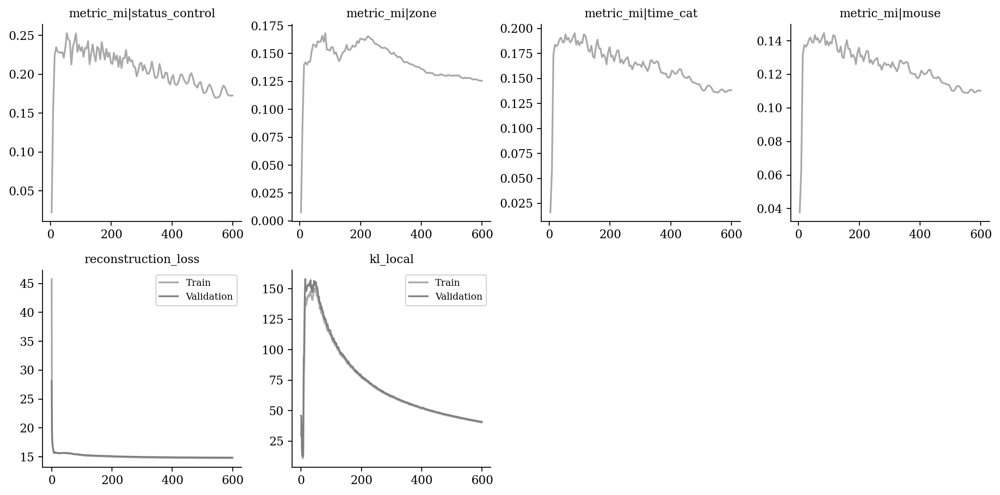

In [15]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|status_control", "metric_mi|zone", "metric_mi|time_cat", "metric_mi|mouse",
                 "reconstruction_loss", "kl_local"]
)

In [16]:
from tardis._disentanglementmanager import DisentanglementManager as DM

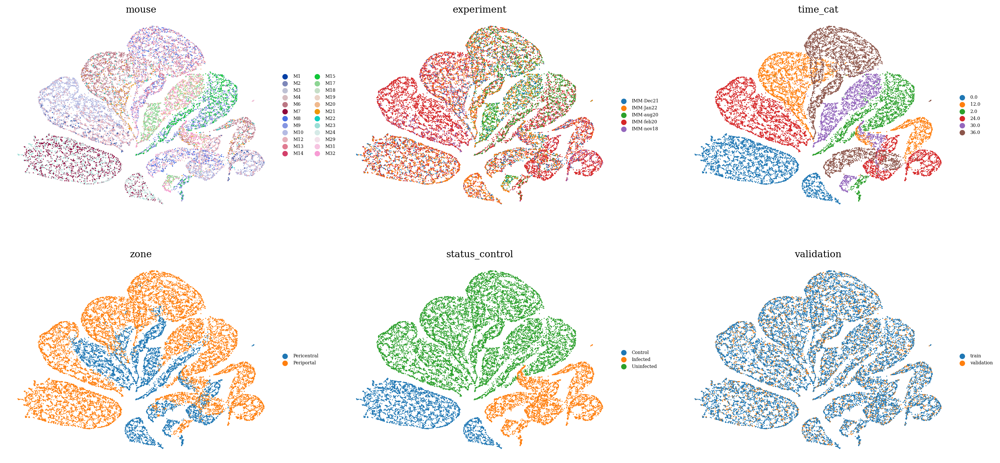

In [17]:
sublatent = DM.configurations.get_by_obs_key("status_control").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

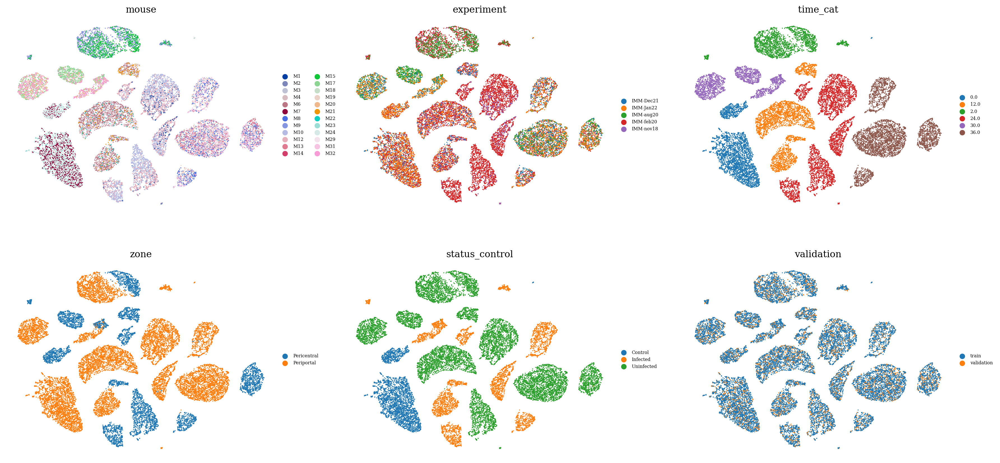

In [18]:
sublatent = DM.configurations.get_by_obs_key("time_cat").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

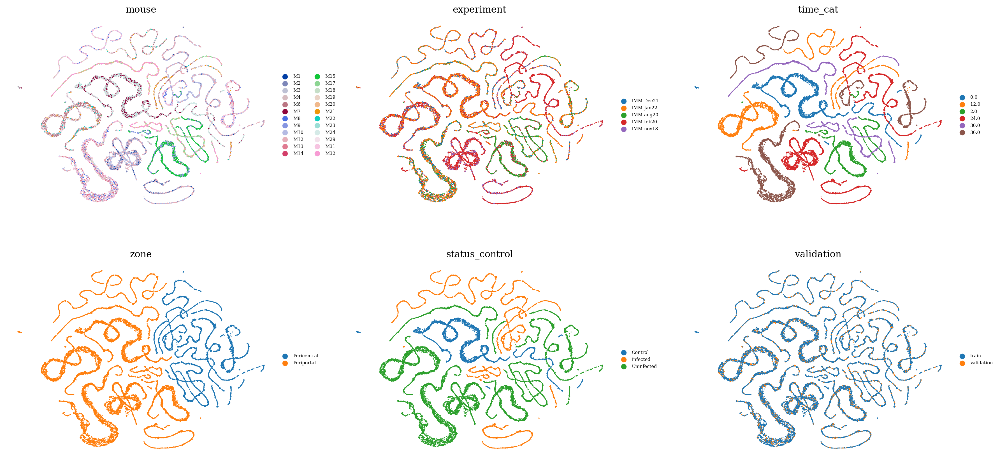

In [19]:
sublatent = DM.configurations.get_by_obs_key("zone").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

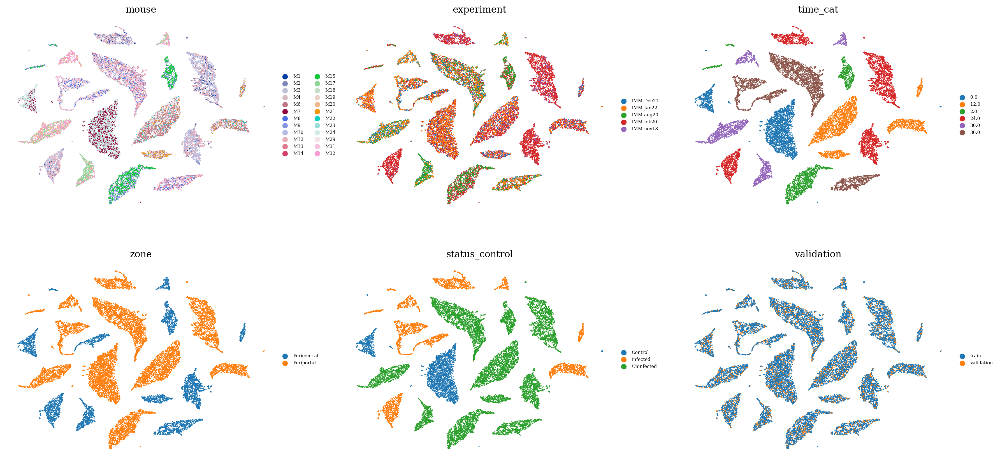

In [20]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

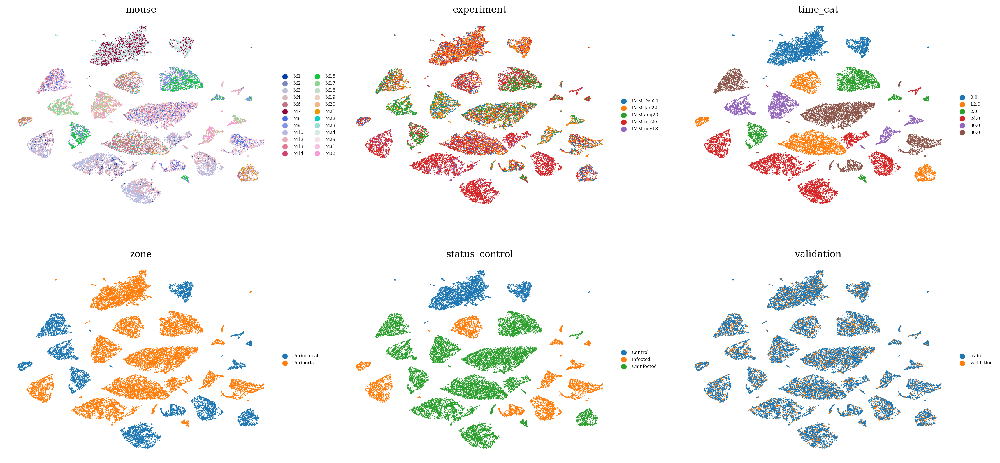

In [21]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['mouse', 'experiment', 'time_cat', 'zone', 'status_control', "validation"], 
        ncols=3,
        frameon=False,
        legend_fontsize="xx-small"
    )

In [22]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data, factors=factors, variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.5854912047725662

In [23]:
data = vae.get_latent_representation()

import sklearn
factors_indices = sorted([[indice, config.obs_key] for config in DM.configurations.items for indice in config.reserved_latent_indices])
factors = np.vstack([sklearn.preprocessing.LabelEncoder().fit_transform(
    adata.obs[j].copy().astype(str).values.flatten()
) for i, j in factors_indices]).T

data = data[:, [i for i, j in factors_indices]]

maxMIG = vae.get_MI_precalculated(data=data[vae.validation_indices, :], factors=factors[vae.validation_indices, :], variation="maxMIG", discretization_bins=256)
maxMIG_mean = np.mean(maxMIG)
maxMIG_mean

0.5611055809219329

In [24]:
vae.get_MI_normalized_training("zone")

{('validation', 'reserved'): 0.9974964464923917,
 ('validation', 'unreserved'): 0.43654683259292587,
 ('train', 'reserved'): 0.9964980052477309,
 ('train', 'unreserved'): 0.3981213271141711}

In [25]:
vae.get_MI_normalized_training("status_control")

{('validation', 'reserved'): 0.9836698067953341,
 ('validation', 'unreserved'): 0.5871054582642079,
 ('train', 'reserved'): 0.982911255723401,
 ('train', 'unreserved'): 0.5564173021380634}

In [26]:
vae.get_MI_normalized_training("time_cat")

{('validation', 'reserved'): 0.9761019680421268,
 ('validation', 'unreserved'): 0.5388306838726871,
 ('train', 'reserved'): 0.9748526016624015,
 ('train', 'unreserved'): 0.4947574850696455}